# Srilanka Dengue Outbreak Forecasting using Darts

## Environment Setup

In [1]:
!pip install darts
!pip install dask[dataframe]
!pip install statsmodels

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 8.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 917.3/917.3 kB 29.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 44.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 23.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.6/134.6 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.7/196.7 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 866.2/866.2 kB 20.2 MB/s eta 0:00

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. Imports

In [3]:
import os
import pickle
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from darts import TimeSeries

%matplotlib inline

## 2. Load Dataset

In [4]:
df = pd.read_csv("/content/drive/MyDrive/Datasets/Copy of Sri_lanka_dengue_cases_weather_weekly_2007_2024_.csv")

In [5]:
df.head()

,Unnamed: 0,District,Number_of_Cases,Week_Start_Date,Month,Year,Week,Week_End_Date,Avg Max Temp (°C),Avg Min Temp (°C),Avg Apparent Max Temp (°C),Avg Apparent Min Temp (°C),Total Precipitation (mm),Total Rain (mm),Avg Wind Speed (km/h),Max Wind Gusts (km/h),Weather Code,Avg Daylight Duration (hours),Avg Sunrise Time,Avg Sunset Time
0,0,Ampara,0,2007-01-01,1,2007,1,2007-01-08,26.9375,21.8625,28.8500,24.1000,8.0,8.0,18.2000,44.3,3,11.714583,376,1079
1,1,Ampara,0,2007-01-08,1,2007,2,2007-01-15,26.3500,23.3250,30.2625,26.7000,86.1,86.1,17.0250,43.6,53,11.733333,378,1082
2,2,Ampara,0,2007-01-15,1,2007,3,2007-01-22,27.2125,23.1625,29.5750,25.9625,3.1,3.1,20.1875,48.2,51,11.754167,380,1085
3,3,Ampara,0,2007-01-22,1,2007,4,2007-01-29,26.7250,23.0375,29.9500,26.1125,53.6,53.6,17.2000,42.5,61,11.783333,381,1088
4,4,Ampara,0,2007-01-29,1,2007,5,2007-02-05,27.3625,22.9625,30.7500,26.1250,8.2,8.2,17.2625,40.0,51,11.812500,382,1090


In [6]:
df = df.drop(columns = ["Unnamed: 0"])

In [7]:
len(df)

22900

In [8]:
districts = df['District'].unique()
districts

array(['Ampara', 'Anuradhapura', 'Badulla', 'Batticaloa', 'Colombo',
       'Galle', 'Gampaha', 'Hambantota', 'Jaffna', 'Kalutara', 'Kandy',
       'Kegalle', 'Kilinochchi', 'Kurunegala', 'Mannar', 'Matale',
       'Matara', 'Monaragala', 'Mullaitivu', 'NuwaraEliya', 'Polonnaruwa',
       'Puttalam', 'Ratnapura', 'Trincomalee', 'Vavuniya'], dtype=object)

## 3. Small Visualization

In [9]:
# Check Duplicate values
duplicates = df[['District', 'Week_Start_Date', 'Week_End_Date']].duplicated().any()
if duplicates:
    print("There are duplicate values.")
else:
    print("No duplicates found.")

No duplicates found.


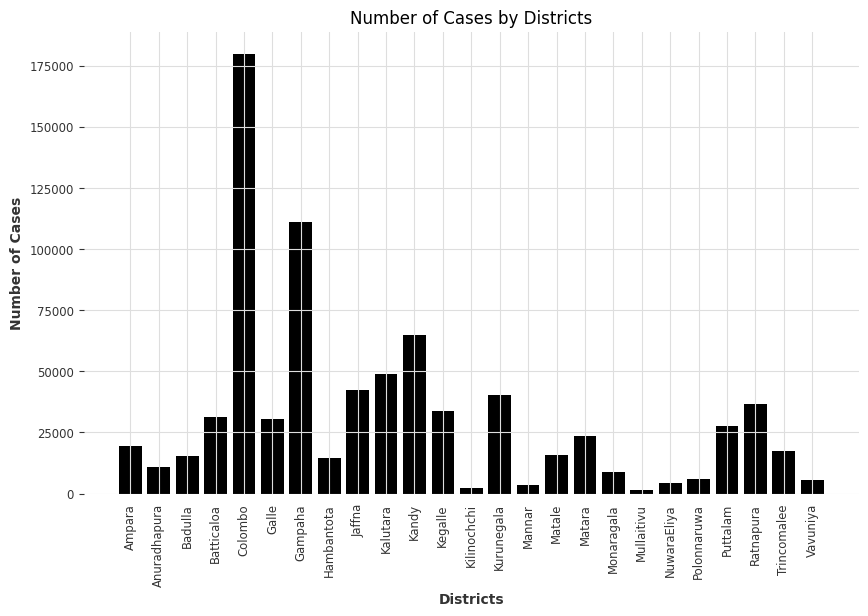

In [10]:
# Group by District and sum the Number of Cases
district_cases = df.groupby('District')['Number_of_Cases'].sum().reset_index()

# Plotting the histogram
plt.figure(figsize=(10, 6))
plt.bar(district_cases['District'], district_cases['Number_of_Cases'])
plt.xlabel('Districts')
plt.ylabel('Number of Cases')
plt.title('Number of Cases by Districts')
plt.xticks(rotation=90)
plt.show()


## 4. Minor pre-processing
1. Only taking single timestamp for each row. Either `Week_Start_Date` or `Week_Start_Date`. We gonna take `Week_End_Date`.
2. Convert the `Week_End_Date` to Python Datetime format.
3. Eliminate un-used features such as `Week_Start_Date`, `Month`, `Year`, and `Week`

In [11]:
df['Week_End_Date'] = pd.to_datetime(df['Week_End_Date'])

In [12]:
df.head()

,District,Number_of_Cases,Week_Start_Date,Month,Year,Week,Week_End_Date,Avg Max Temp (°C),Avg Min Temp (°C),Avg Apparent Max Temp (°C),Avg Apparent Min Temp (°C),Total Precipitation (mm),Total Rain (mm),Avg Wind Speed (km/h),Max Wind Gusts (km/h),Weather Code,Avg Daylight Duration (hours),Avg Sunrise Time,Avg Sunset Time
0,Ampara,0,2007-01-01,1,2007,1,2007-01-08,26.9375,21.8625,28.8500,24.1000,8.0,8.0,18.2000,44.3,3,11.714583,376,1079
1,Ampara,0,2007-01-08,1,2007,2,2007-01-15,26.3500,23.3250,30.2625,26.7000,86.1,86.1,17.0250,43.6,53,11.733333,378,1082
2,Ampara,0,2007-01-15,1,2007,3,2007-01-22,27.2125,23.1625,29.5750,25.9625,3.1,3.1,20.1875,48.2,51,11.754167,380,1085
3,Ampara,0,2007-01-22,1,2007,4,2007-01-29,26.7250,23.0375,29.9500,26.1125,53.6,53.6,17.2000,42.5,61,11.783333,381,1088
4,Ampara,0,2007-01-29,1,2007,5,2007-02-05,27.3625,22.9625,30.7500,26.1250,8.2,8.2,17.2625,40.0,51,11.812500,382,1090


** The trend of cases of all 25 districts

In [13]:
import plotly.express as px

# List of all districts
districts = df['District'].unique()

for district in districts:
    # Filter data for the current district
    df_district = df[df['District'] == district]

    # Create an interactive line plot using Plotly without markers
    fig = px.line(
        df_district,
        x="Week_End_Date",
        y="Number_of_Cases",
        title=f"Number of Cases Over Time - {district}",
        labels={'Week_End_Date': 'Week End Date', 'Number_of_Cases': 'Number of Cases'}
    )

    # Customize the layout for a bigger and clearer plot
    fig.update_layout(
        width=1000,  # Width of the figure
        height=600,  # Height of the figure
        title_font_size=18,
        xaxis_title_font_size=14,
        yaxis_title_font_size=14,
        hovermode="x"  # Show hover data for the x-axis
    )

    # Show the interactive plot with zoom and pan features
    fig.show()


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



## 5. Modelling
List of classical/statistical models.
- ARIMA
- AutoARIMA
- VARIMA
- ExponentialSmoothing
- FourTheta
- Prophet
- FFT
- KalmanForecaster

In [14]:
from darts.models import ARIMA, AutoARIMA, VARIMA, ExponentialSmoothing, FourTheta, Prophet, FFT, KalmanForecaster
from darts.metrics import rmse, mae, smape, r2_score, rmsle
import plotly.graph_objects as go

In [15]:
models = [ARIMA(p=12, d=1, q=0), AutoARIMA(), ExponentialSmoothing(), Prophet(), FFT(), KalmanForecaster()]

In [16]:
def save_model(model, model_name, district_name, folder='saved_models'):
    # Create directory if it doesn't exist
    os.makedirs(folder, exist_ok=True)

    # Define the model file path
    model_file = os.path.join(folder, f'{district_name}_{model_name}.pkl')

    # Save the model using pickle
    with open(model_file, 'wb') as f:
        pickle.dump(model, f)
    print(f"Model saved for {district_name}: {model_file}")

In [22]:
def train_and_forecast(train_series, val_series, future_covariates, model, district_name):
    if future_covariates:
      model.fit(train_series, future_covariates=future_covariates)
    else:
      model.fit(train_series)

    model_folder = f"/content/drive/MyDrive/Models/{district_name}"
    # Save Model
    save_model(model, type(model).__name__, model_folder)

    # Forecast for the next 12 weeks
    forecast=None
    if future_covariates:
      forecast = model.predict(n=len(val_series), future_covariates=future_covariates)
    else:
      forecast = model.predict(n=len(val_series))



    # Plot the results
    plt.figure(figsize=(12, 6))
    train_series.plot(label='Historical Data')
    val_series.plot(label='Validation Data', color='orange')
    forecast.plot(label='Forecast', color='green')
    plt.legend()
    plt.title(f"Forecast vs Validation for {district_name}")
    plt.show()

    # Calculate metrics
    val_values = val_series.values()
    forecast_values = forecast.values()

    # Ensure the forecast and validation values are the same length
    assert len(val_values) == len(forecast_values), "Forecast and validation series must have the same length for metrics calculation."

    # Compute metrics
    error_rmse = rmse(val_series, forecast)
    error_mae = mae(val_series, forecast)
    error_smape = smape(val_series, forecast)
    error_r2 = r2_score(val_series, forecast)
    error_rmsle = rmsle(val_series, forecast)

    errors = {
        "RMSE": error_rmse,
        "MAE": error_mae,
        "SMAPE": error_smape,
        "R2": error_r2,
        "RMSLE": error_rmsle
    }
    results = [forecast, errors]
    return results

In [23]:
def main(data, models):
    districts = data['District'].unique()
    final_output = []
    for district in districts:
      # Filter data for the specified district
      district_data = data[data['District'] == district]

      # Ensure the 'Week_End_Date' column is in datetime format
      district_data['Week_End_Date'] = pd.to_datetime(district_data['Week_End_Date'])

      # Prepare the data for ARIMA
      series = TimeSeries.from_dataframe(district_data, time_col='Week_End_Date', value_cols=['Number_of_Cases', 'Avg Max Temp (°C)', "Avg Min Temp (°C)", "Avg Apparent Max Temp (°C)", "Avg Apparent Min Temp (°C)", "Total Precipitation (mm)", "Avg Daylight Duration (hours)", "Avg Sunrise Time", "Avg Sunset Time", "Avg Wind Speed (km/h)"])

      # Split series
      # Set aside the last 12 weeks as a validation series
      train_data, val_data = series["Number_of_Cases"][:-12], series["Number_of_Cases"][-12:]
      future_covariates = series[["Avg Max Temp (°C)", "Avg Min Temp (°C)", "Avg Apparent Max Temp (°C)", "Avg Apparent Min Temp (°C)", "Total Precipitation (mm)", "Avg Daylight Duration (hours)", "Avg Sunrise Time", "Avg Sunset Time", "Avg Wind Speed (km/h)"]]

      print(f"Training length: {len(train_data)}")
      print(f"Validation length: {len(val_data)}")

      district_output = []
      for index, m in enumerate(models):
        if index >= 2:
          future_covariates = None
        result = train_and_forecast(train_data, val_data, future_covariates, m, district)
        district_output.append(result)

      final_output.append(district_output)

    return final_output


<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_ARIMA.pkl


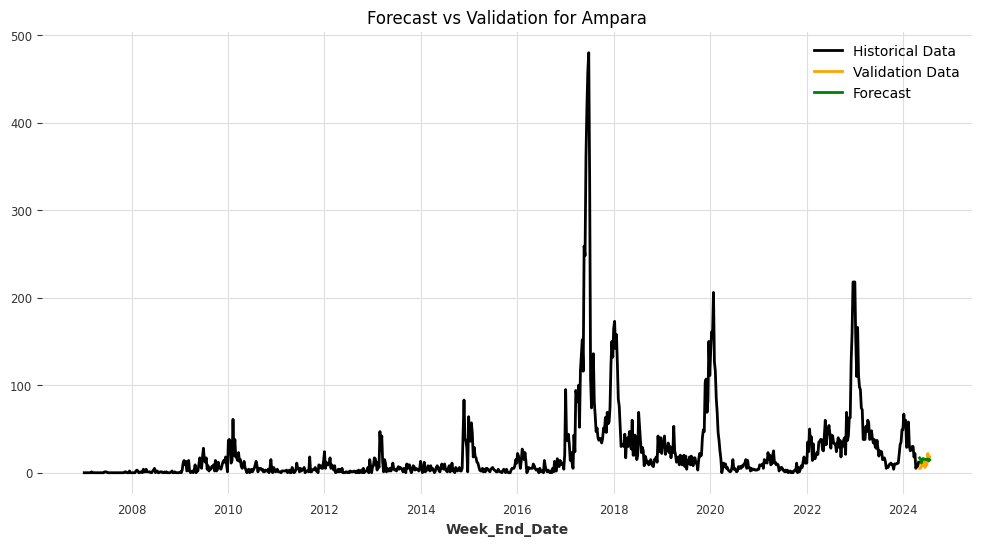

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_AutoARIMA.pkl


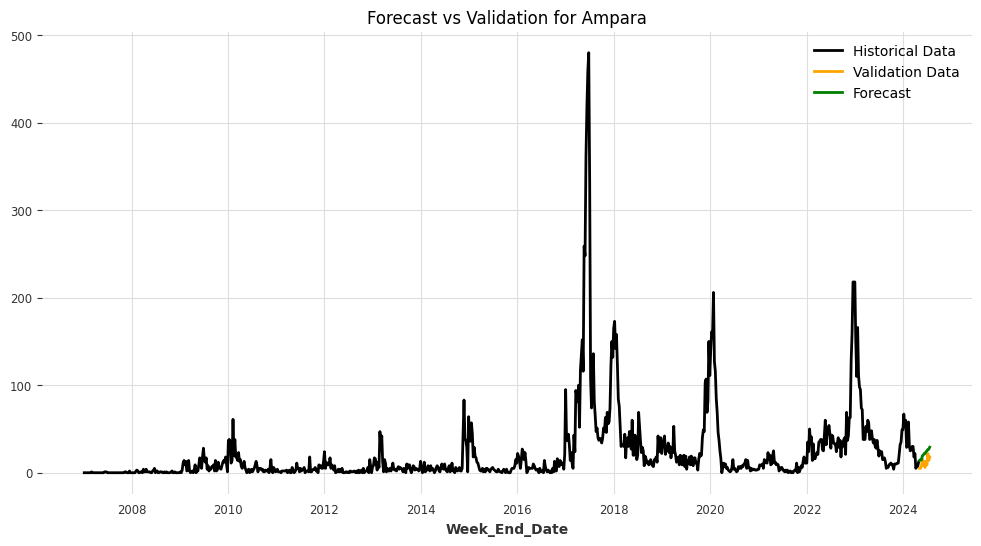

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_ExponentialSmoothing.pkl


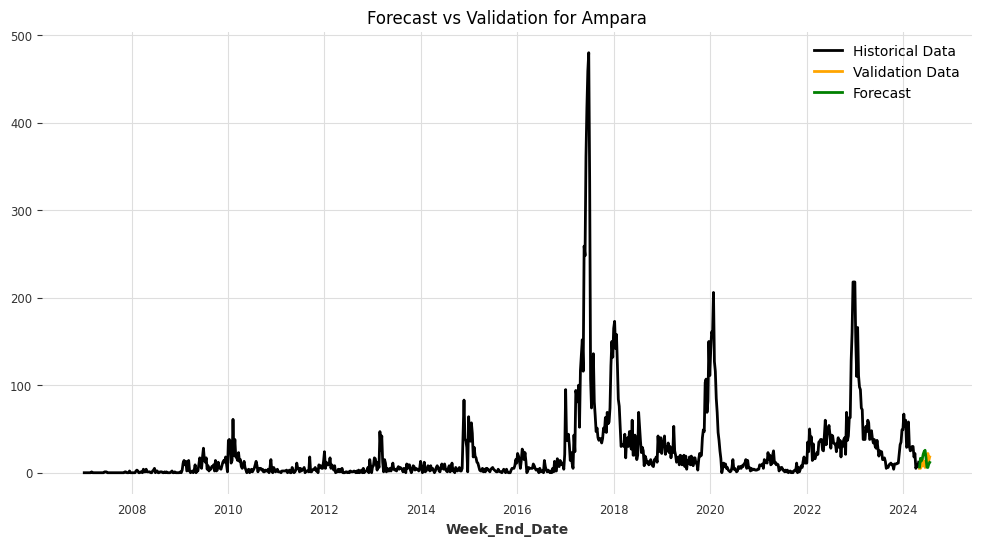

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/e2fmj7xa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/a7ithv2v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89058', 'data', 'file=/tmp/tmpu8y_3fe_/e2fmj7xa.json', 'init=/tmp/tmpu8y_3fe_/a7ithv2v.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_model8l_e2lg8/prophet_model-20240910154456.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:44:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:44:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_Prophet.pkl


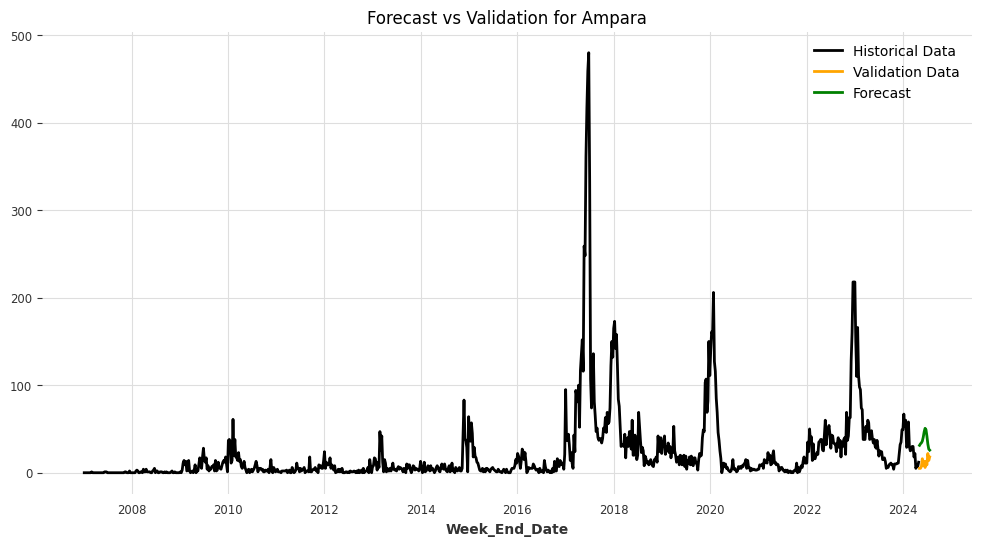

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_FFT.pkl


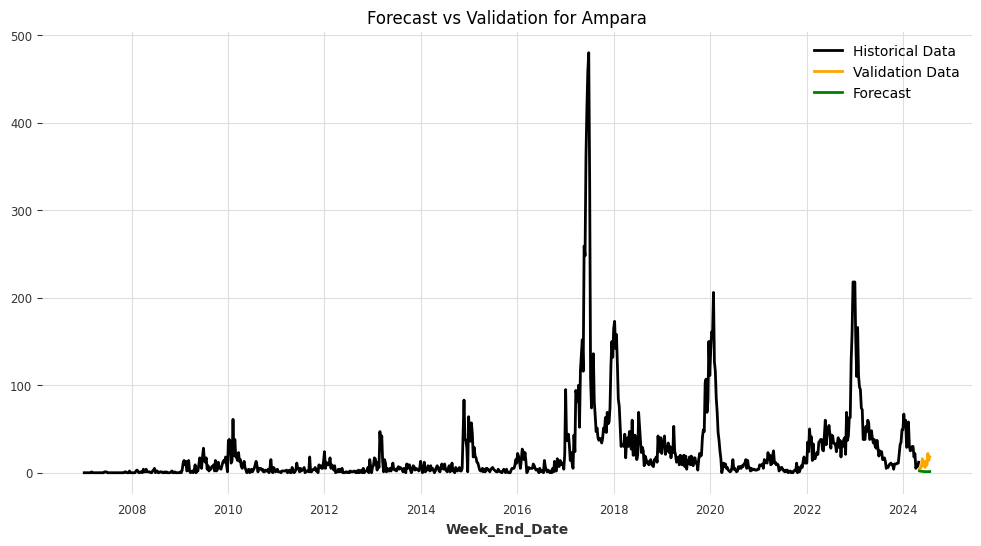

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_KalmanForecaster.pkl


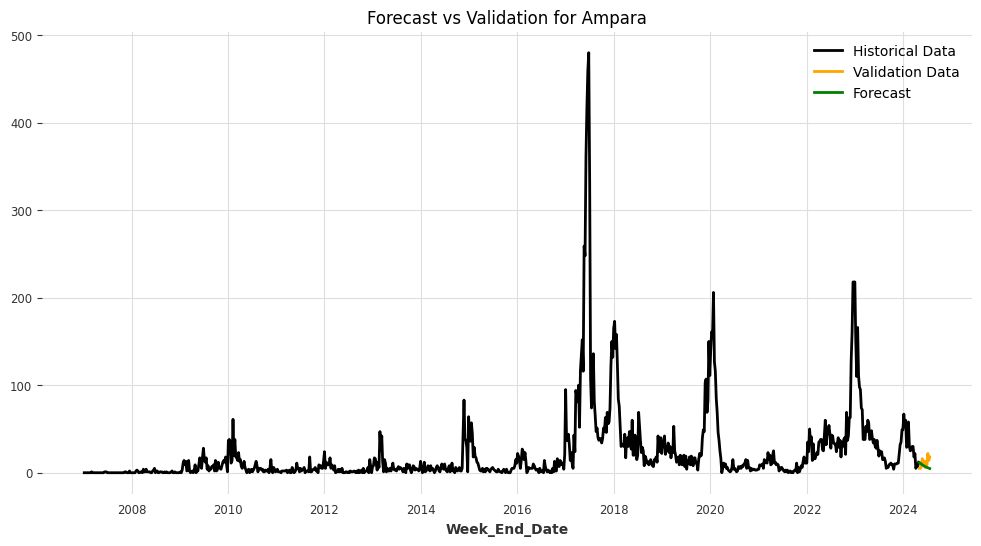

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_ARIMA.pkl


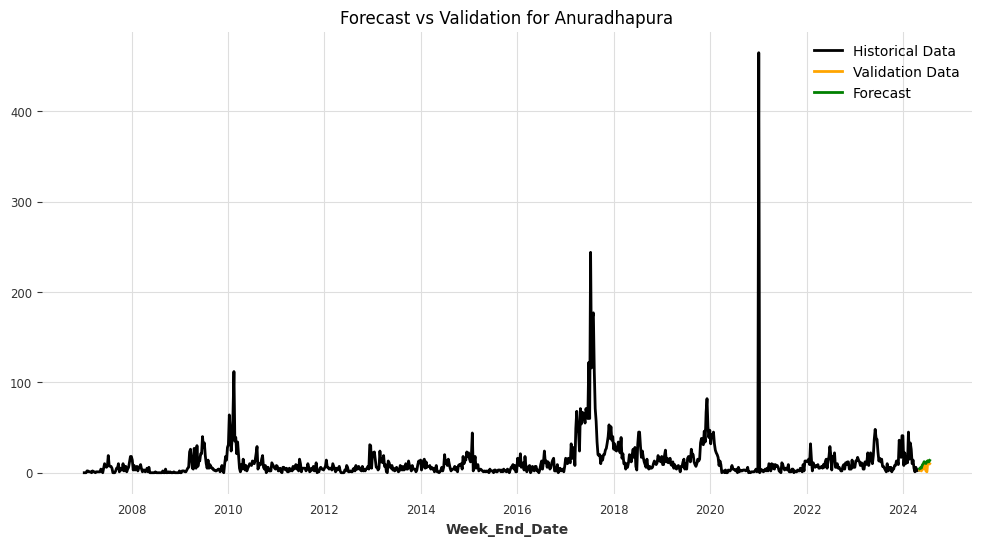

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_AutoARIMA.pkl


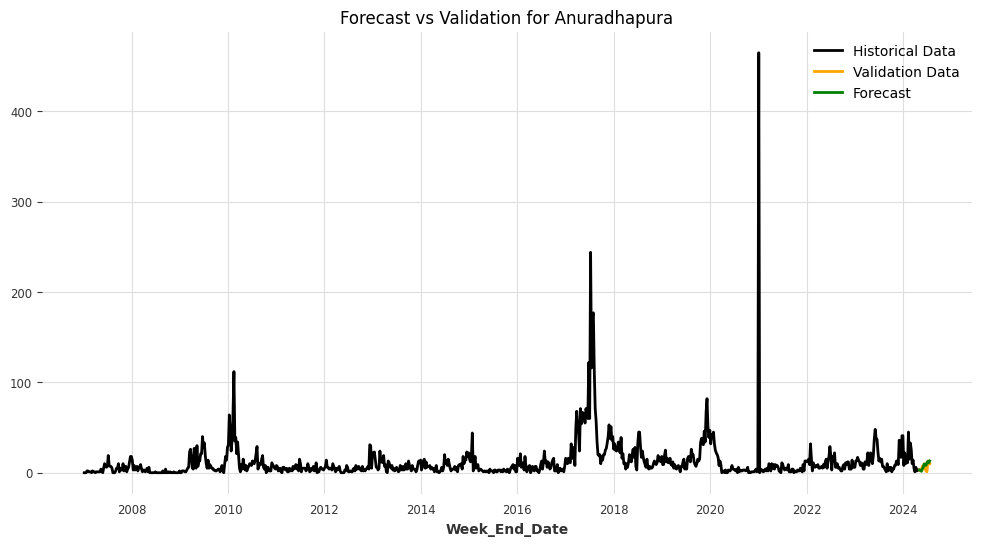

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_ExponentialSmoothing.pkl


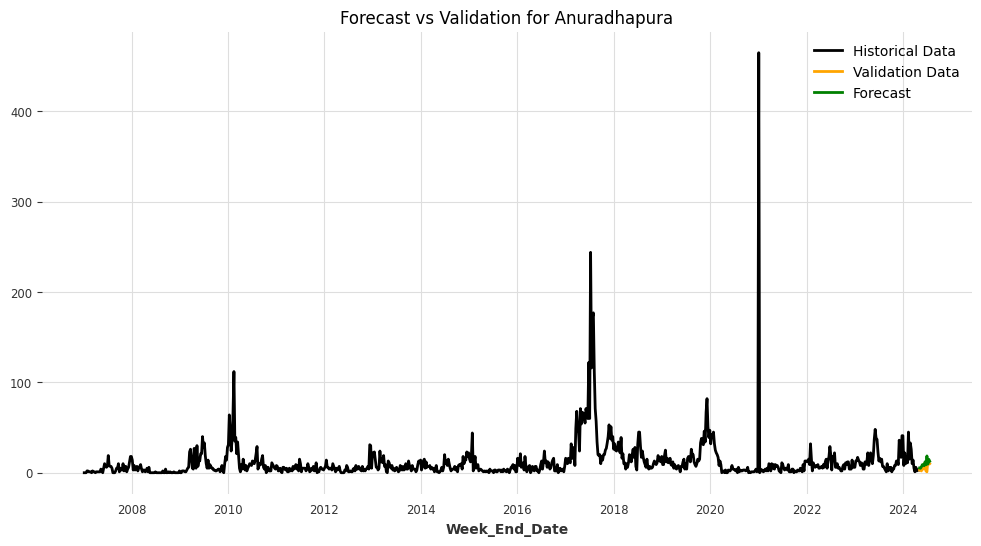

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/72imu_el.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/7wie_6ud.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11559', 'data', 'file=/tmp/tmpu8y_3fe_/72imu_el.json', 'init=/tmp/tmpu8y_3fe_/7wie_6ud.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_model_5rqwr8o/prophet_model-20240910154617.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:46:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:46:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_Prophet.pkl


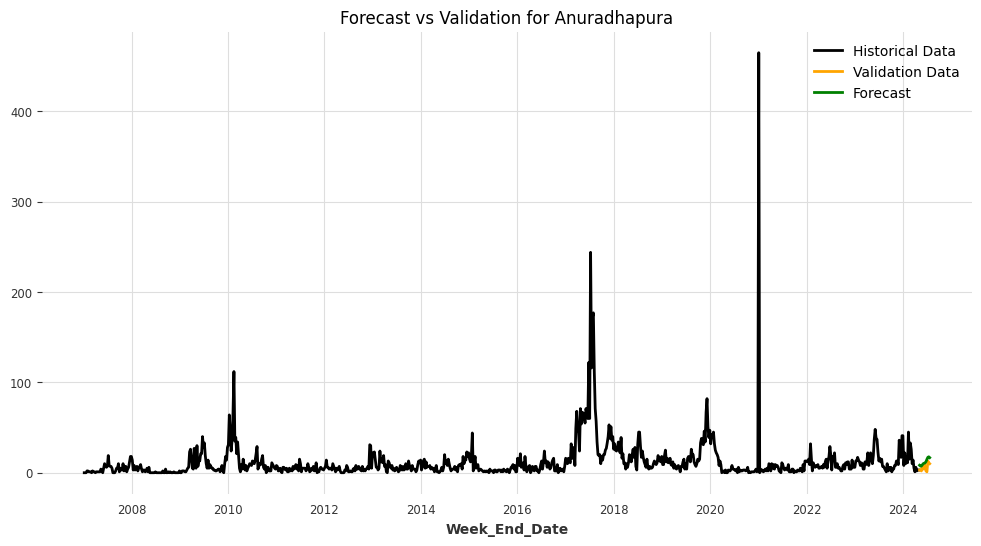

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_FFT.pkl


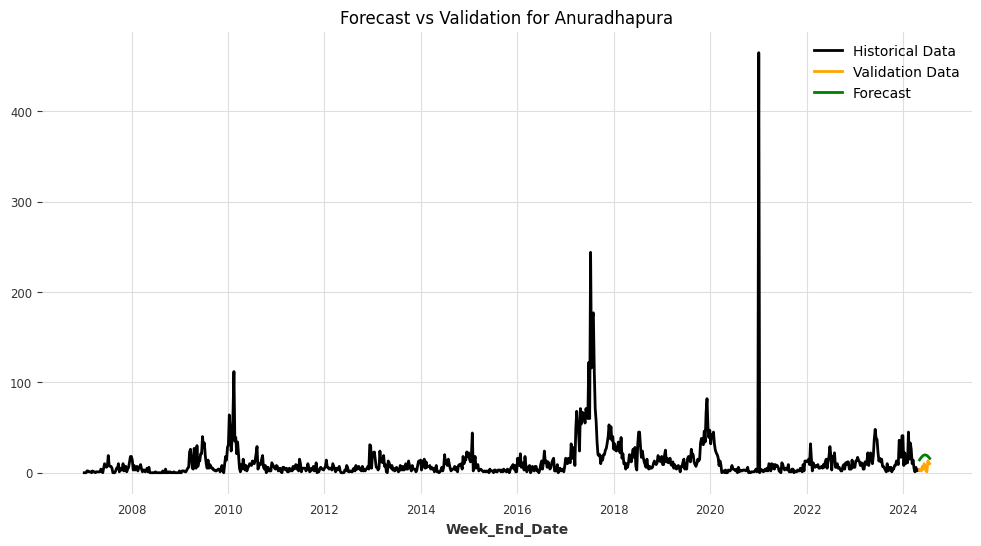

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_KalmanForecaster.pkl


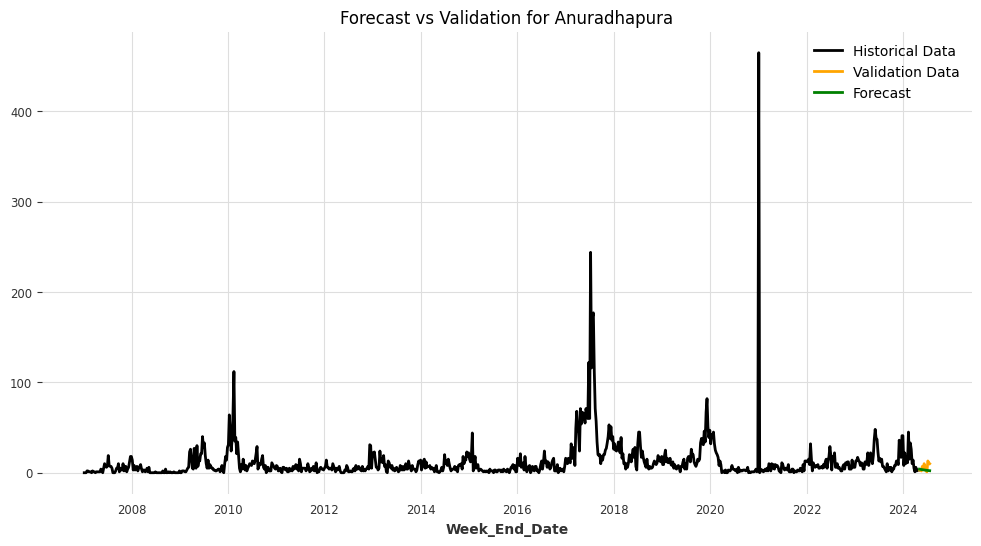

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_ARIMA.pkl


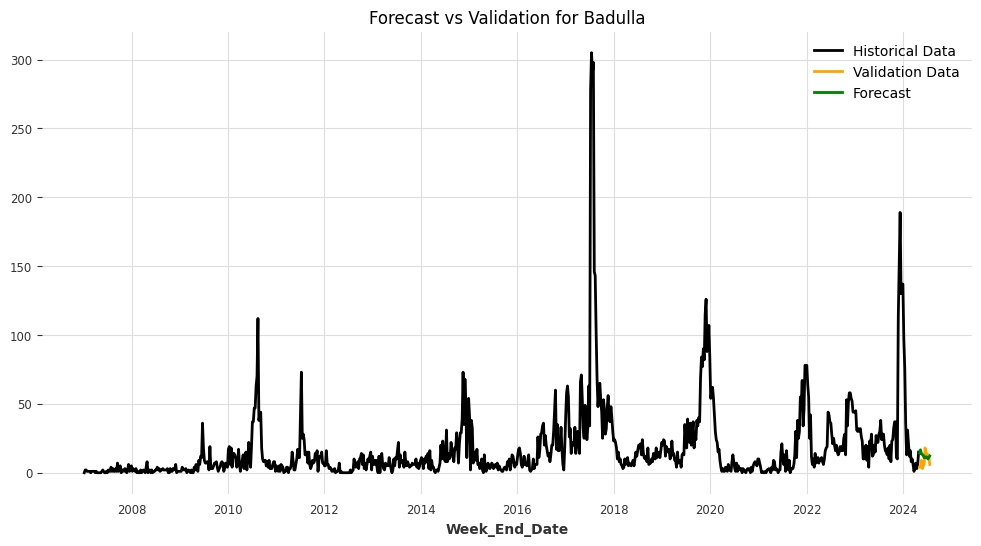

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_AutoARIMA.pkl


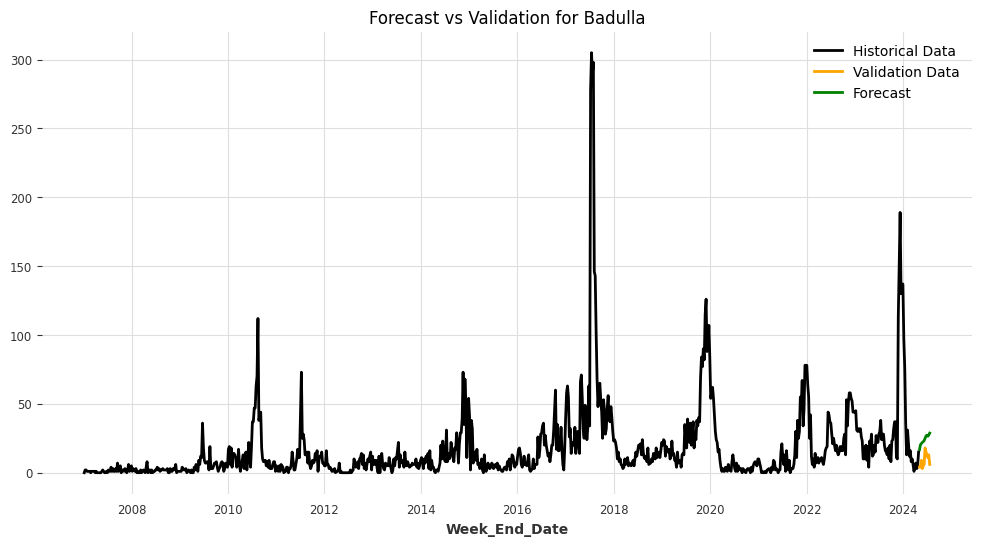

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_ExponentialSmoothing.pkl


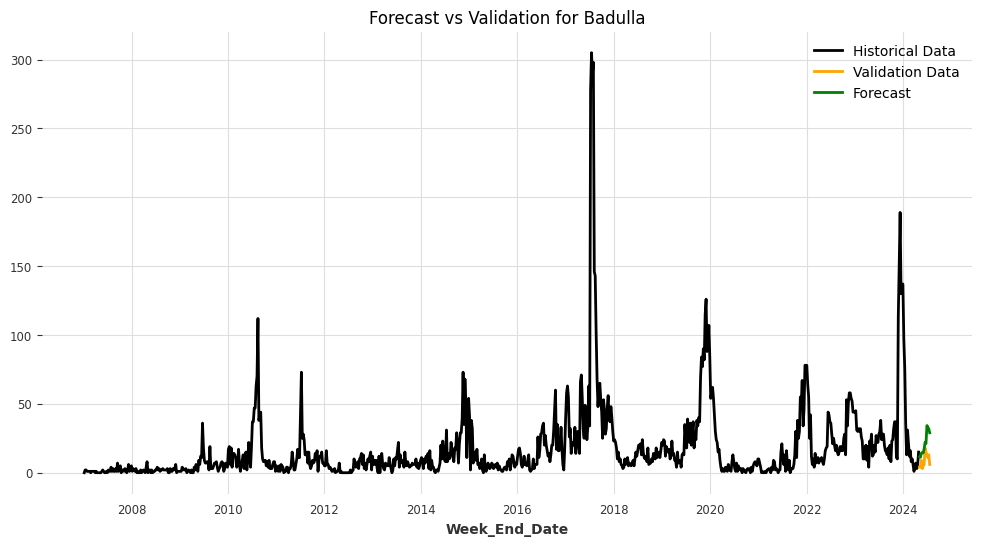

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/yxacl5mf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/qj8czkv9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92705', 'data', 'file=/tmp/tmpu8y_3fe_/yxacl5mf.json', 'init=/tmp/tmpu8y_3fe_/qj8czkv9.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modeljebqb1vk/prophet_model-20240910154842.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:48:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:48:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_Prophet.pkl


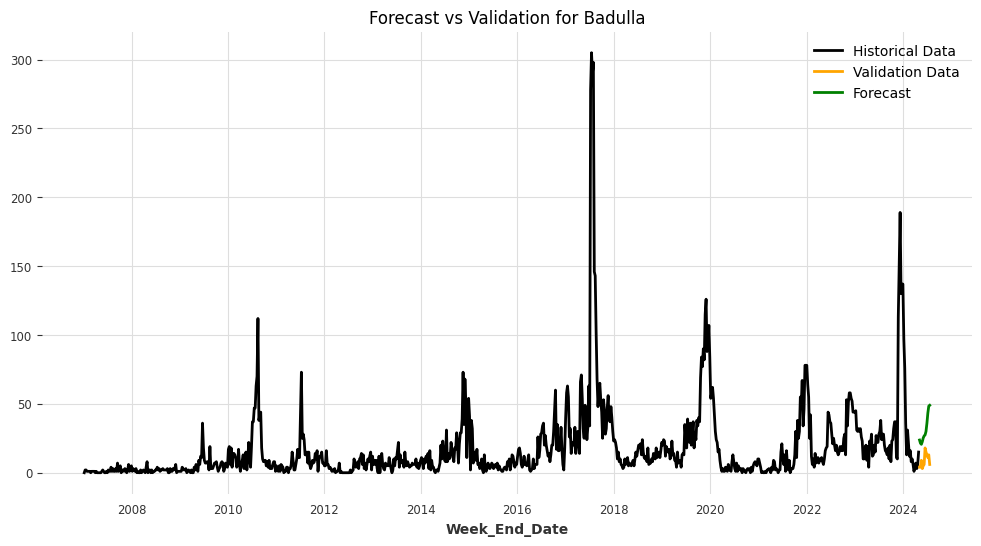

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_FFT.pkl


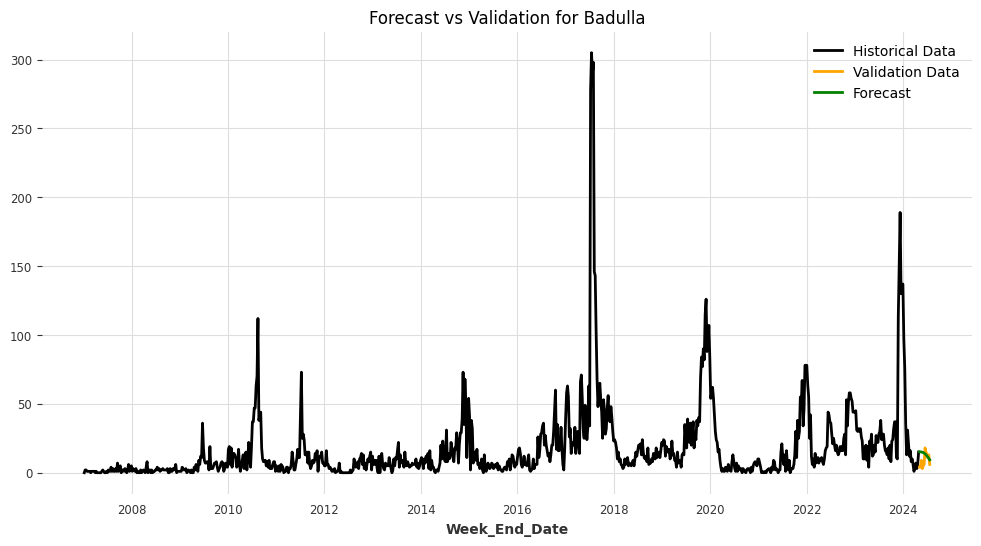

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_KalmanForecaster.pkl


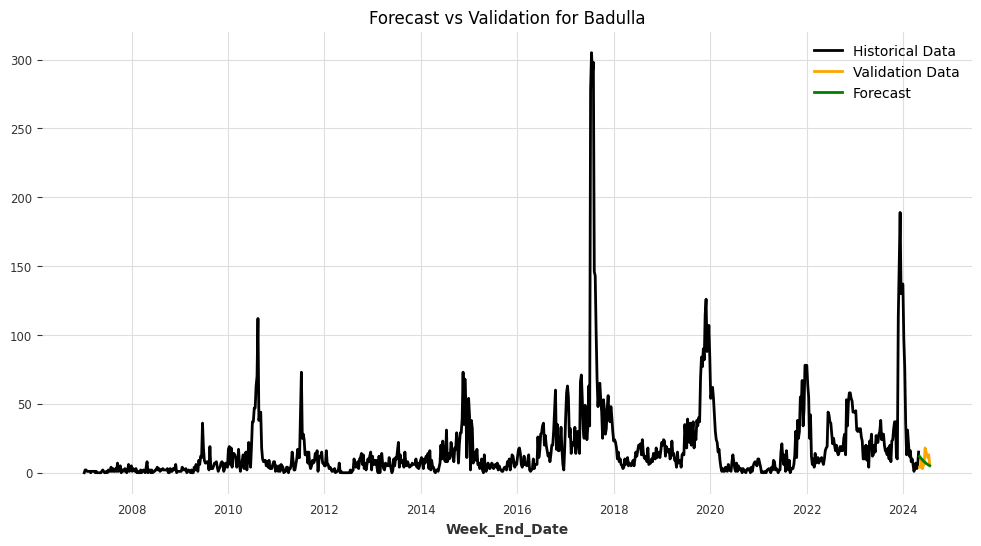

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_ARIMA.pkl


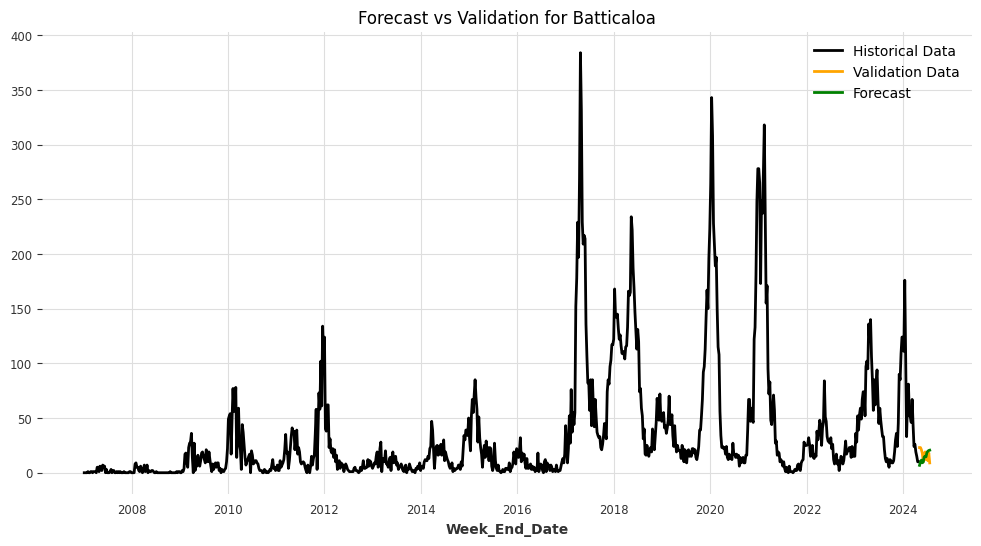

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_AutoARIMA.pkl


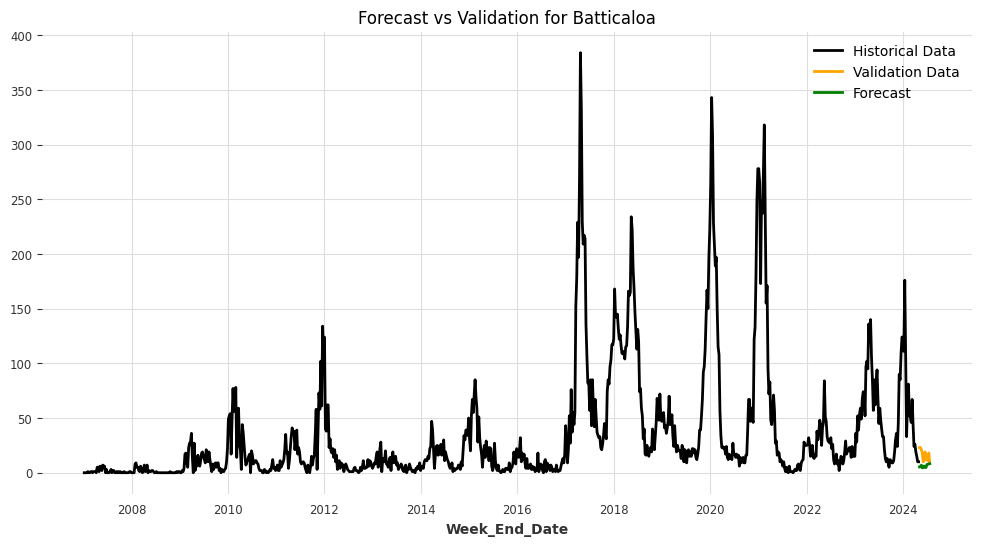

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_ExponentialSmoothing.pkl


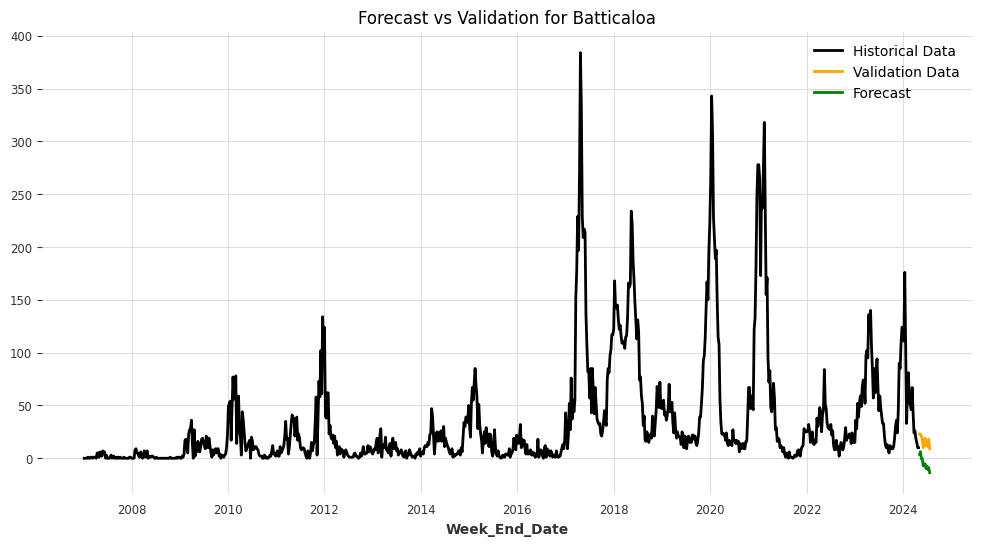

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/rliars6n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/oxi731u4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78008', 'data', 'file=/tmp/tmpu8y_3fe_/rliars6n.json', 'init=/tmp/tmpu8y_3fe_/oxi731u4.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_model051h5kpz/prophet_model-20240910155110.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:51:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:51:11 - cmds

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_Prophet.pkl


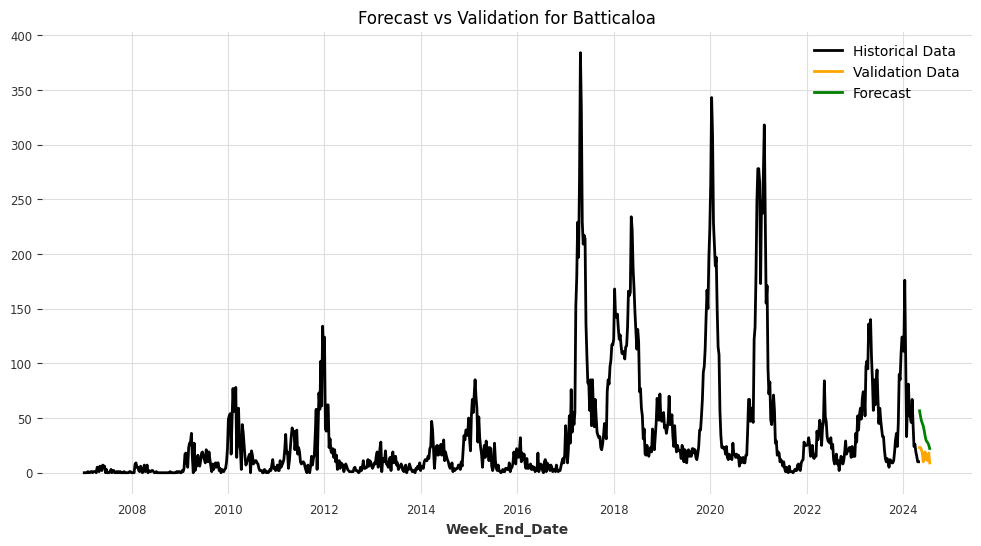

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_FFT.pkl


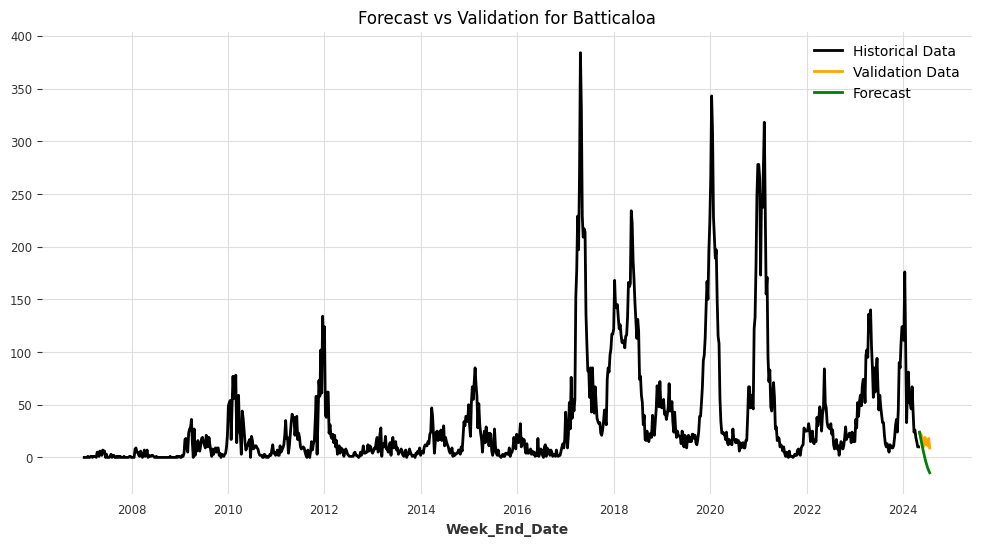

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_KalmanForecaster.pkl


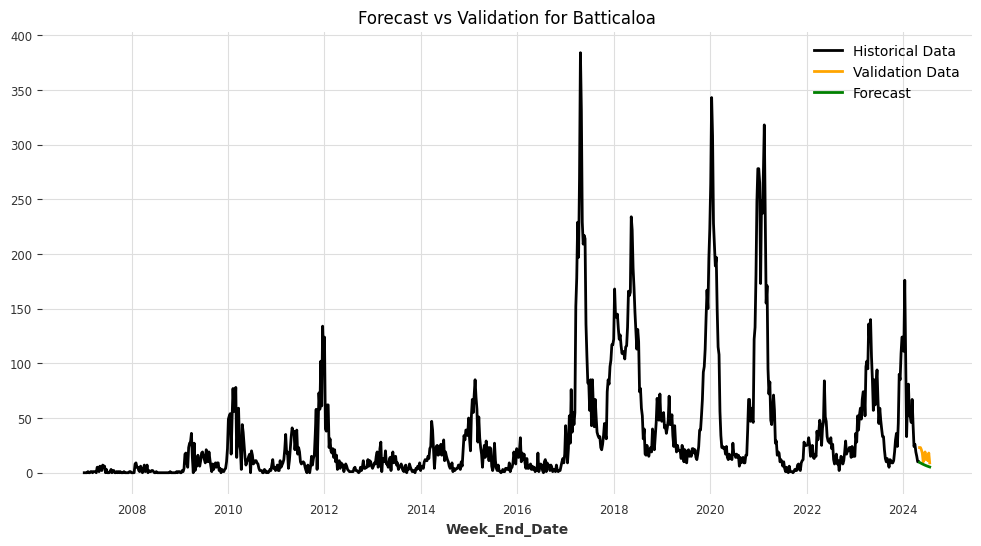

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_ARIMA.pkl


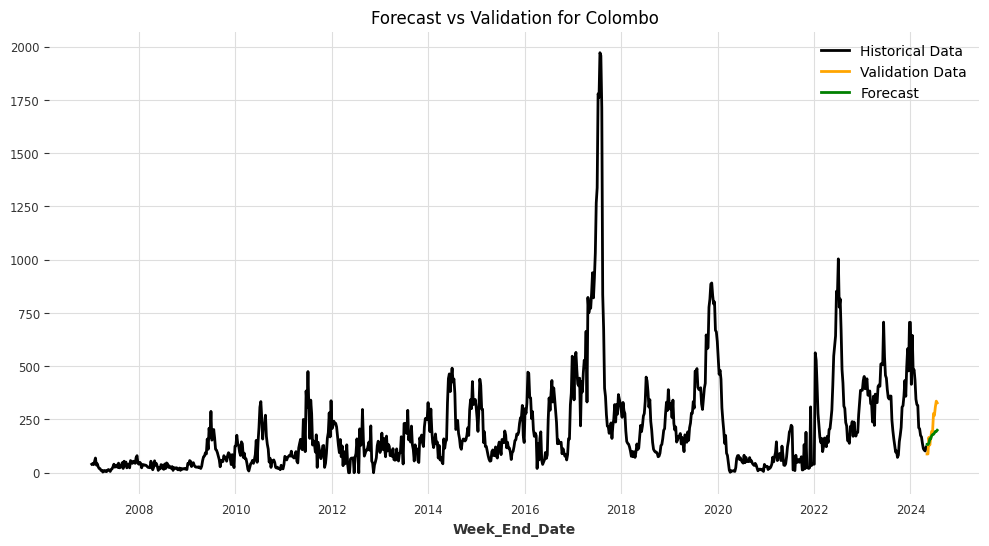

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_AutoARIMA.pkl


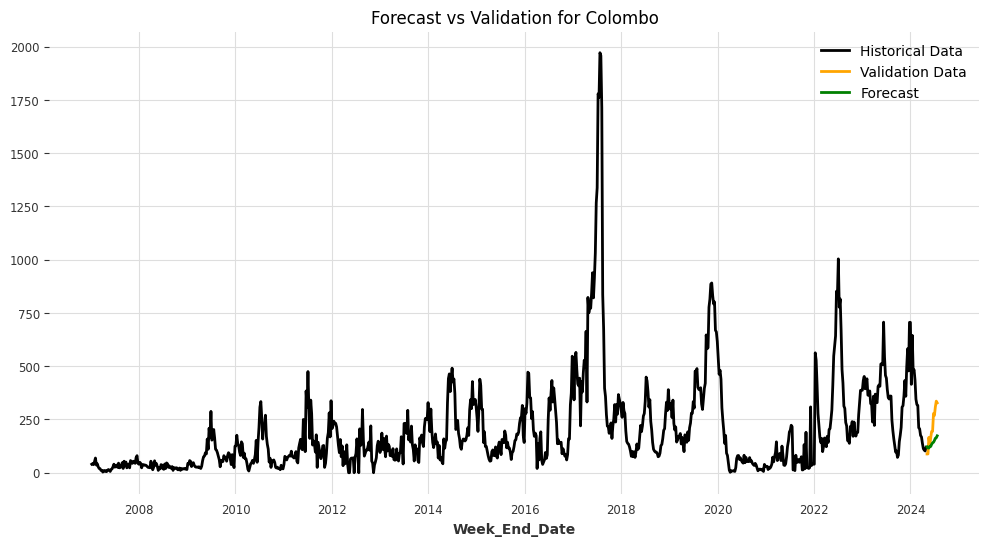

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_ExponentialSmoothing.pkl


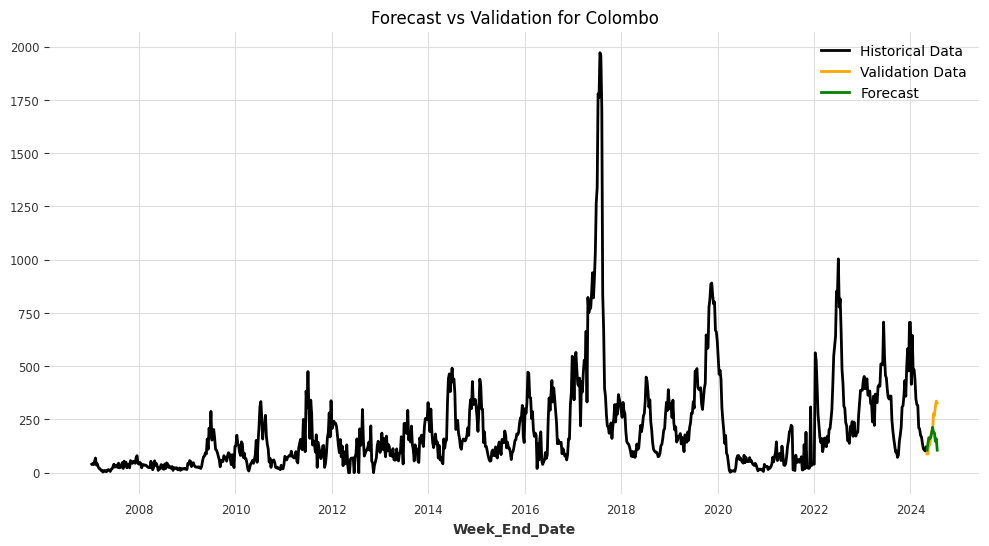

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/x0unkov0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/wjprqenr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47963', 'data', 'file=/tmp/tmpu8y_3fe_/x0unkov0.json', 'init=/tmp/tmpu8y_3fe_/wjprqenr.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modelb9yem5ux/prophet_model-20240910155225.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:52:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:52:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_Prophet.pkl


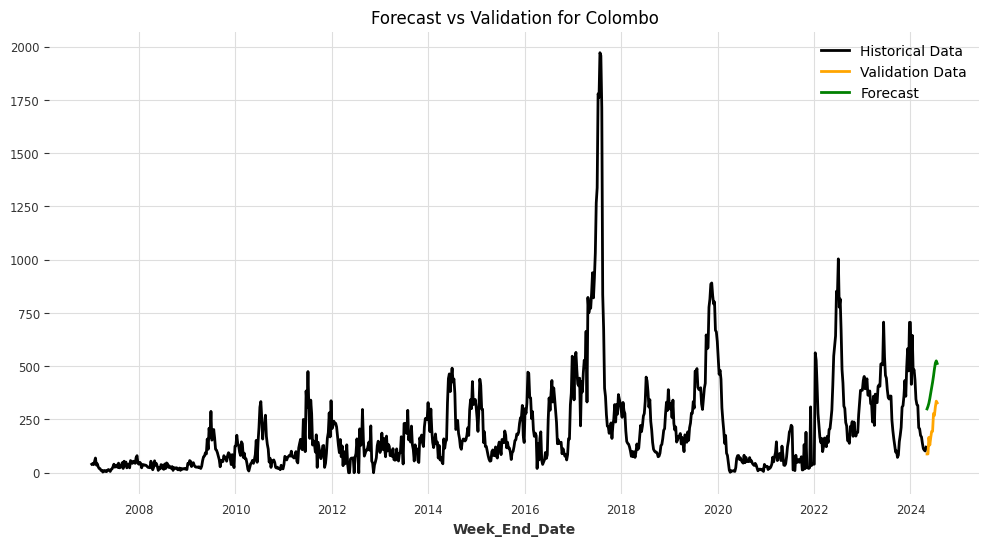

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_FFT.pkl


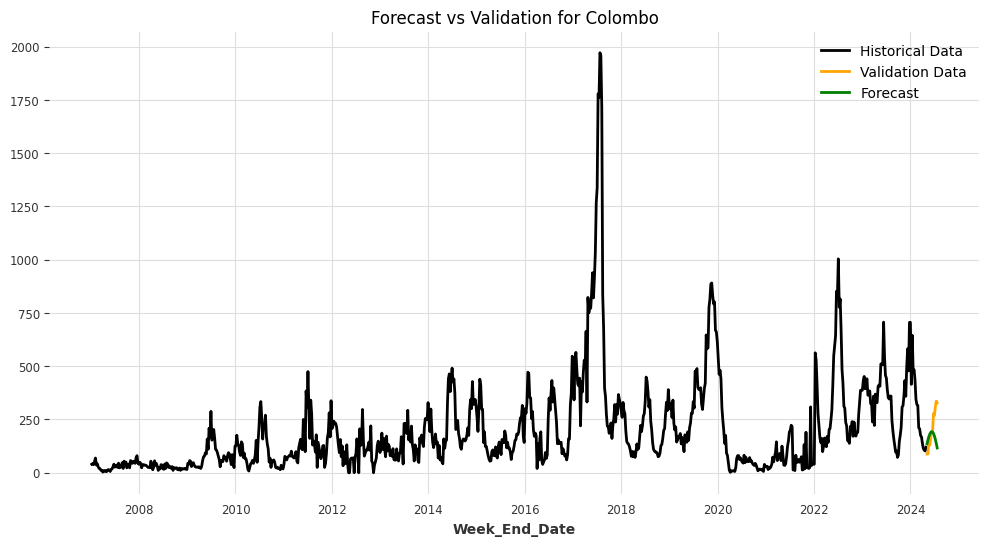

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_KalmanForecaster.pkl


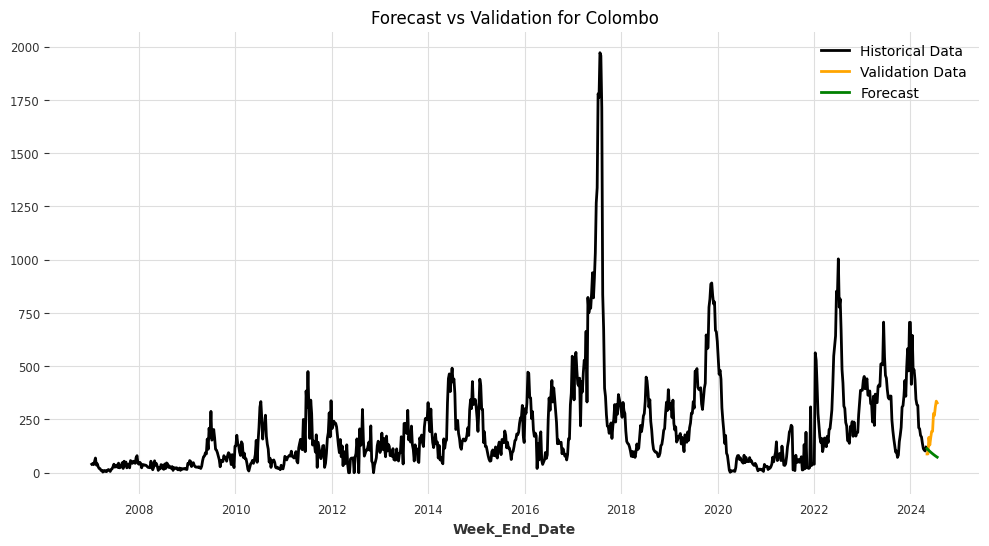

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_ARIMA.pkl


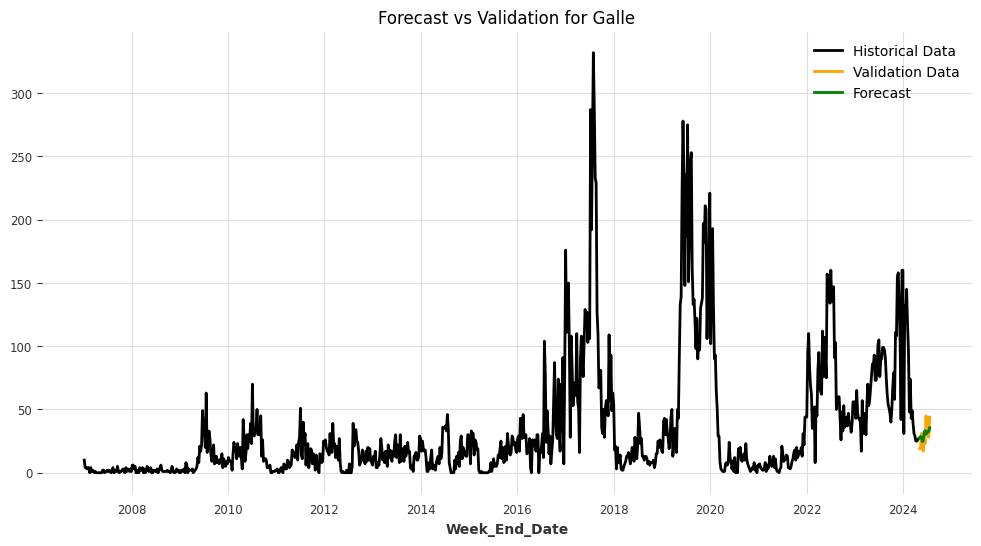

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_AutoARIMA.pkl


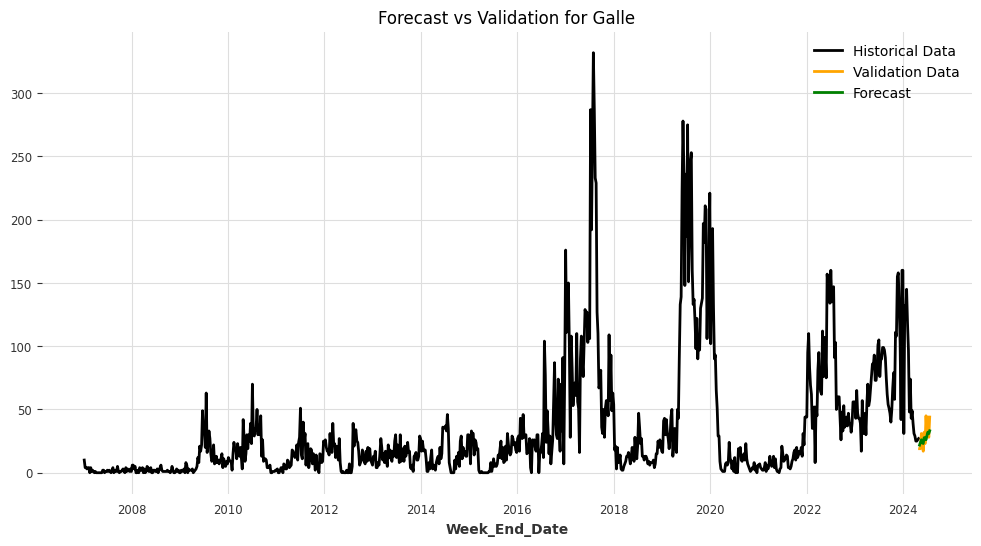

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_ExponentialSmoothing.pkl


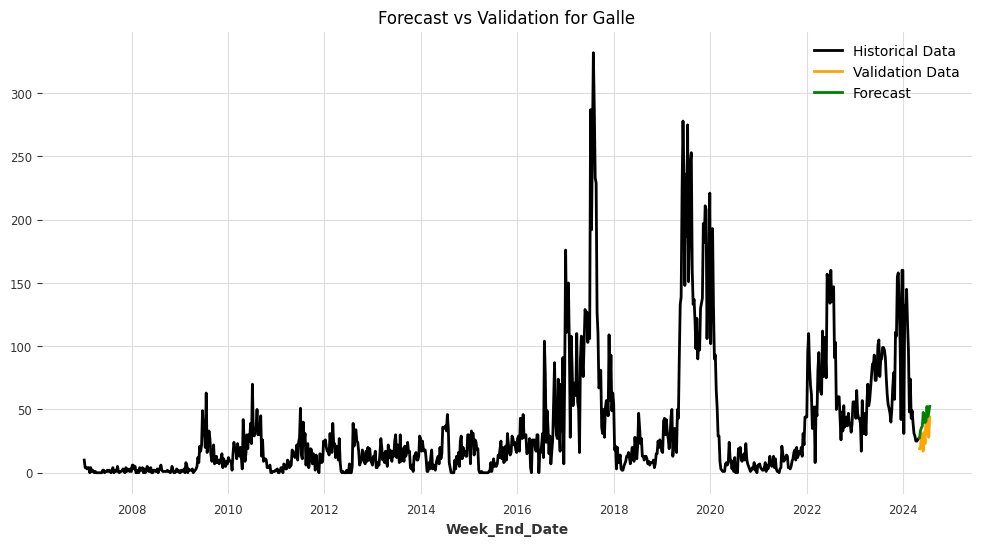

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/ehy1kq1e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/3o_mdj1x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82150', 'data', 'file=/tmp/tmpu8y_3fe_/ehy1kq1e.json', 'init=/tmp/tmpu8y_3fe_/3o_mdj1x.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modelsmz97npm/prophet_model-20240910155515.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:55:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:55:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_Prophet.pkl


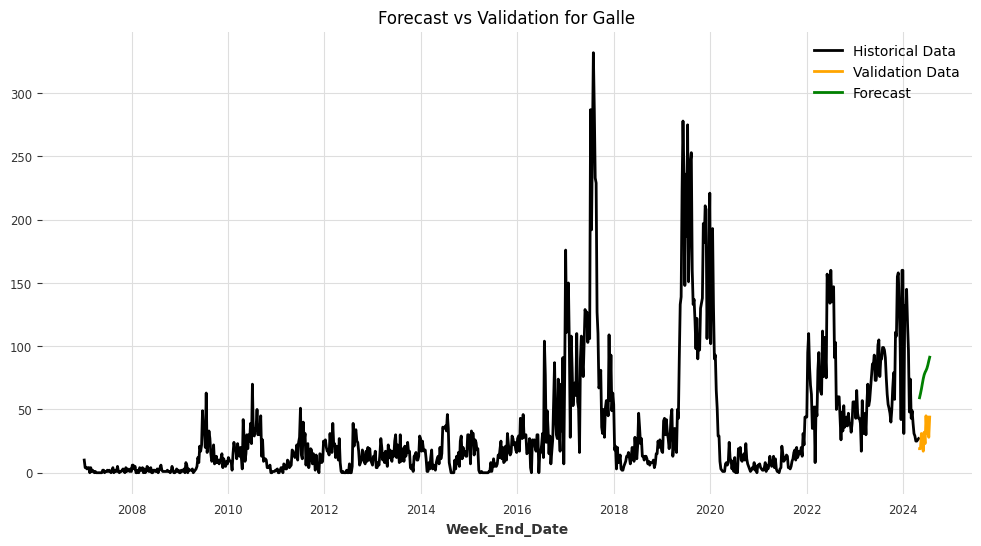

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_FFT.pkl


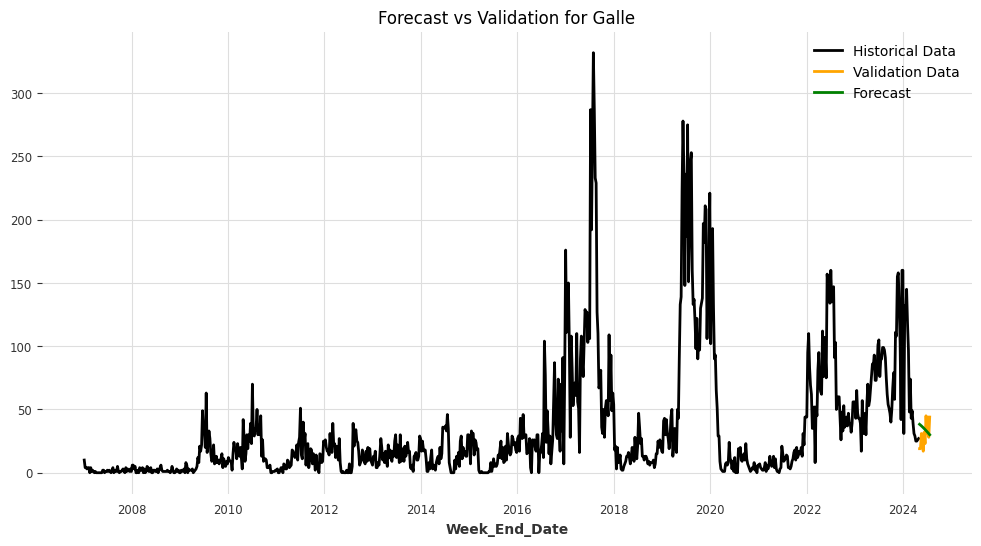

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_KalmanForecaster.pkl


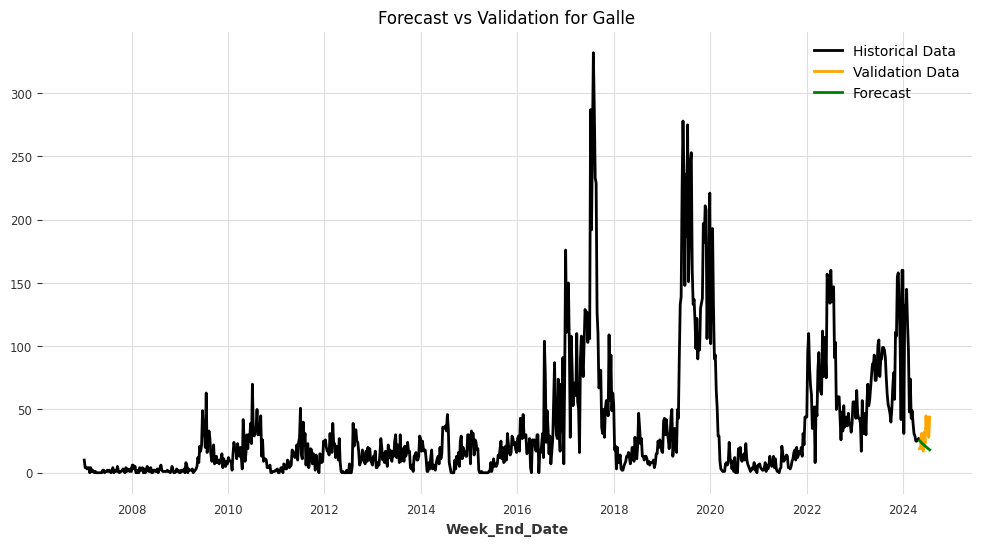

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_ARIMA.pkl


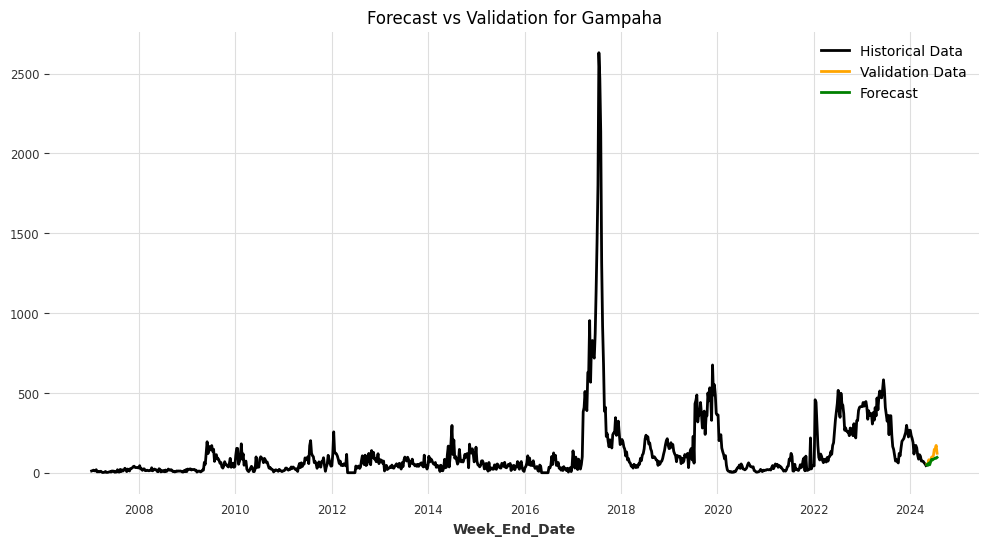

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_AutoARIMA.pkl


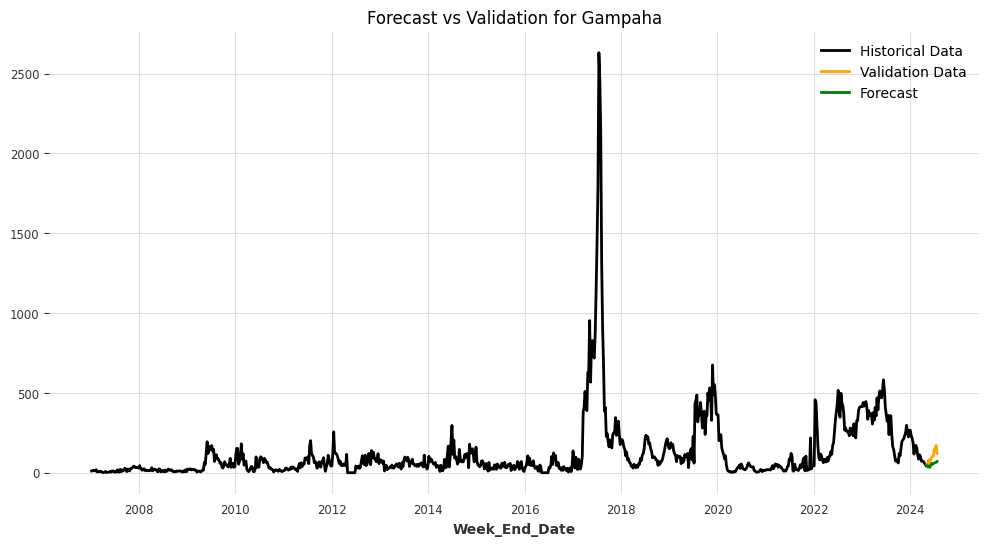

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_ExponentialSmoothing.pkl


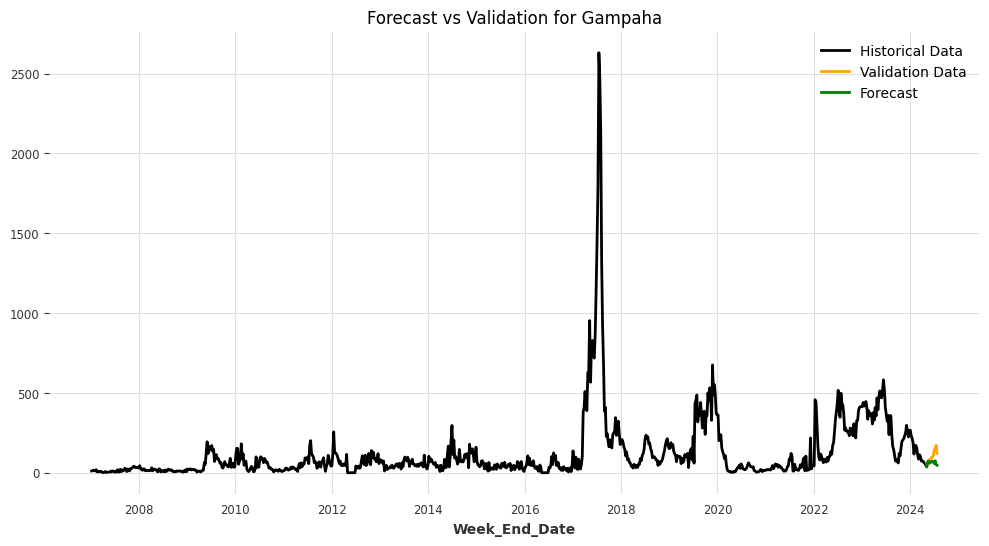

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/9ublqhz2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/x48d4zbx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51666', 'data', 'file=/tmp/tmpu8y_3fe_/9ublqhz2.json', 'init=/tmp/tmpu8y_3fe_/x48d4zbx.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_model1ed_dlaw/prophet_model-20240910155639.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:56:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:56:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_Prophet.pkl


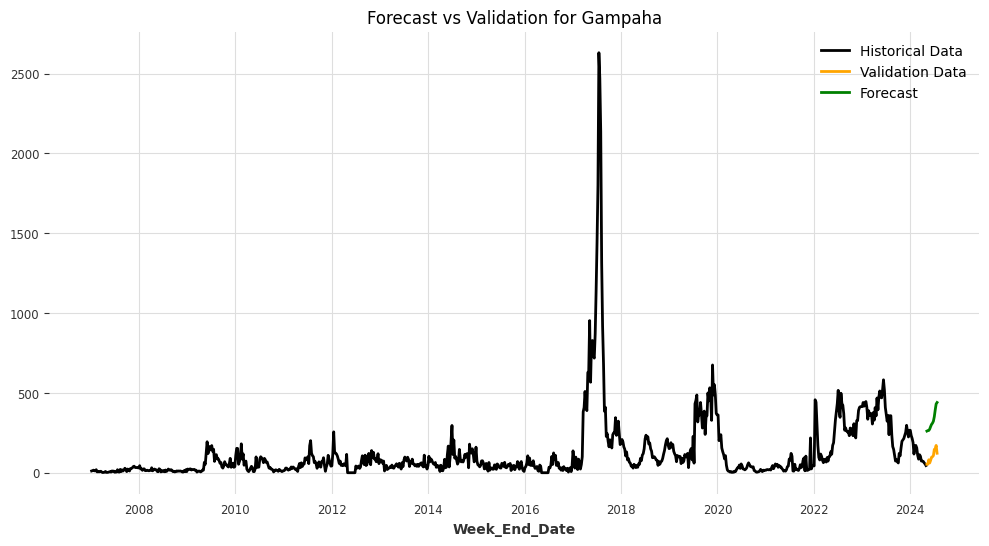

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_FFT.pkl


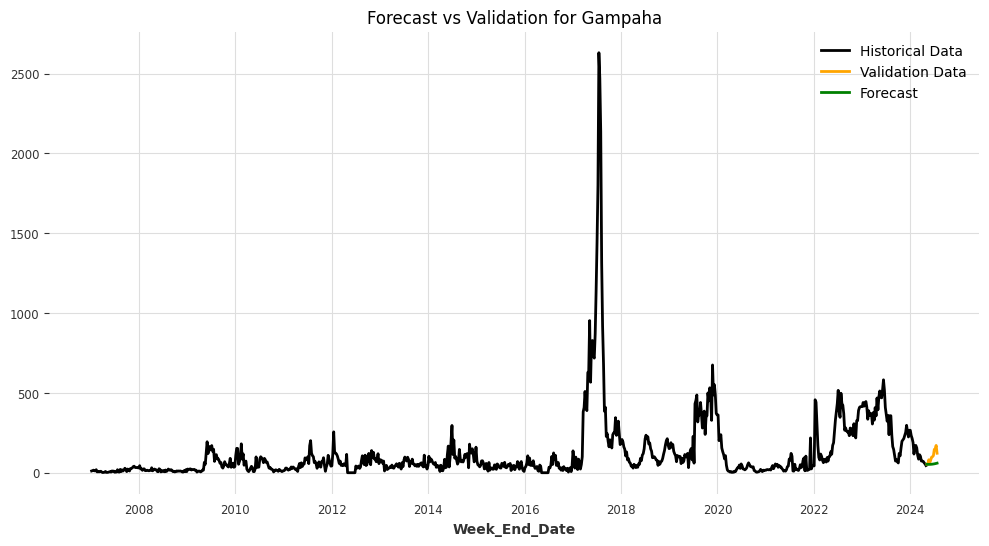

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_KalmanForecaster.pkl


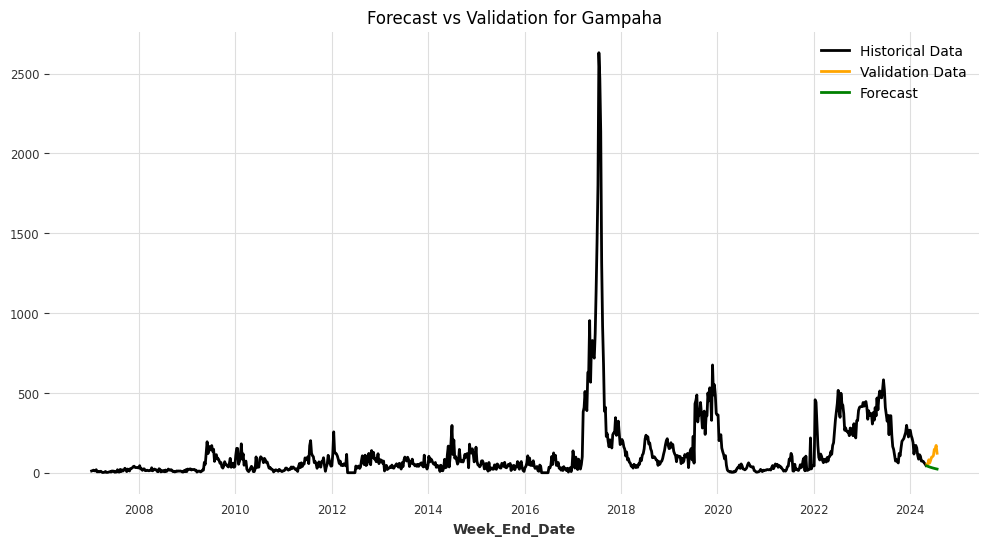

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_ARIMA.pkl


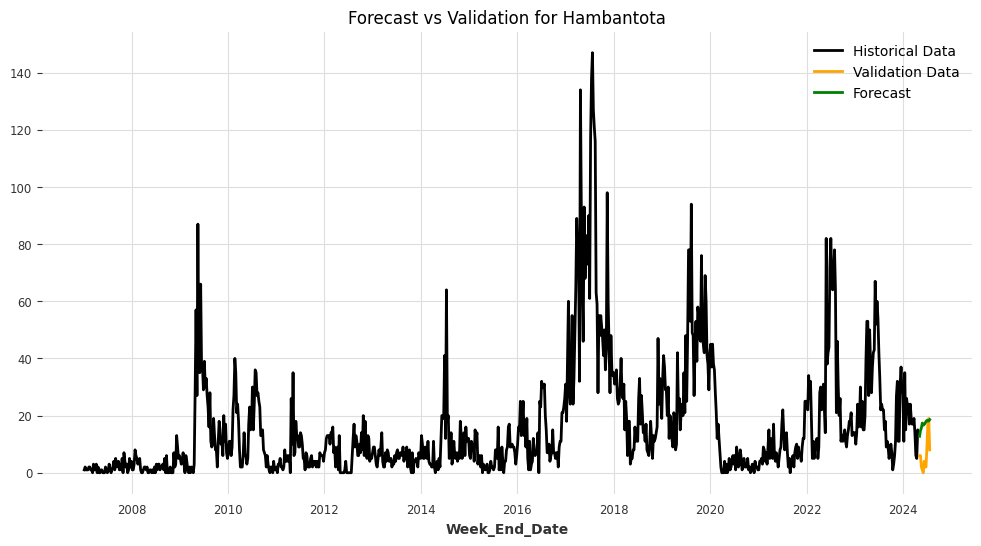

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_AutoARIMA.pkl


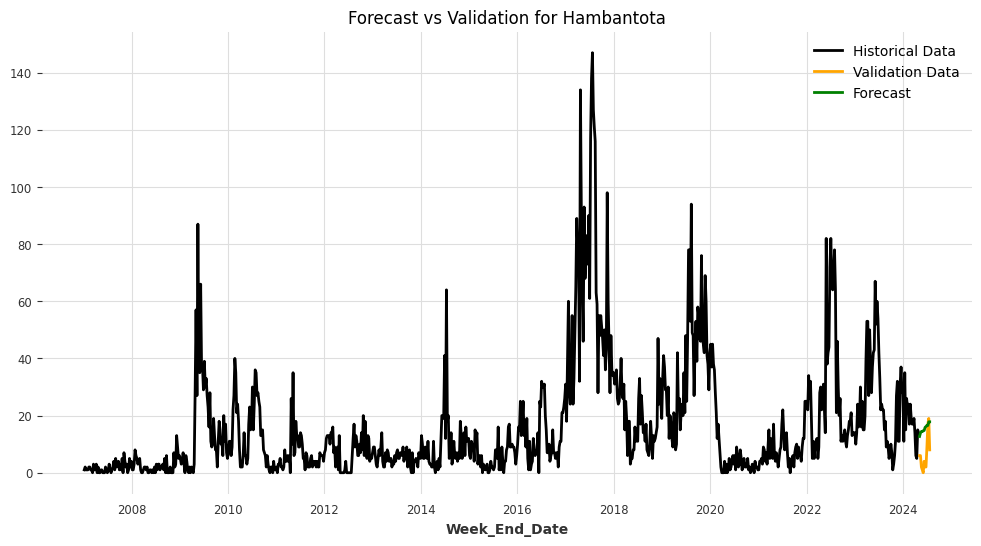

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_ExponentialSmoothing.pkl


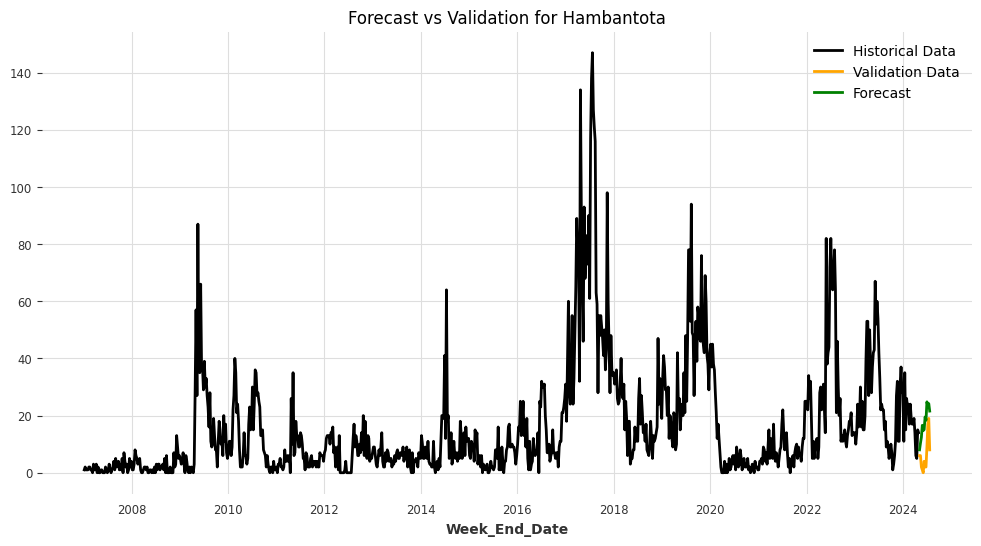

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/rmqq8r47.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/oa1hm_on.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68138', 'data', 'file=/tmp/tmpu8y_3fe_/rmqq8r47.json', 'init=/tmp/tmpu8y_3fe_/oa1hm_on.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modelb7czlw10/prophet_model-20240910155757.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:57:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:57:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_Prophet.pkl


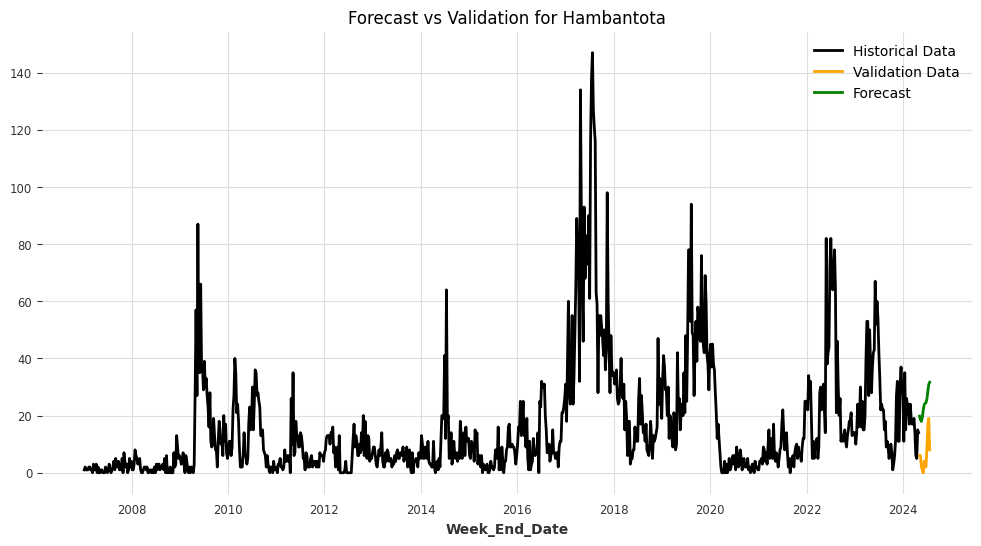

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_FFT.pkl


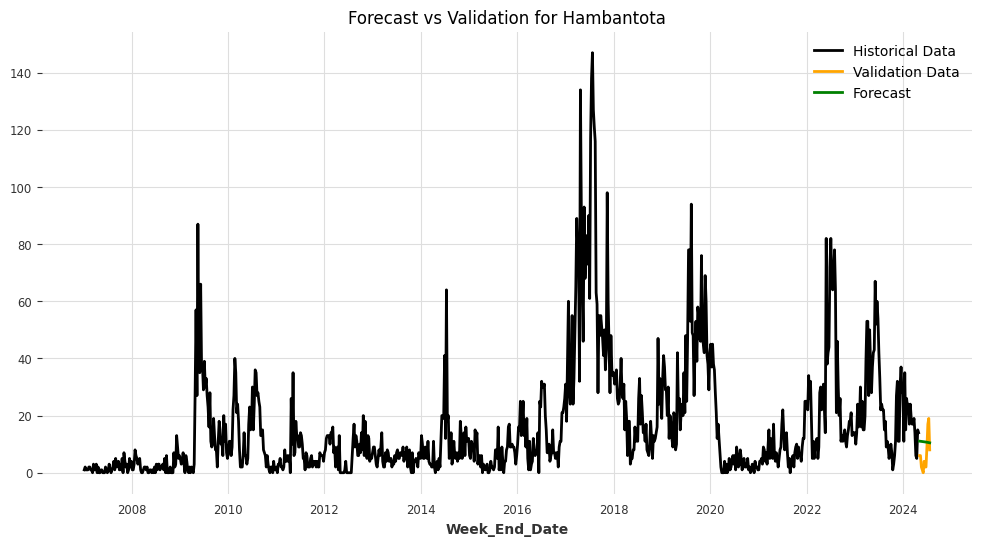

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_KalmanForecaster.pkl


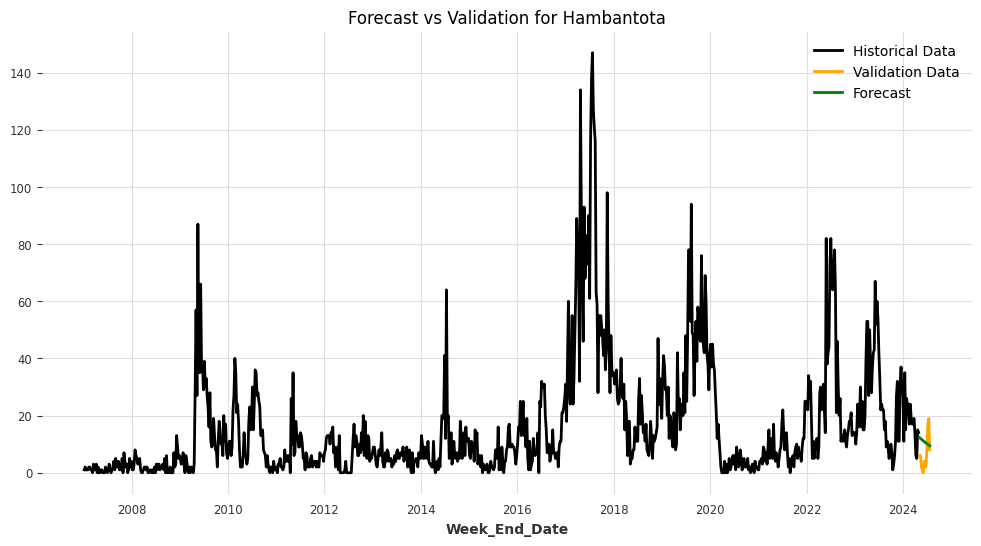

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_ARIMA.pkl


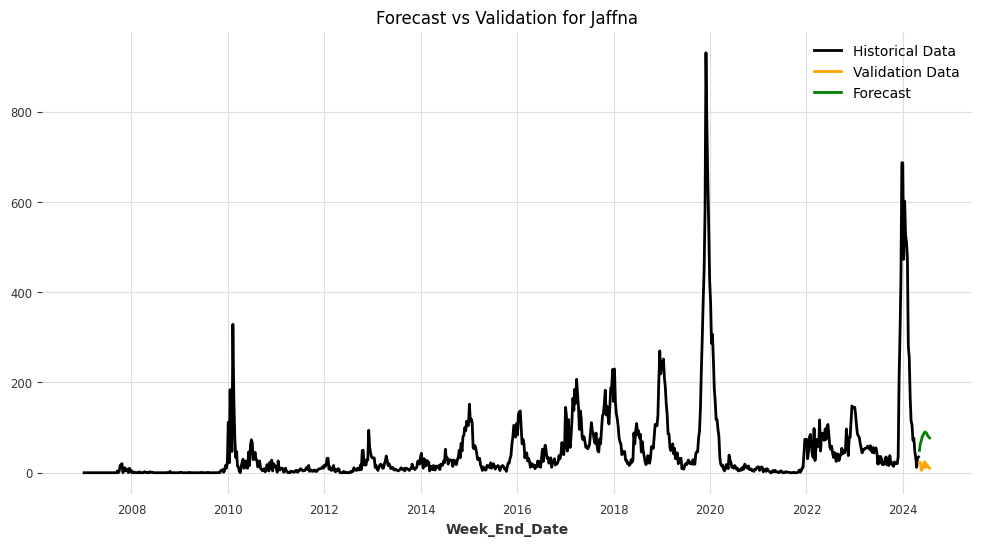

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_AutoARIMA.pkl


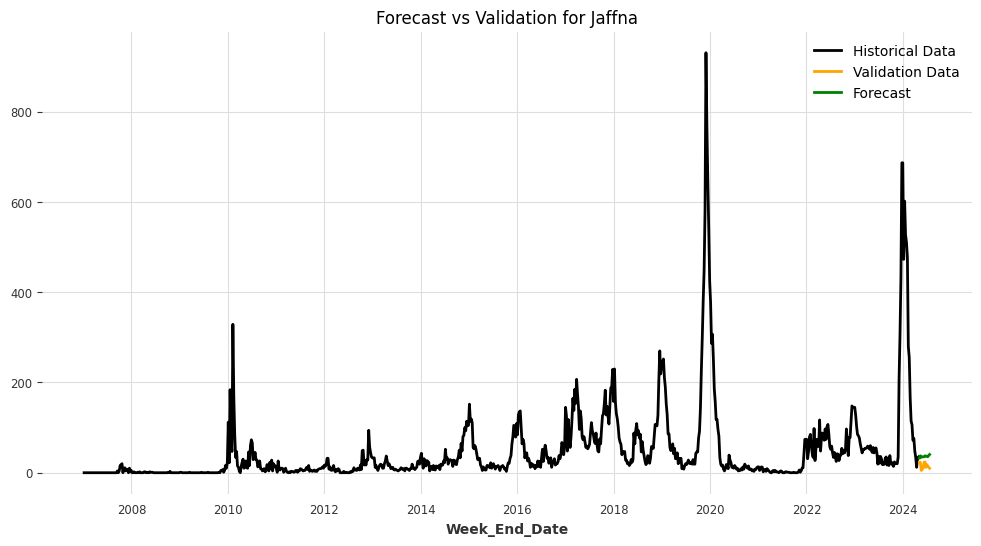

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_ExponentialSmoothing.pkl


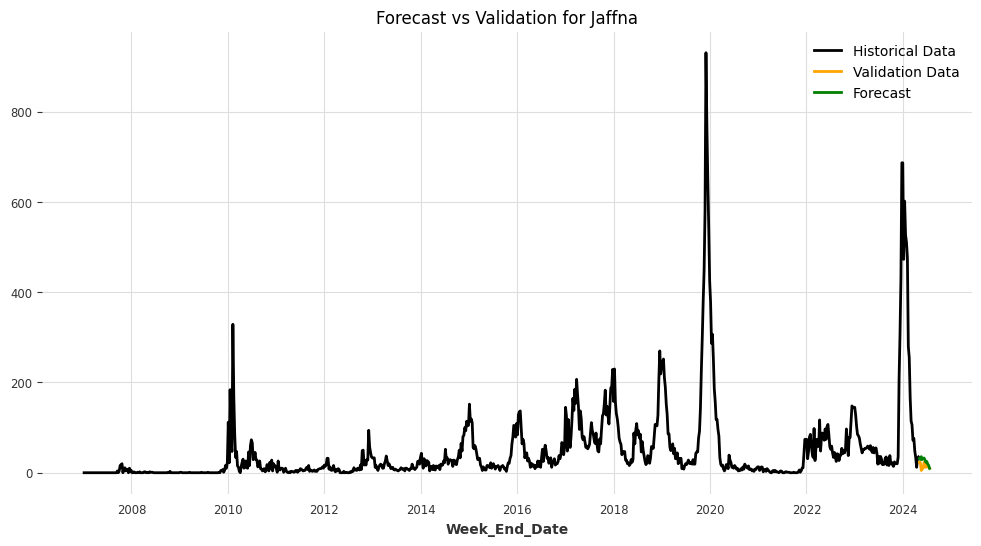

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/79lx47e8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/tmsmwyx3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74638', 'data', 'file=/tmp/tmpu8y_3fe_/79lx47e8.json', 'init=/tmp/tmpu8y_3fe_/tmsmwyx3.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_model79jp0ofi/prophet_model-20240910160016.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:00:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:00:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_Prophet.pkl


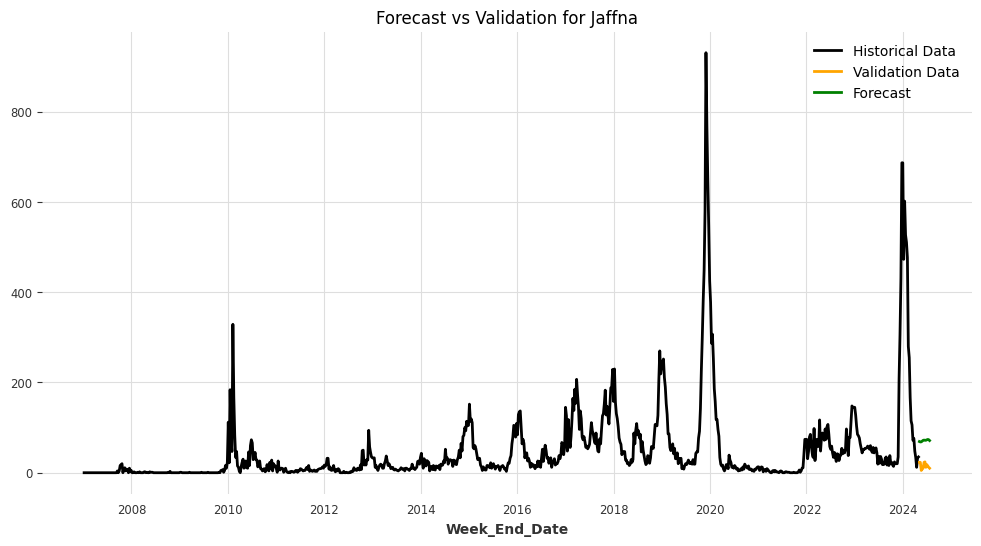

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_FFT.pkl


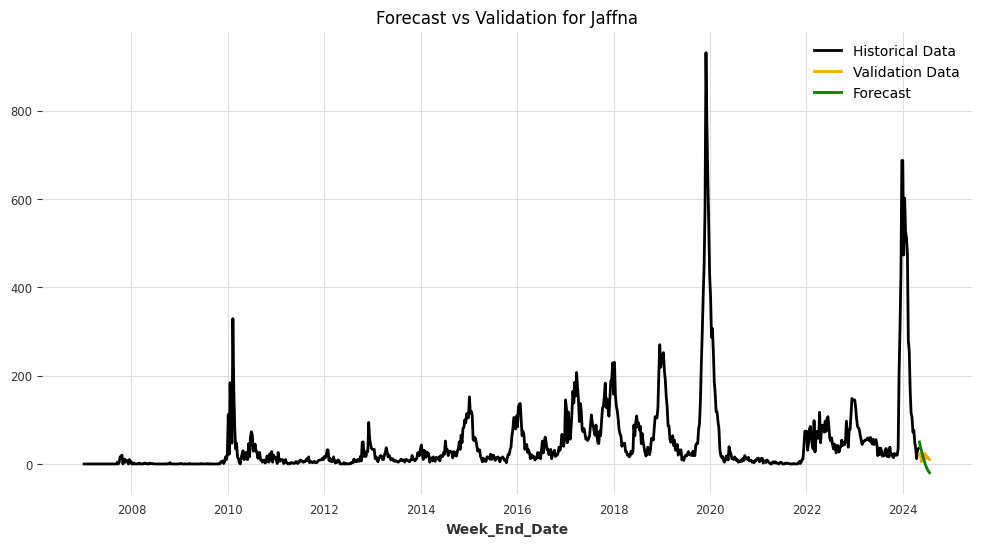

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_KalmanForecaster.pkl


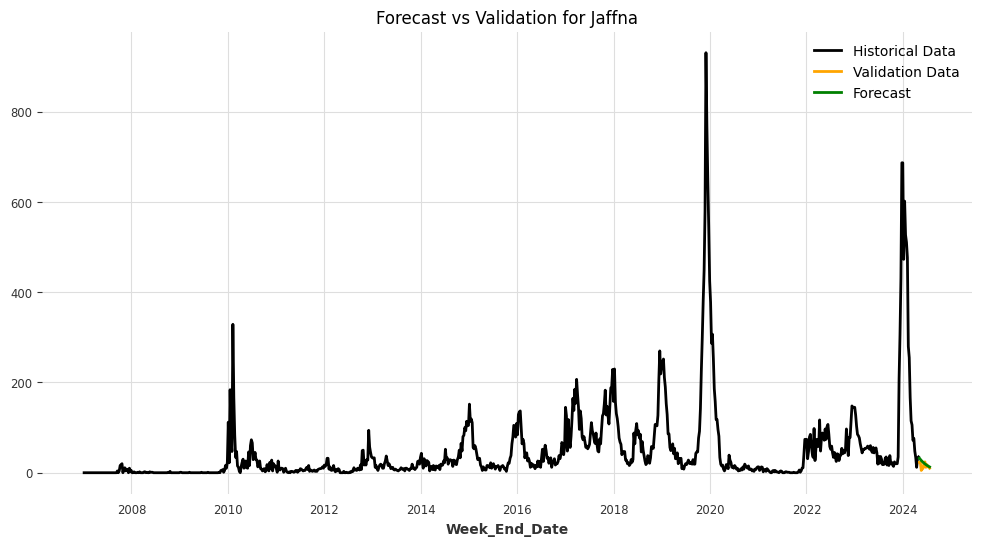

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_ARIMA.pkl


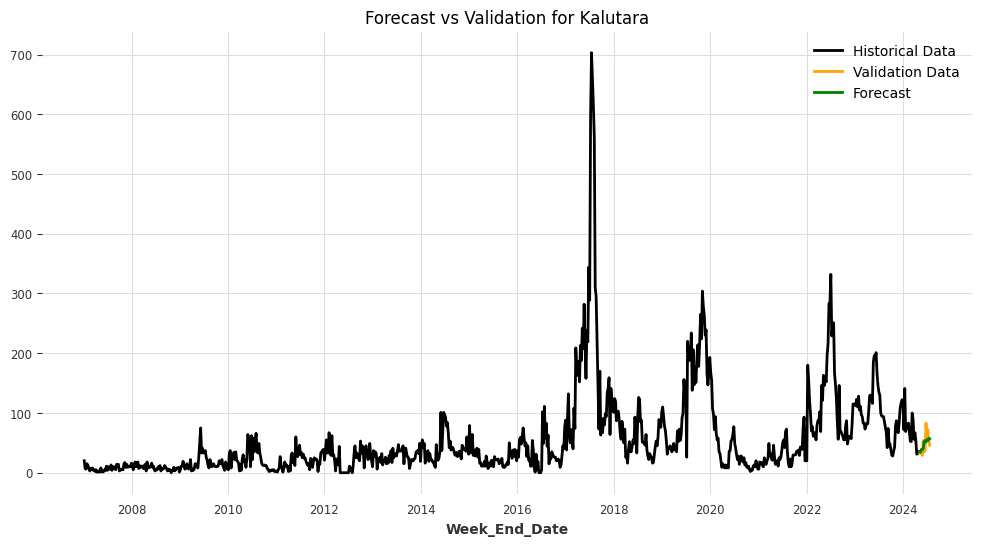

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_AutoARIMA.pkl


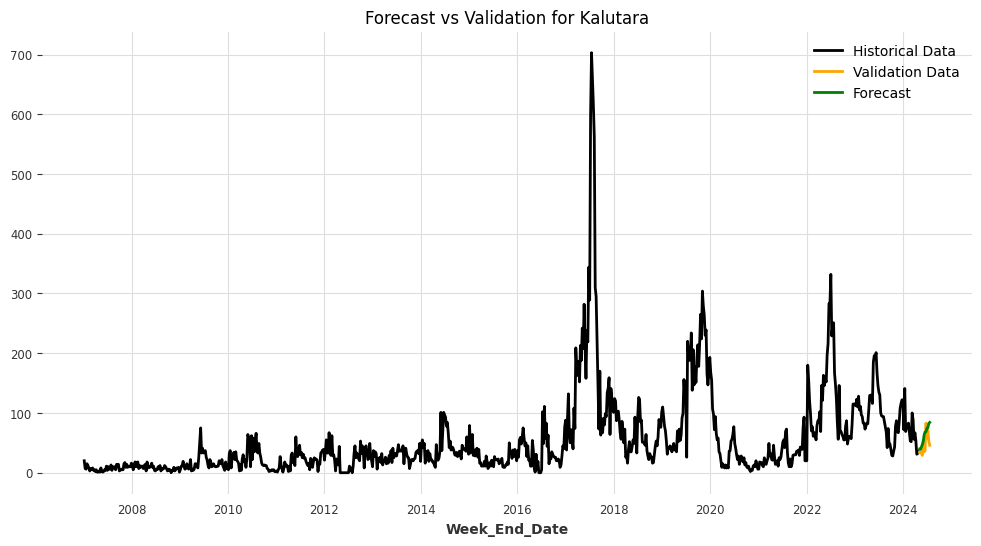

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_ExponentialSmoothing.pkl


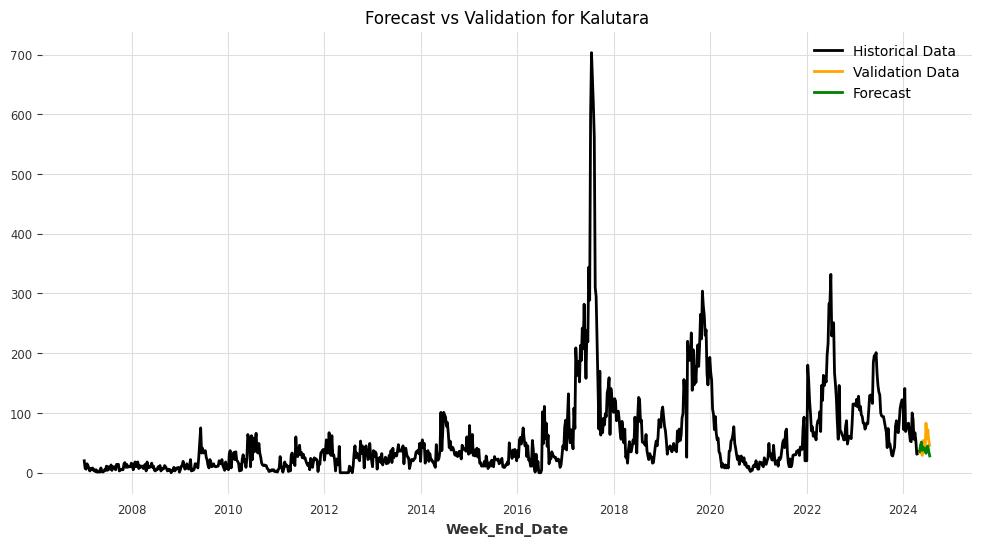

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/dxyut193.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/e9eltwx3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2666', 'data', 'file=/tmp/tmpu8y_3fe_/dxyut193.json', 'init=/tmp/tmpu8y_3fe_/e9eltwx3.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modelu1vogn77/prophet_model-20240910160315.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:03:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:03:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_Prophet.pkl


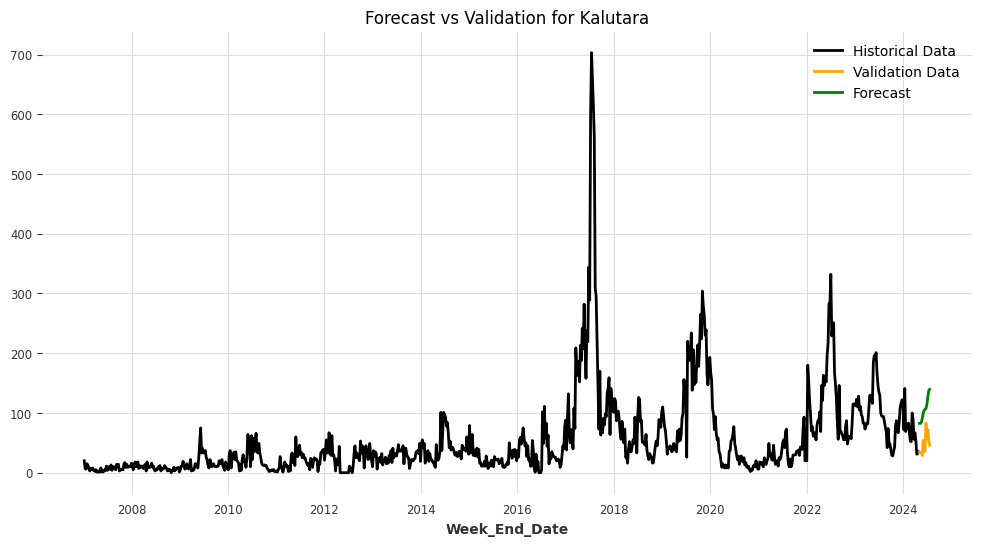

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_FFT.pkl


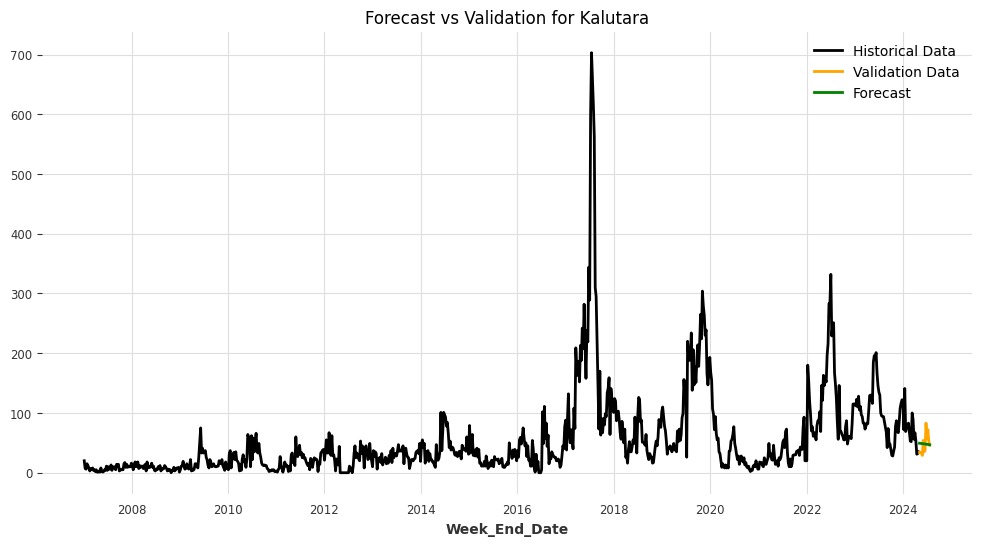

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_KalmanForecaster.pkl


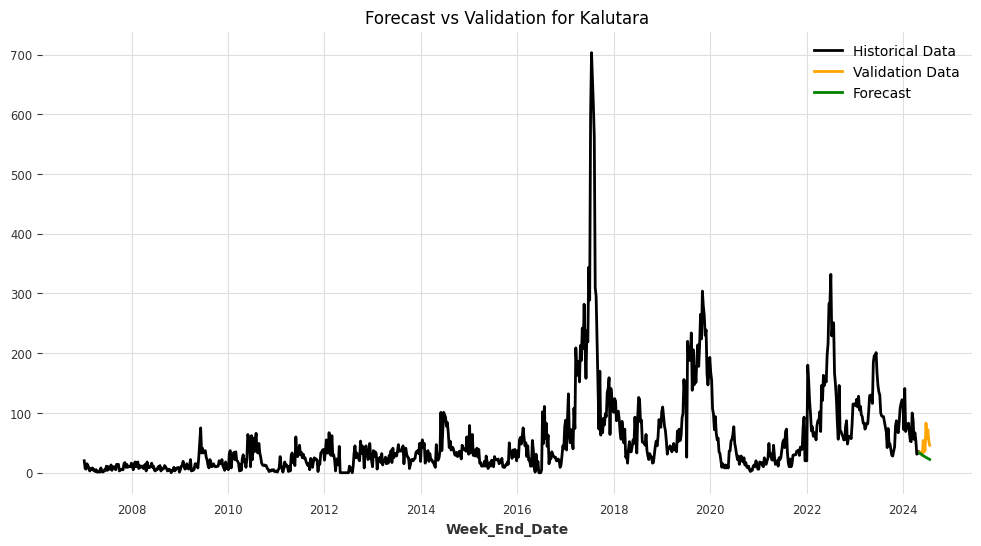

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_ARIMA.pkl


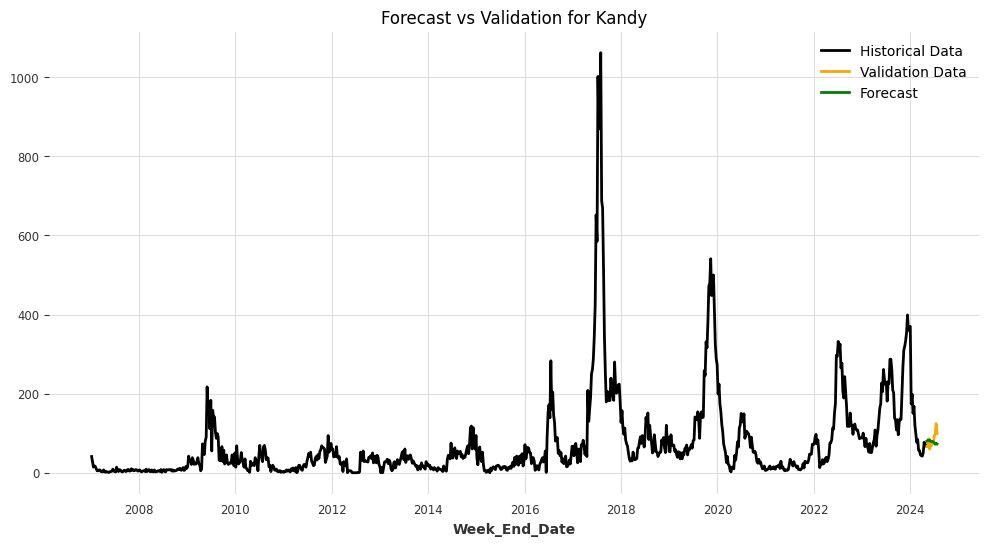

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_AutoARIMA.pkl


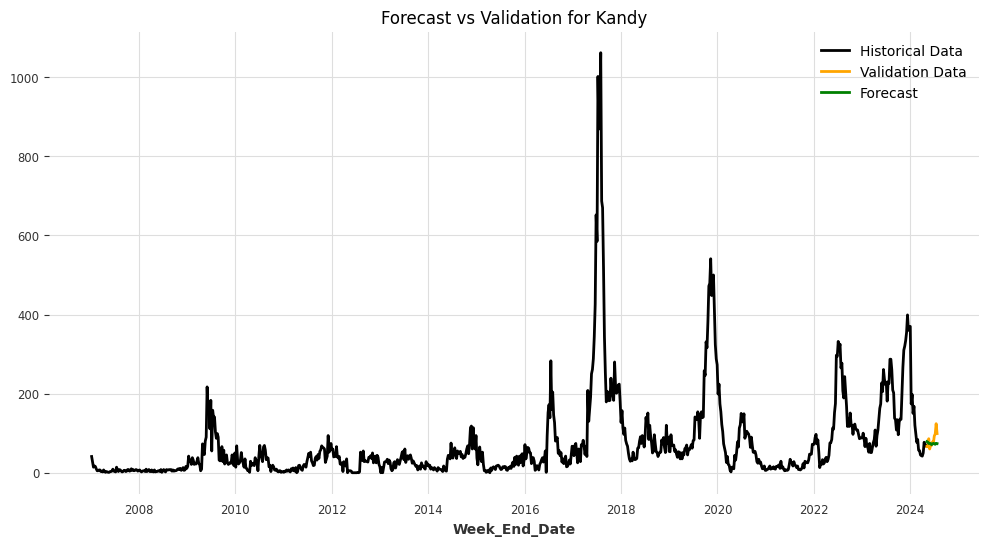

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_ExponentialSmoothing.pkl


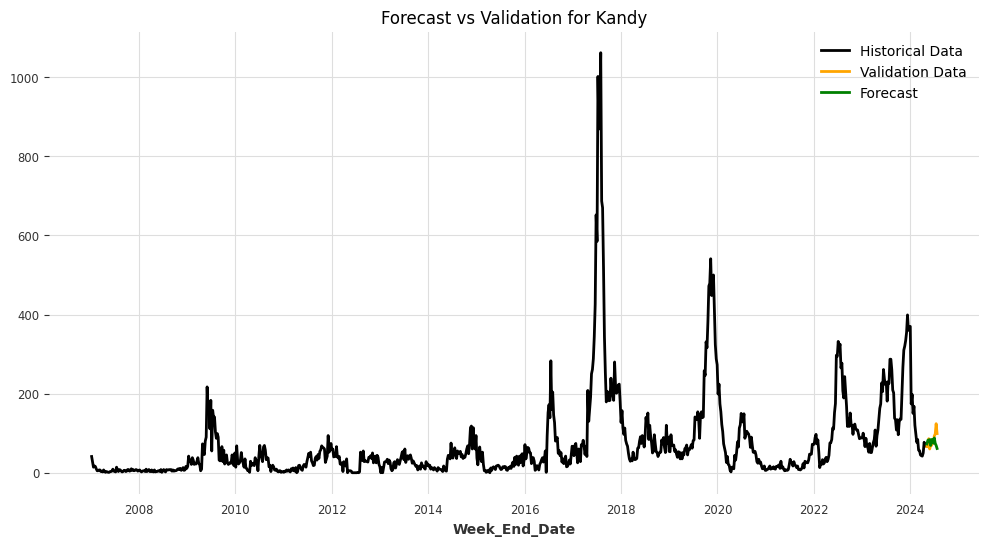

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/luoc9uwi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/9kj8uat_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88011', 'data', 'file=/tmp/tmpu8y_3fe_/luoc9uwi.json', 'init=/tmp/tmpu8y_3fe_/9kj8uat_.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_model7x9eqq_1/prophet_model-20240910160522.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:05:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:05:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_Prophet.pkl


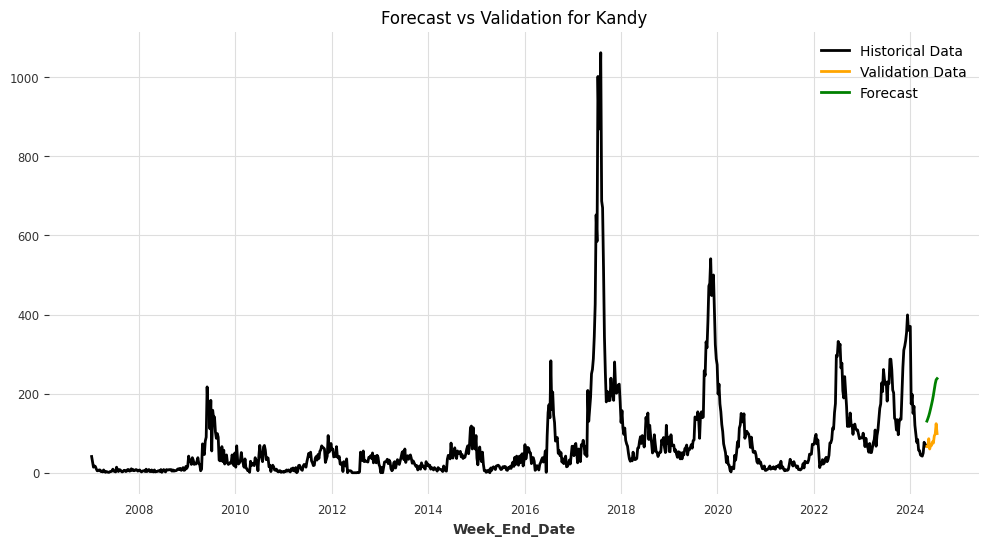

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_FFT.pkl


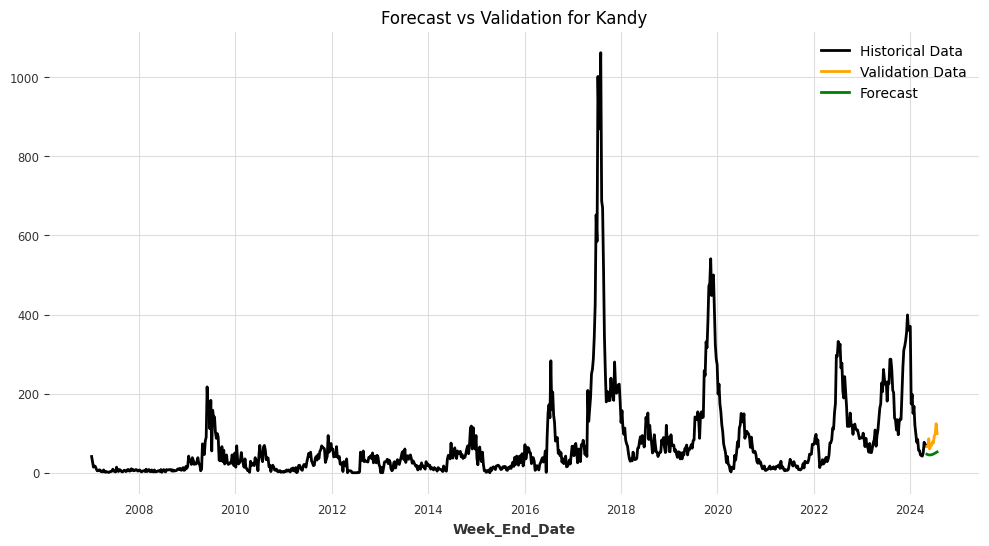

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_KalmanForecaster.pkl


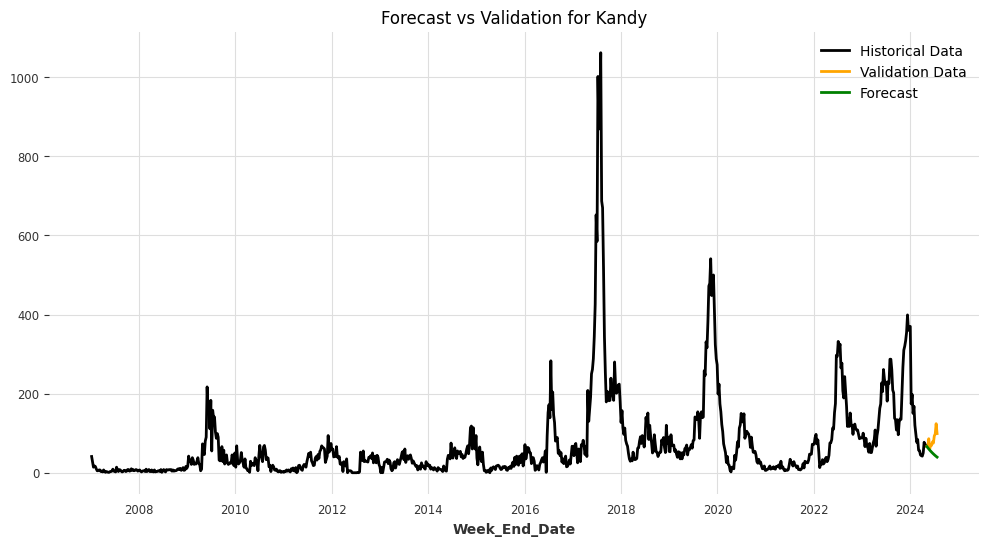

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_ARIMA.pkl


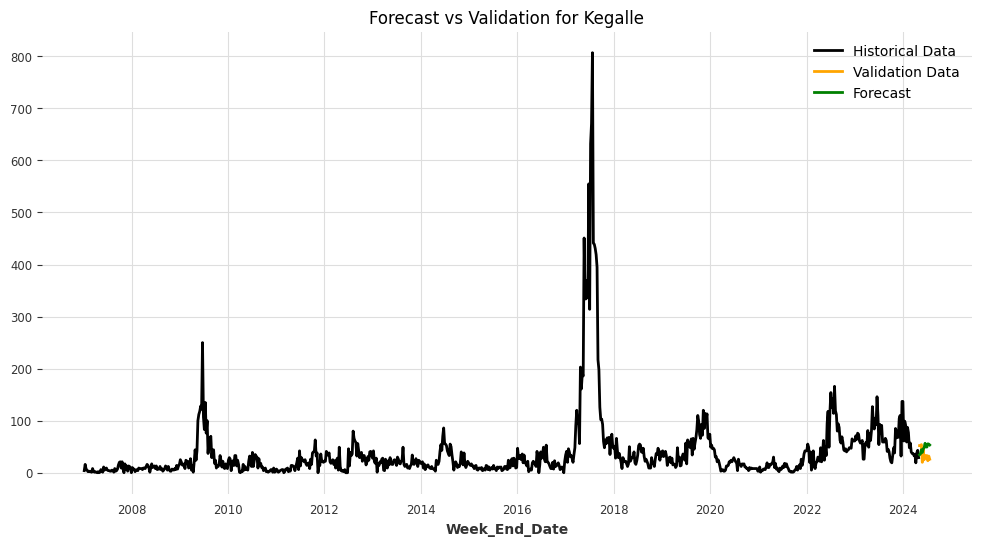

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_AutoARIMA.pkl


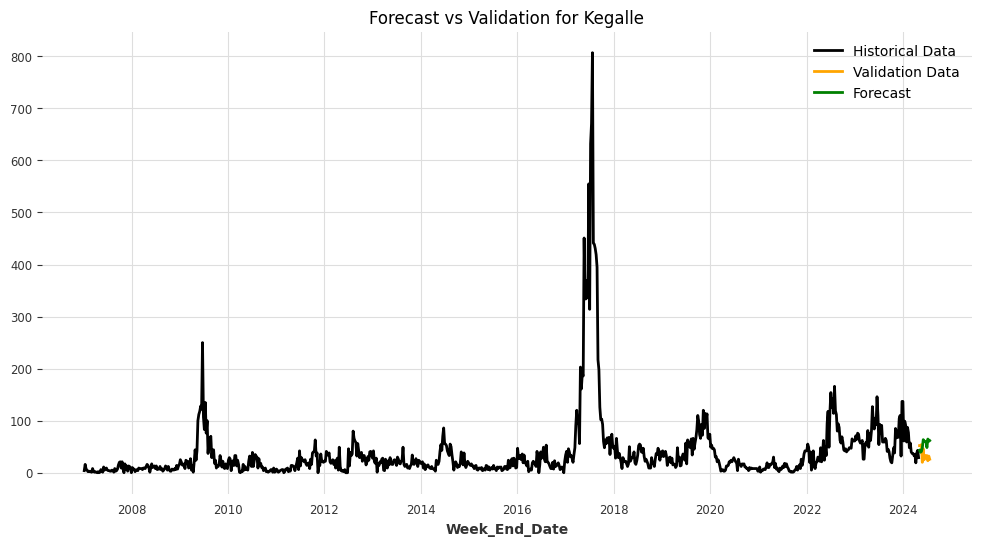

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_ExponentialSmoothing.pkl


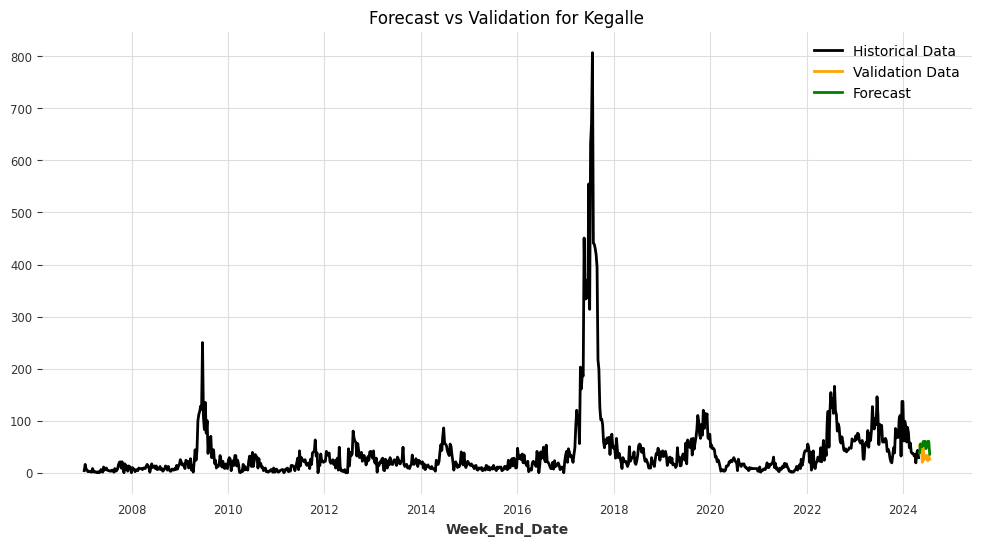

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/h8m_14wv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/m385r0o2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5119', 'data', 'file=/tmp/tmpu8y_3fe_/h8m_14wv.json', 'init=/tmp/tmpu8y_3fe_/m385r0o2.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modeluslu8g69/prophet_model-20240910160700.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:07:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:07:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_Prophet.pkl


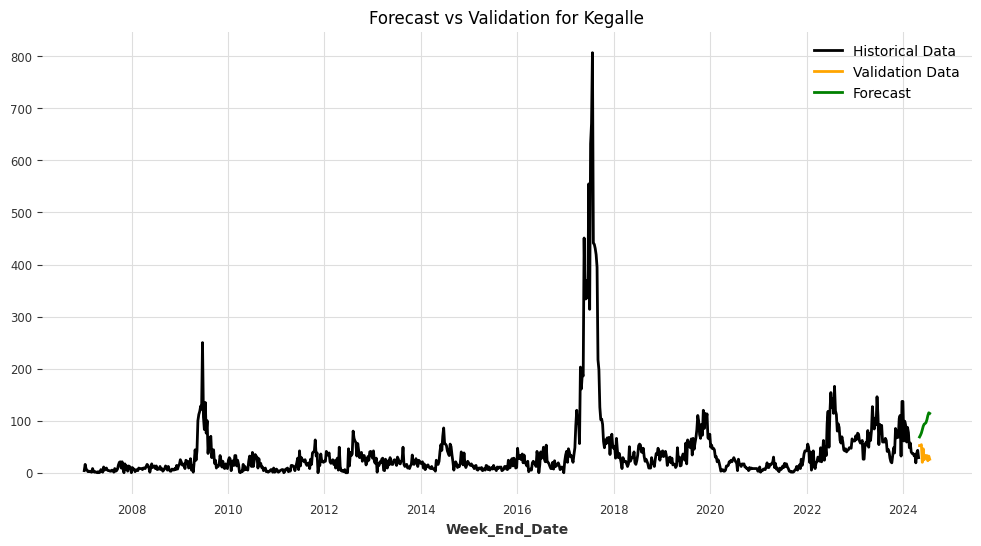

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_FFT.pkl


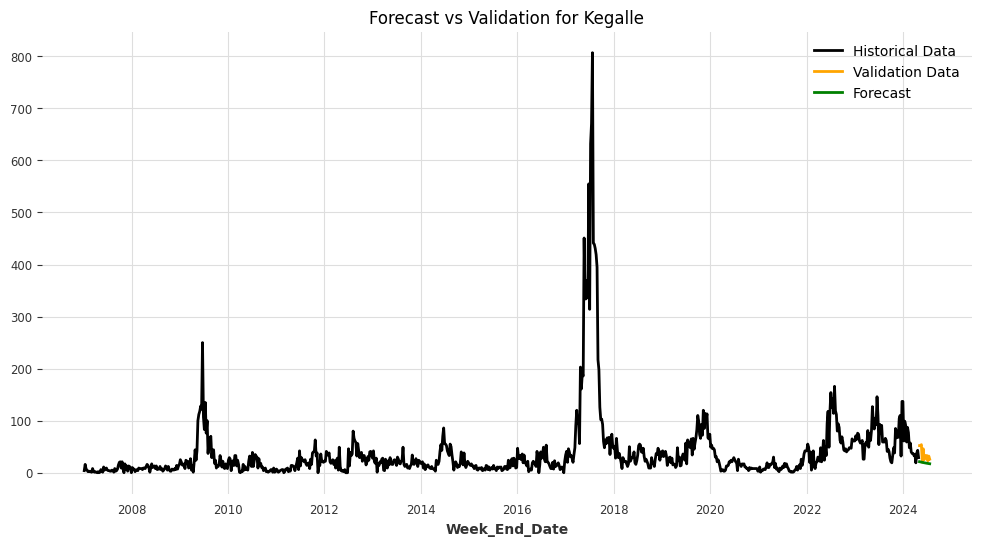

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_KalmanForecaster.pkl


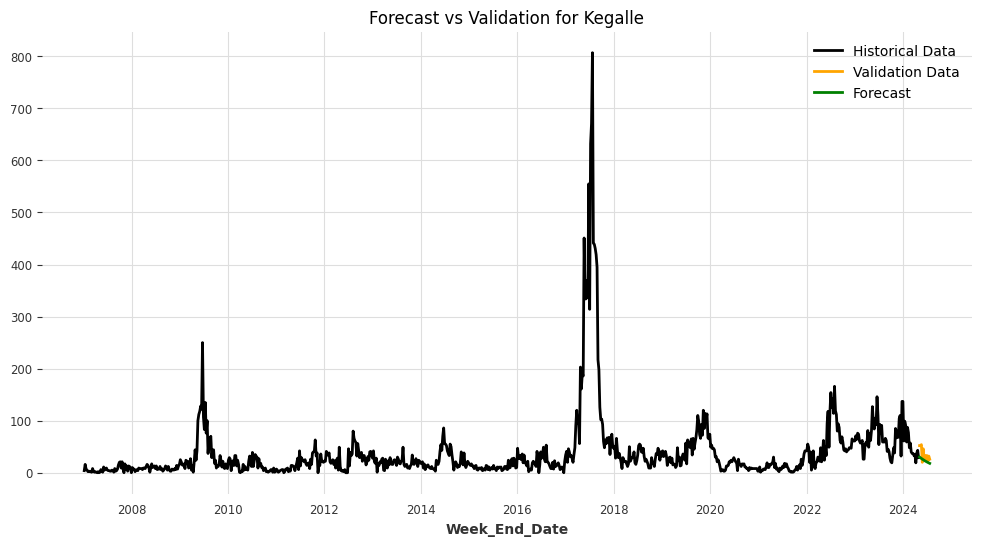

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_ARIMA.pkl


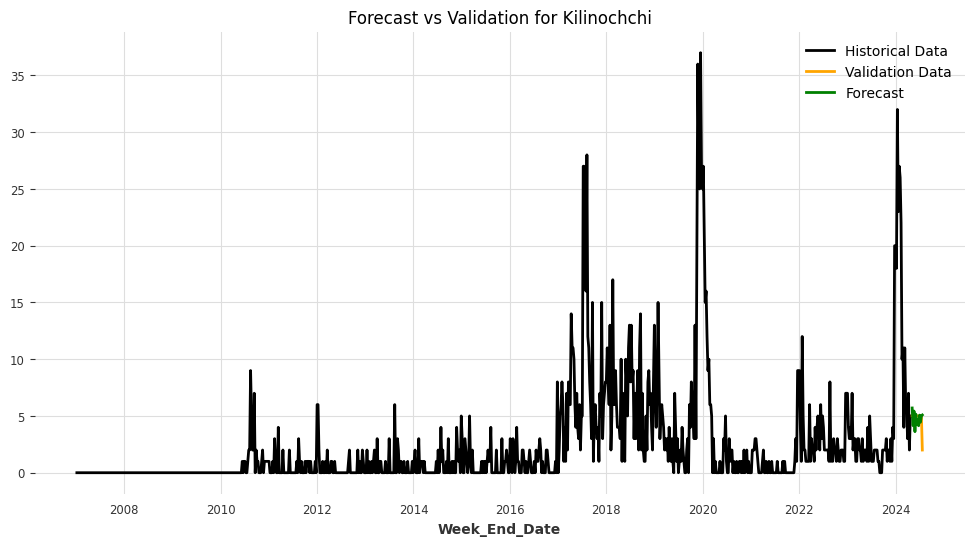

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_AutoARIMA.pkl


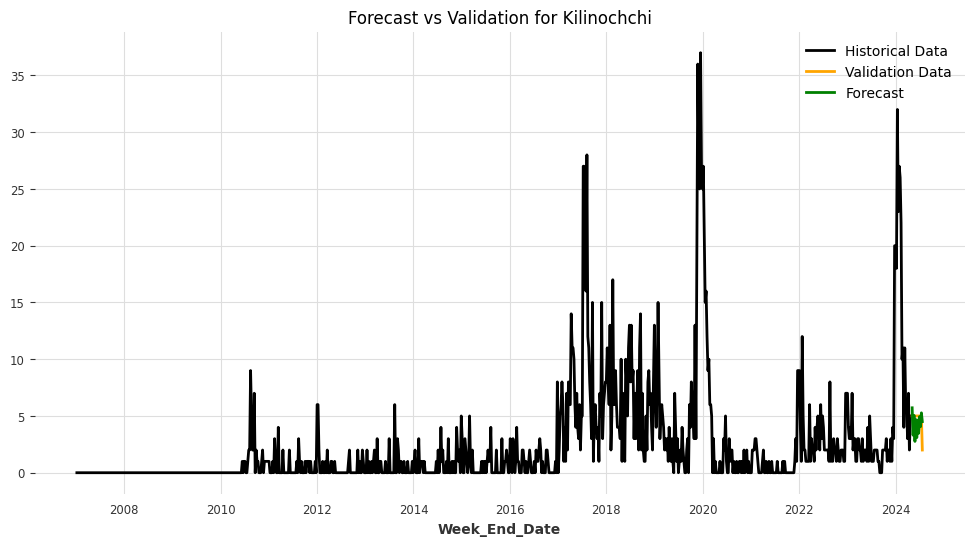

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_ExponentialSmoothing.pkl


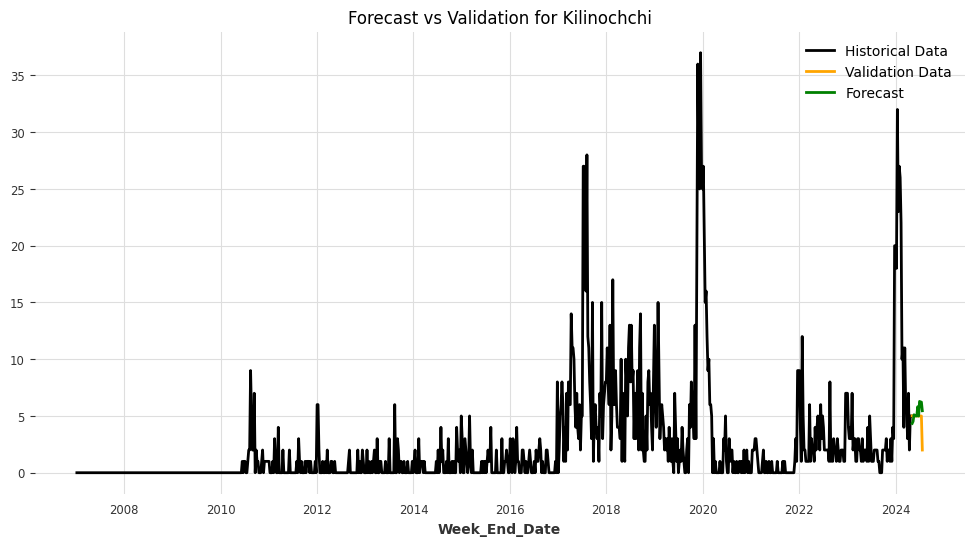

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/b_up74_2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/1xjrvf6g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31315', 'data', 'file=/tmp/tmpu8y_3fe_/b_up74_2.json', 'init=/tmp/tmpu8y_3fe_/1xjrvf6g.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_model5qlcgsdk/prophet_model-20240910160956.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:09:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:09:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_Prophet.pkl


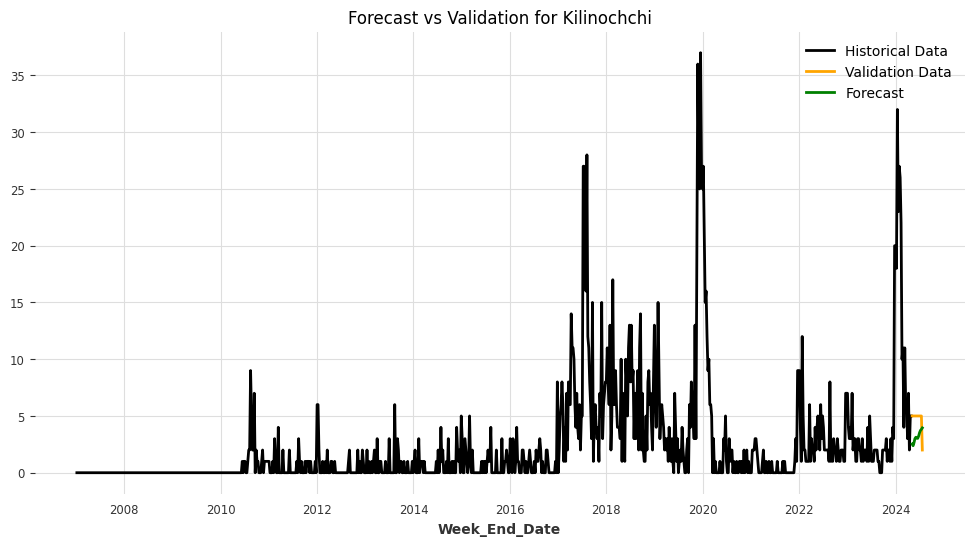

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_FFT.pkl


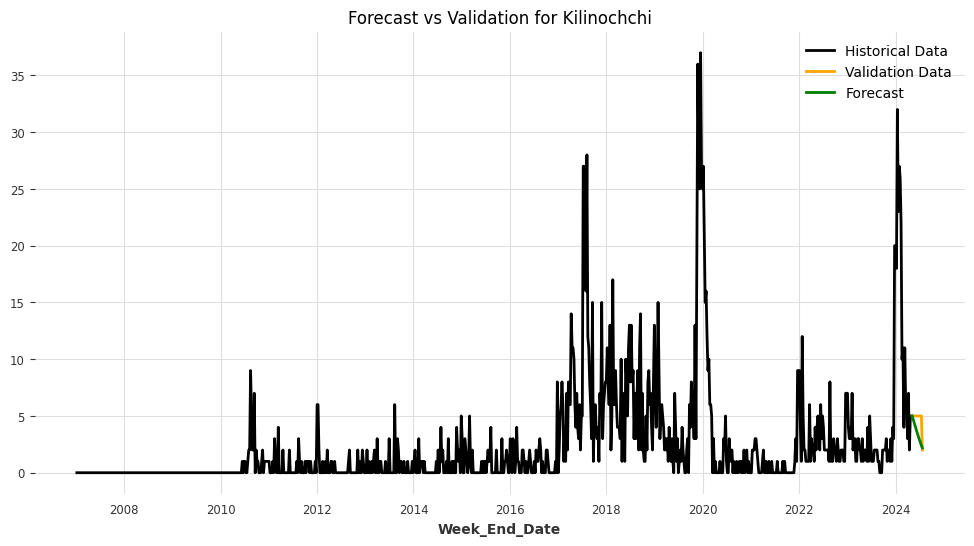

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_KalmanForecaster.pkl


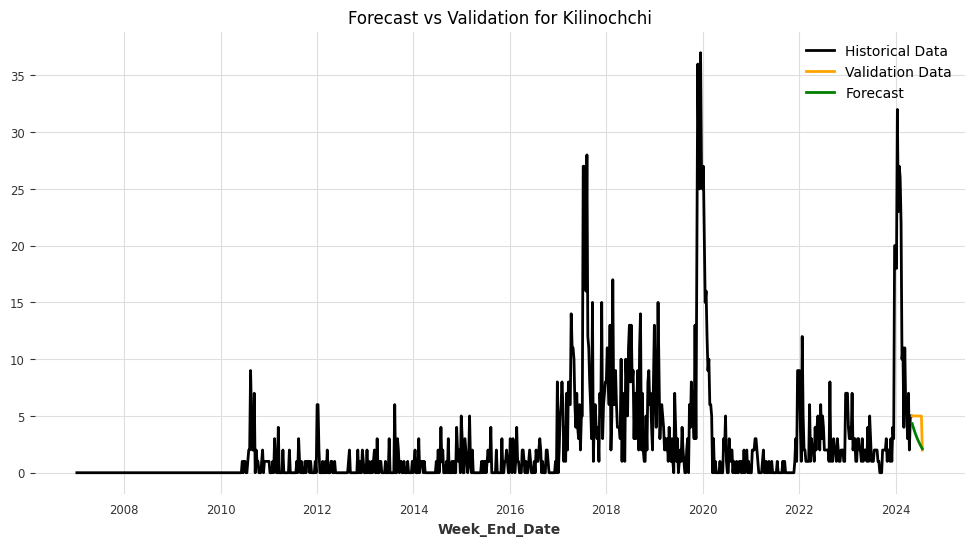

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_ARIMA.pkl


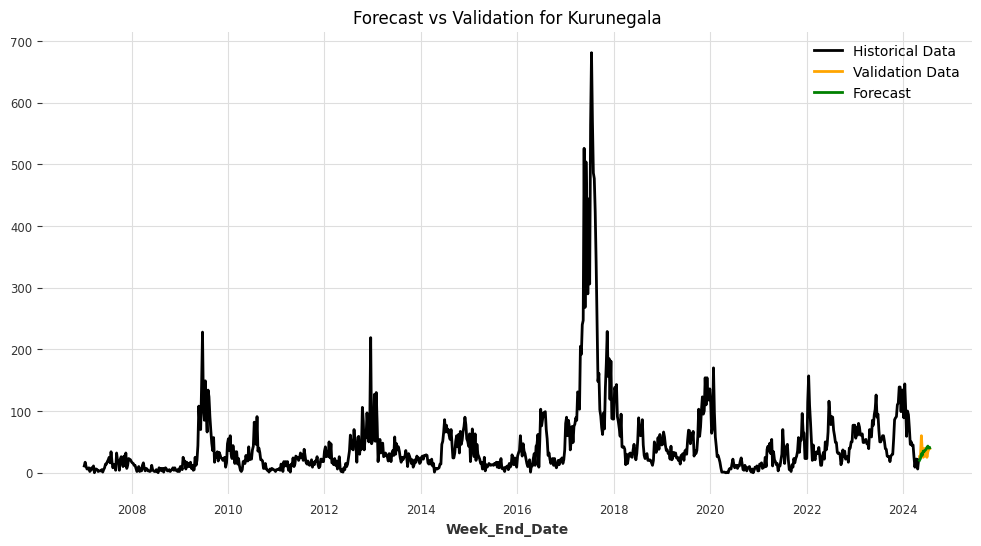

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_AutoARIMA.pkl


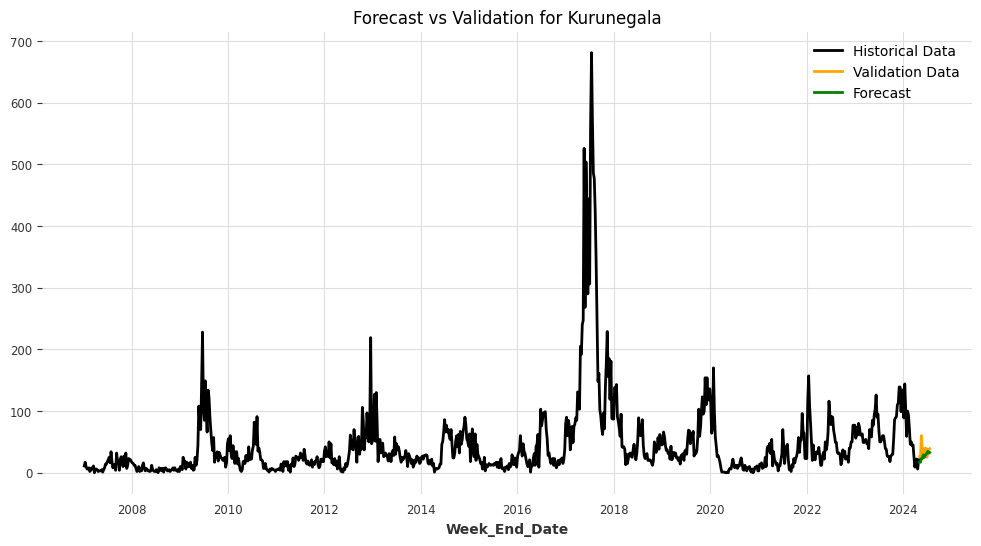

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_ExponentialSmoothing.pkl


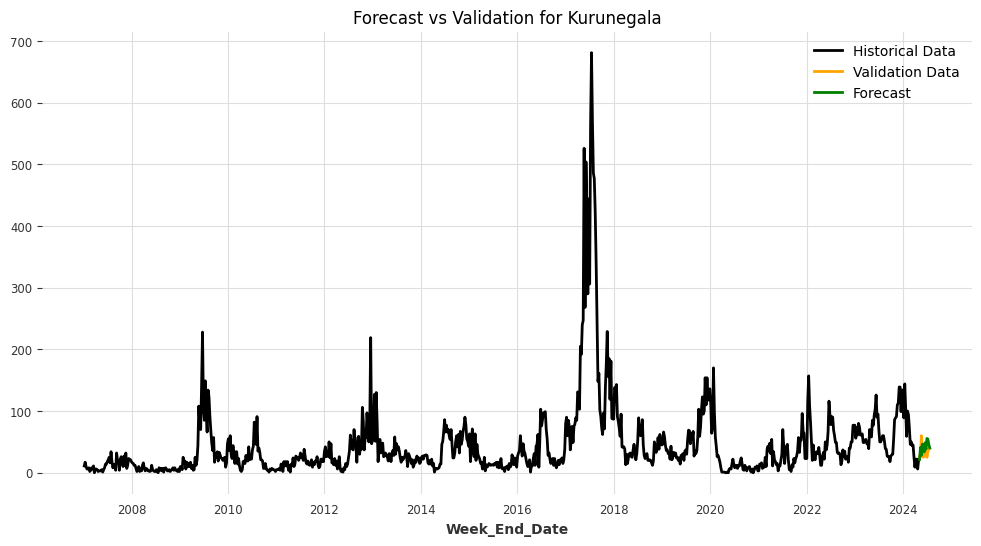

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/mq8_s3e9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/yi028o4a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13505', 'data', 'file=/tmp/tmpu8y_3fe_/mq8_s3e9.json', 'init=/tmp/tmpu8y_3fe_/yi028o4a.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_model1x5umxjj/prophet_model-20240910161229.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:12:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:12:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_Prophet.pkl


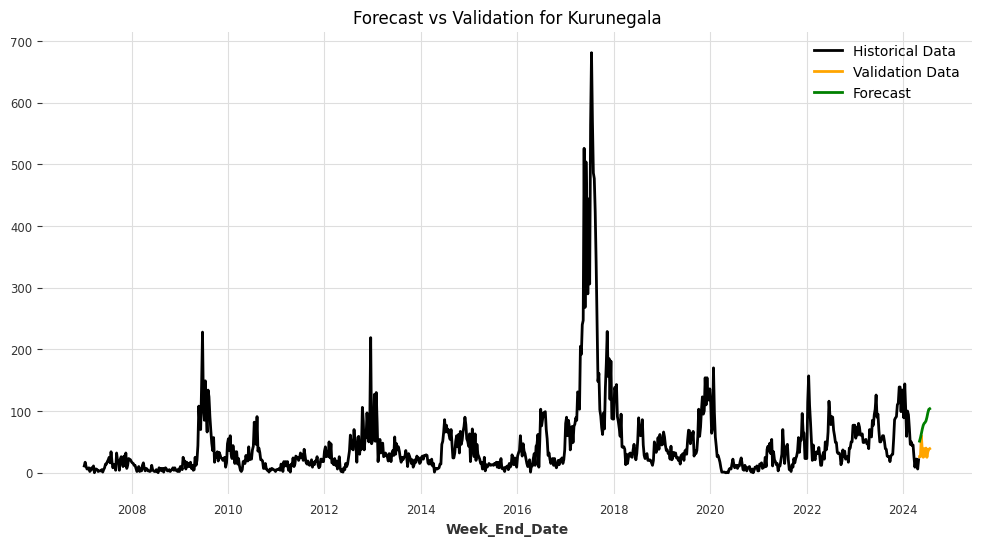

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_FFT.pkl


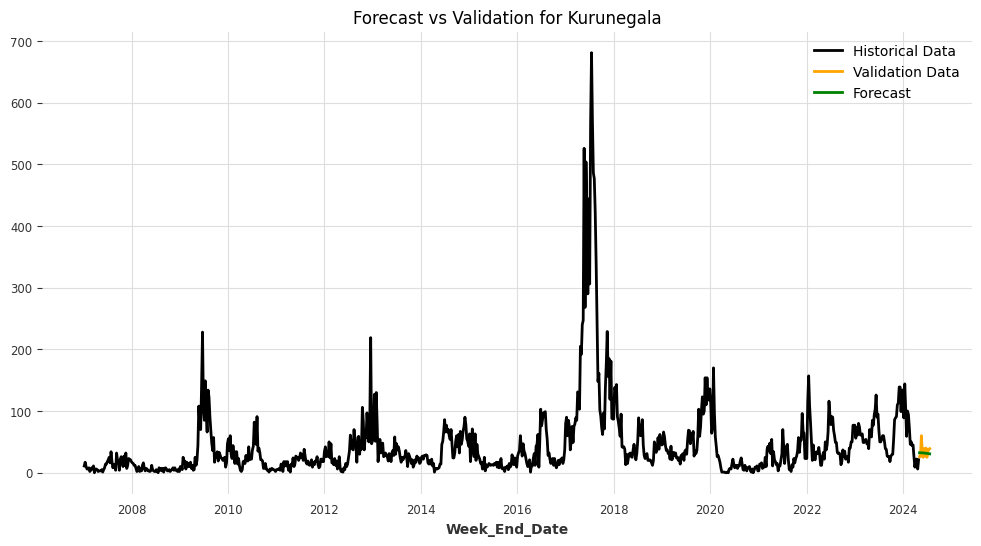

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_KalmanForecaster.pkl


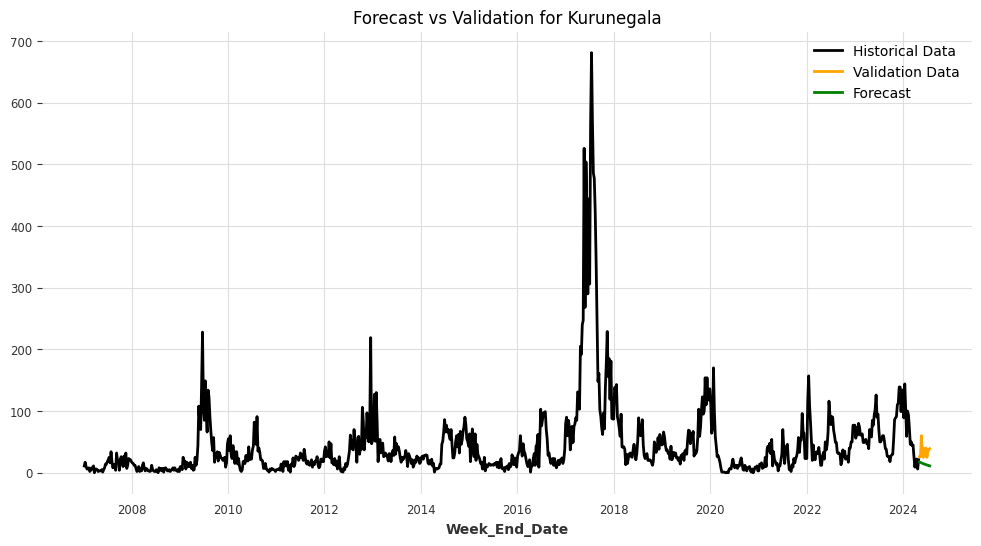

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_ARIMA.pkl


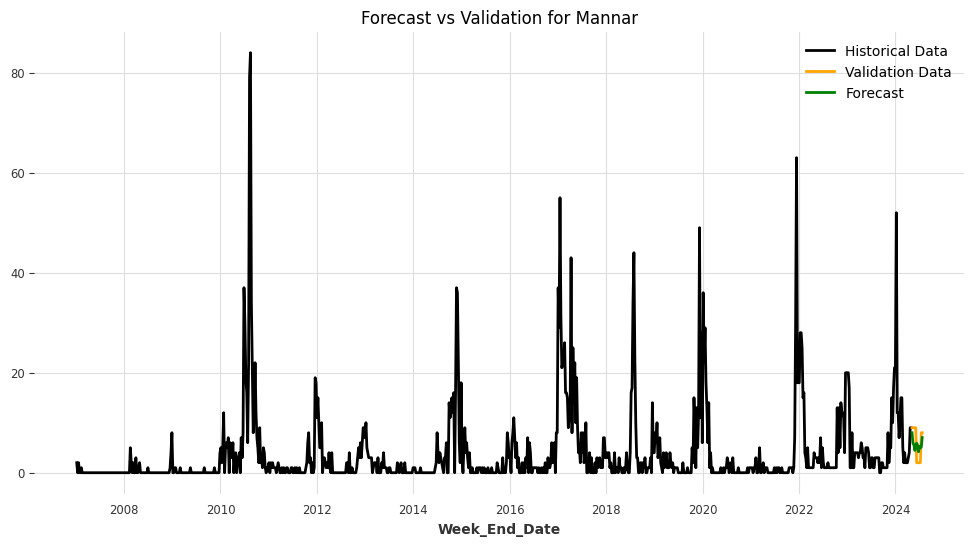

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_AutoARIMA.pkl


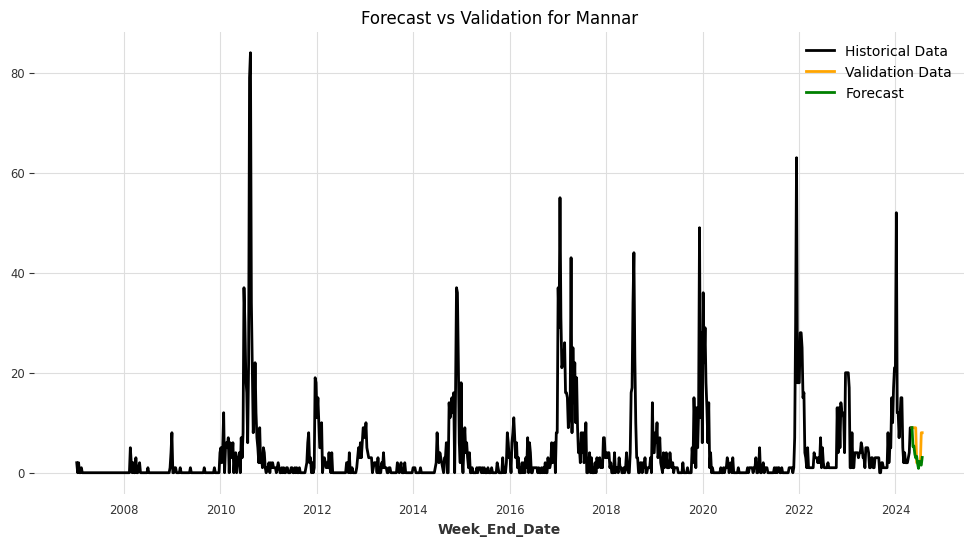

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_ExponentialSmoothing.pkl


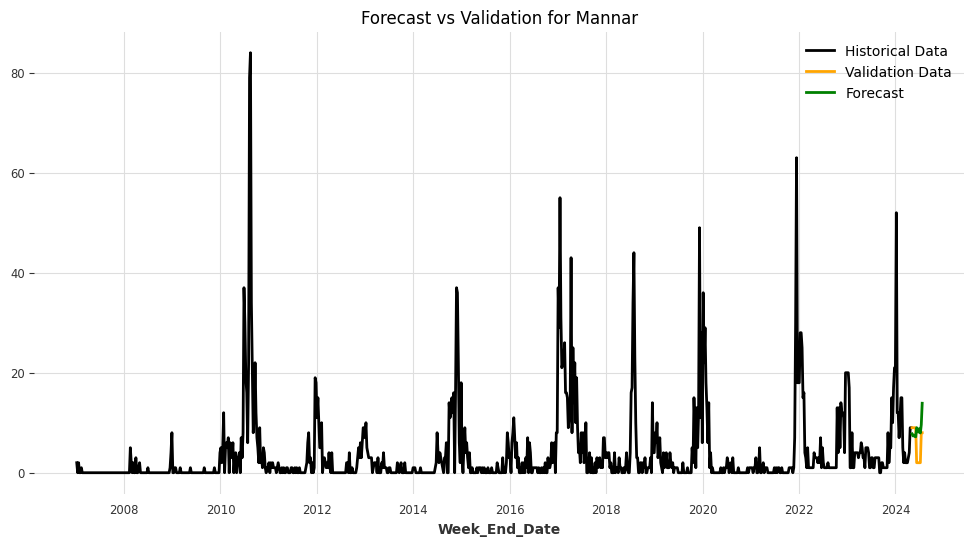

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/k441t4pk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/jqrcv0pw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75659', 'data', 'file=/tmp/tmpu8y_3fe_/k441t4pk.json', 'init=/tmp/tmpu8y_3fe_/jqrcv0pw.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_model__wykiek/prophet_model-20240910161402.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:14:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:14:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_Prophet.pkl


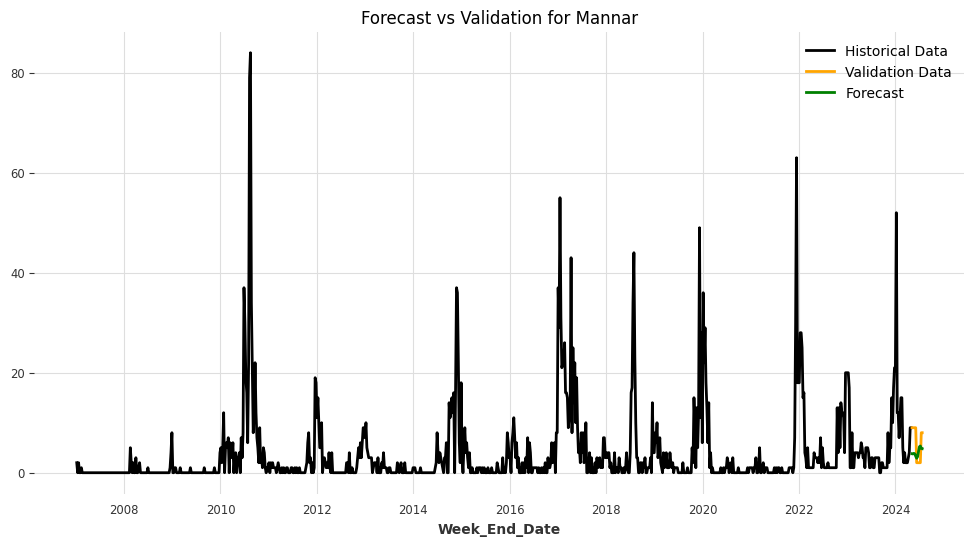

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_FFT.pkl


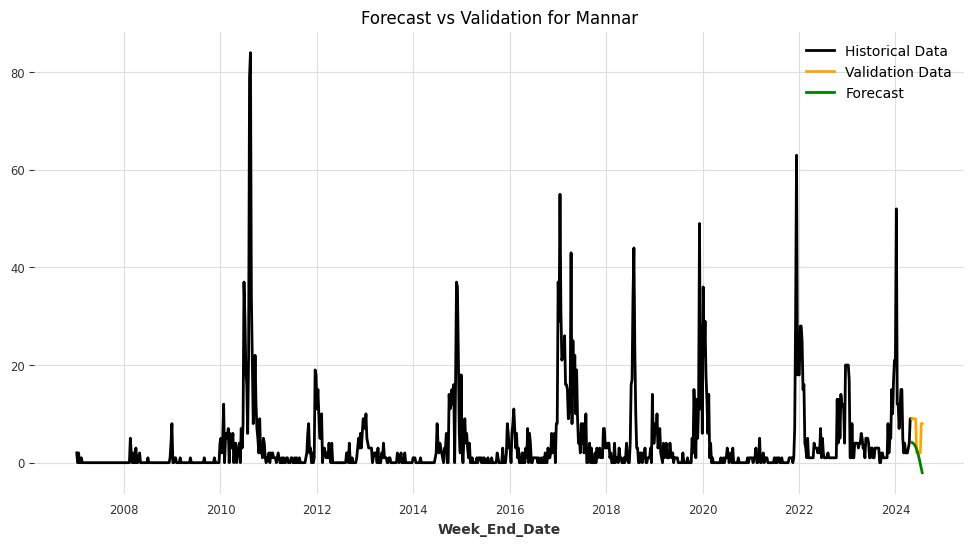

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_KalmanForecaster.pkl


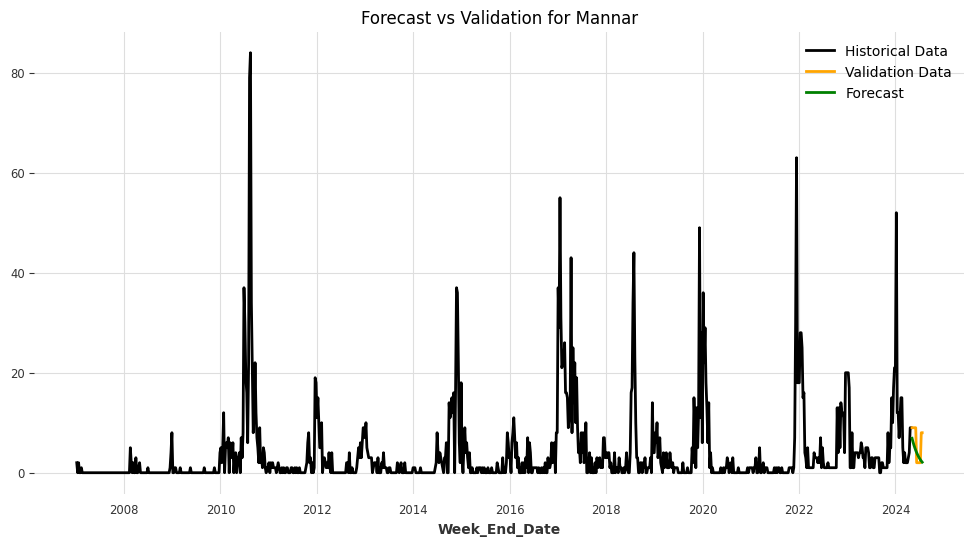

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_ARIMA.pkl


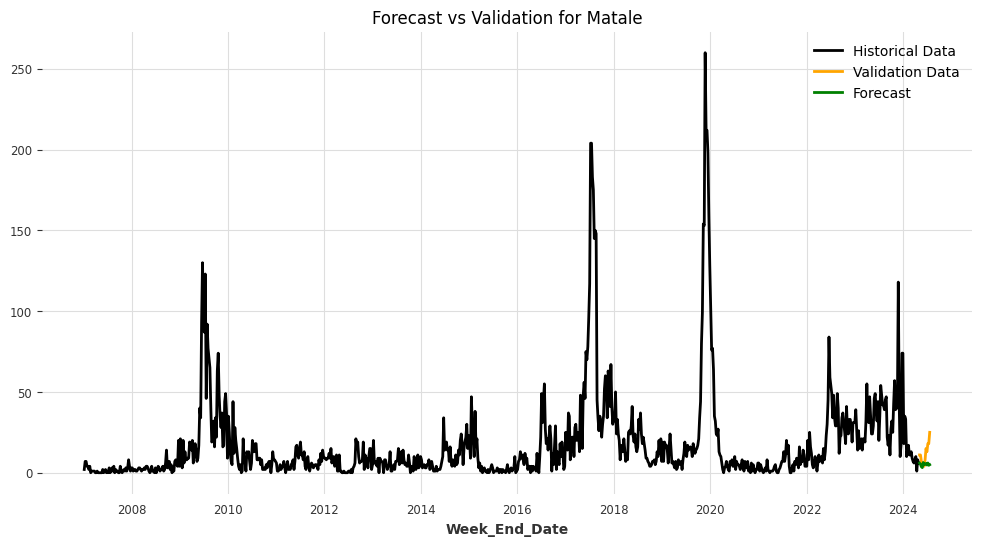

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_AutoARIMA.pkl


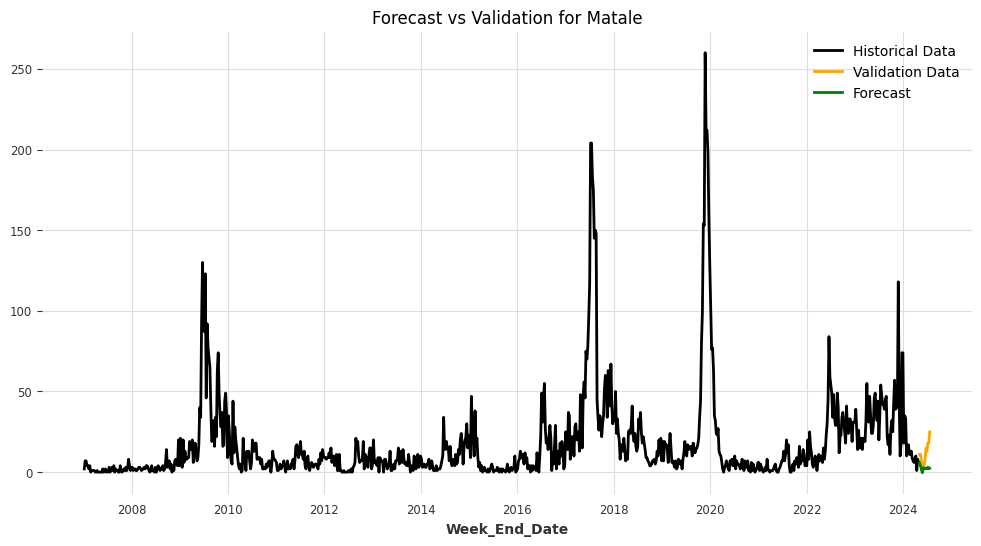

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_ExponentialSmoothing.pkl


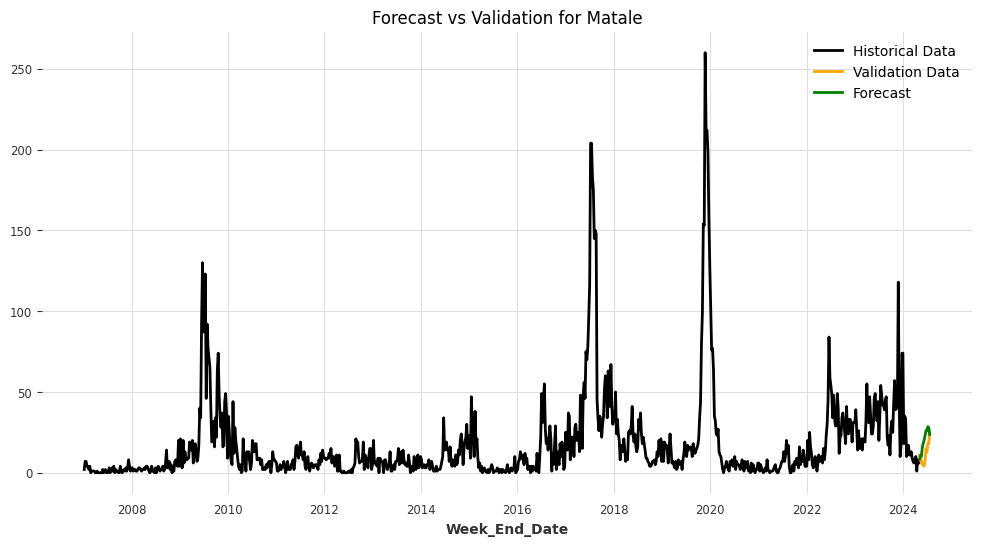

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/smxysr0y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/f2ffitnx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17404', 'data', 'file=/tmp/tmpu8y_3fe_/smxysr0y.json', 'init=/tmp/tmpu8y_3fe_/f2ffitnx.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modelb8jno9l8/prophet_model-20240910161630.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:16:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:16:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_Prophet.pkl


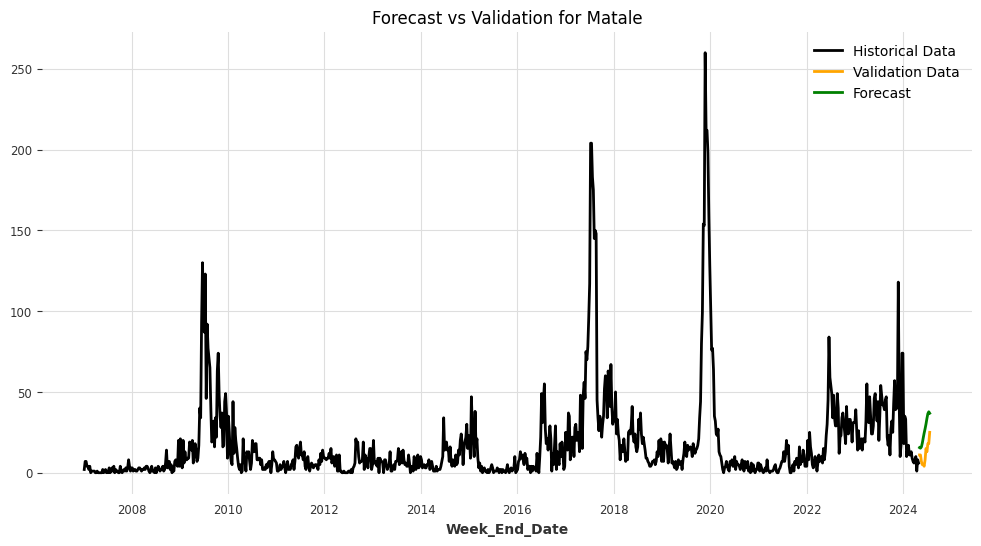

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_FFT.pkl


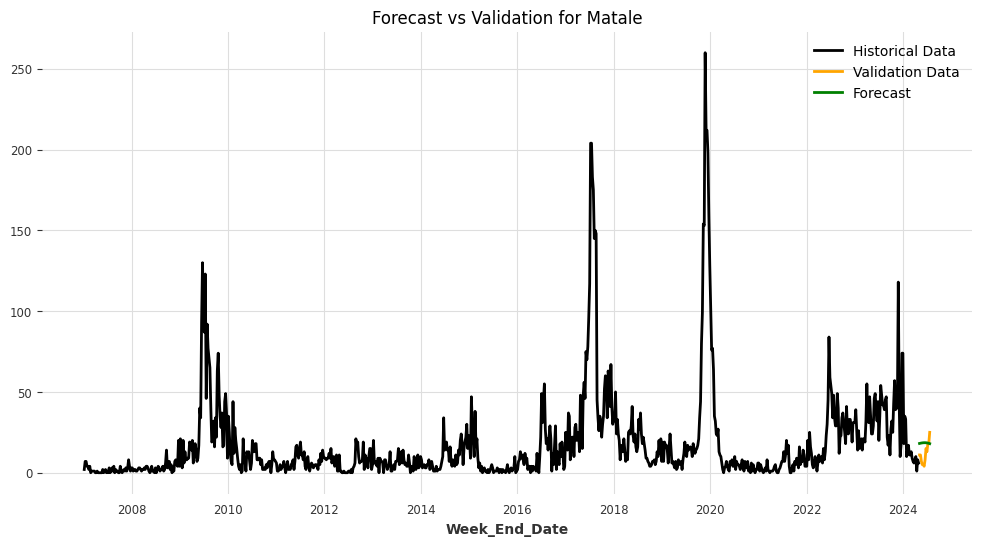

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_KalmanForecaster.pkl


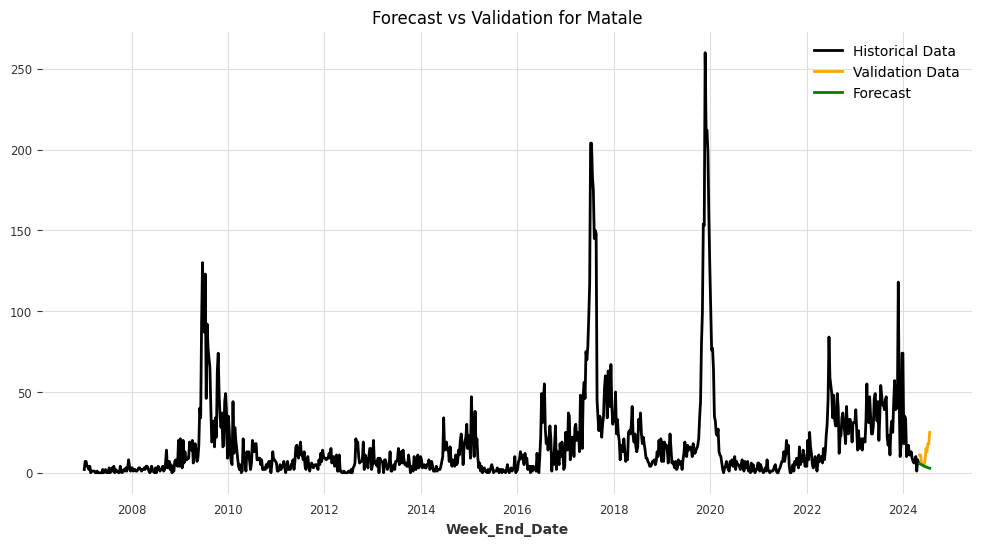

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_ARIMA.pkl


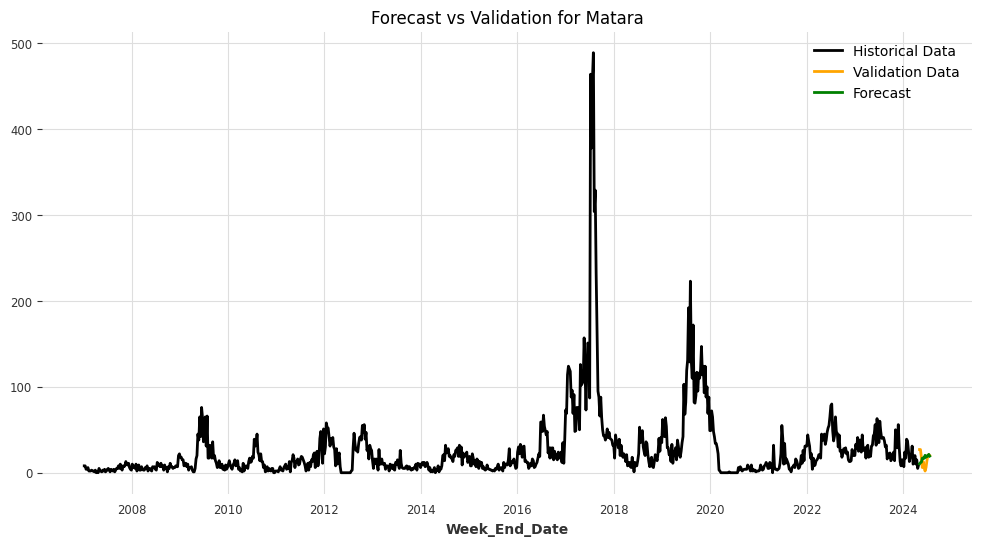

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_AutoARIMA.pkl


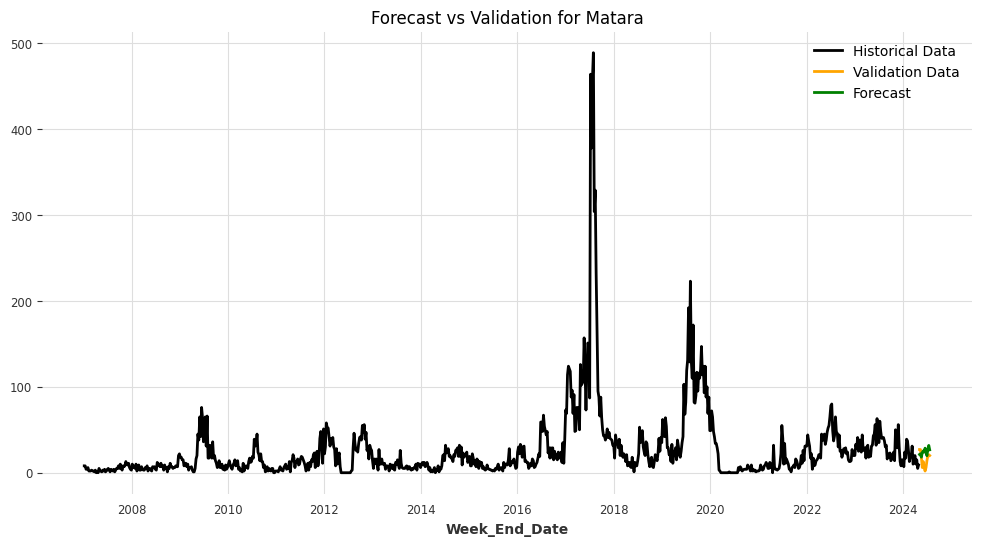

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_ExponentialSmoothing.pkl


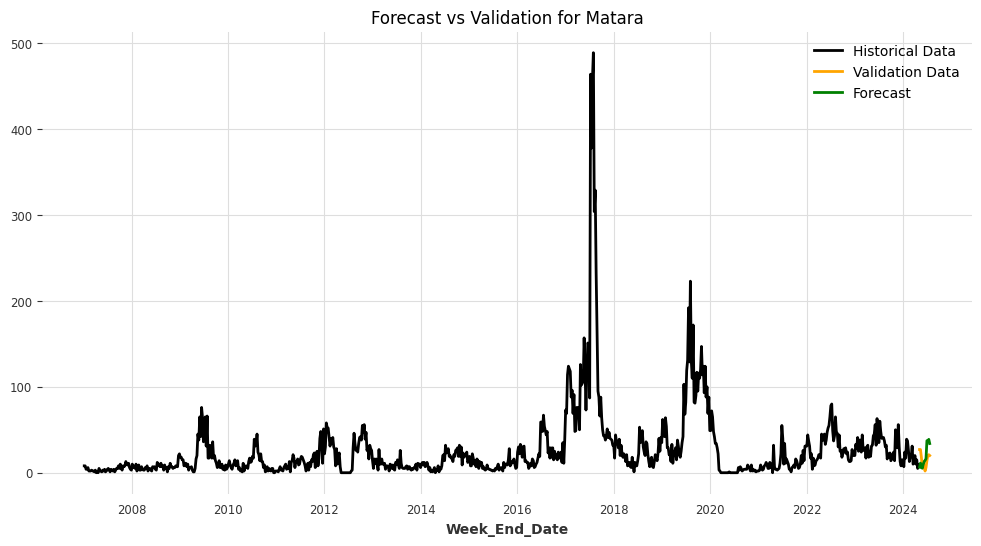

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/fkkqkn7f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/rs7i0a37.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84894', 'data', 'file=/tmp/tmpu8y_3fe_/fkkqkn7f.json', 'init=/tmp/tmpu8y_3fe_/rs7i0a37.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modelsbuv71kp/prophet_model-20240910161847.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:18:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:18:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_Prophet.pkl


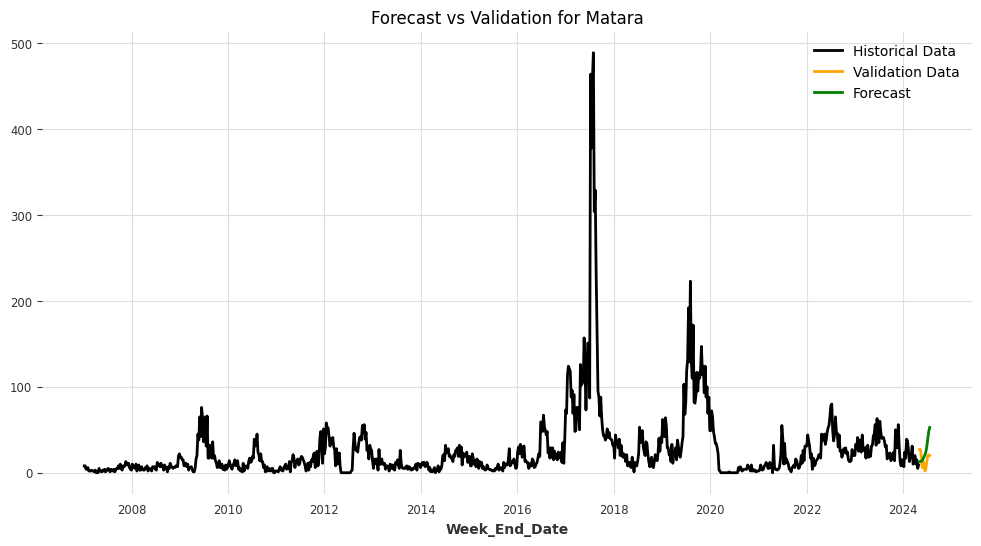

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_FFT.pkl


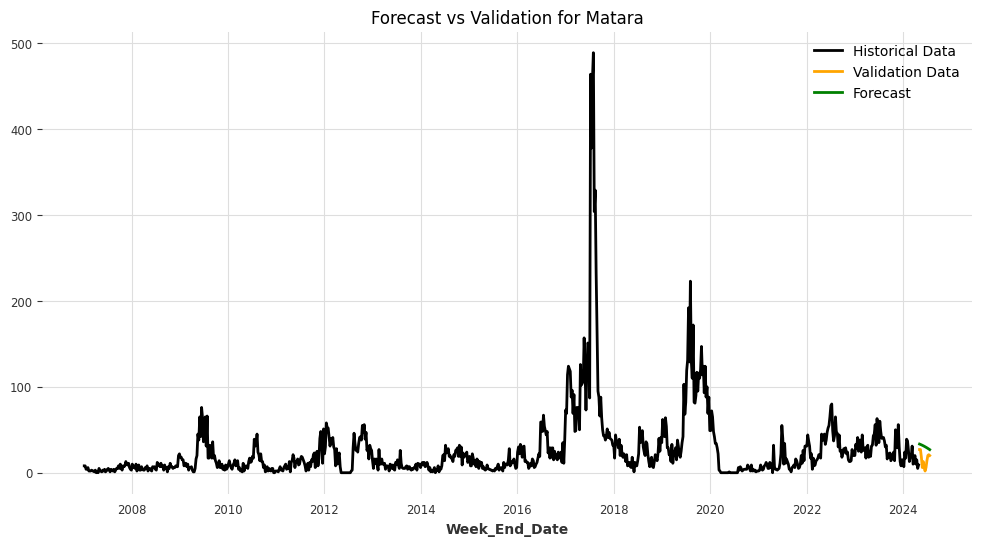

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_KalmanForecaster.pkl


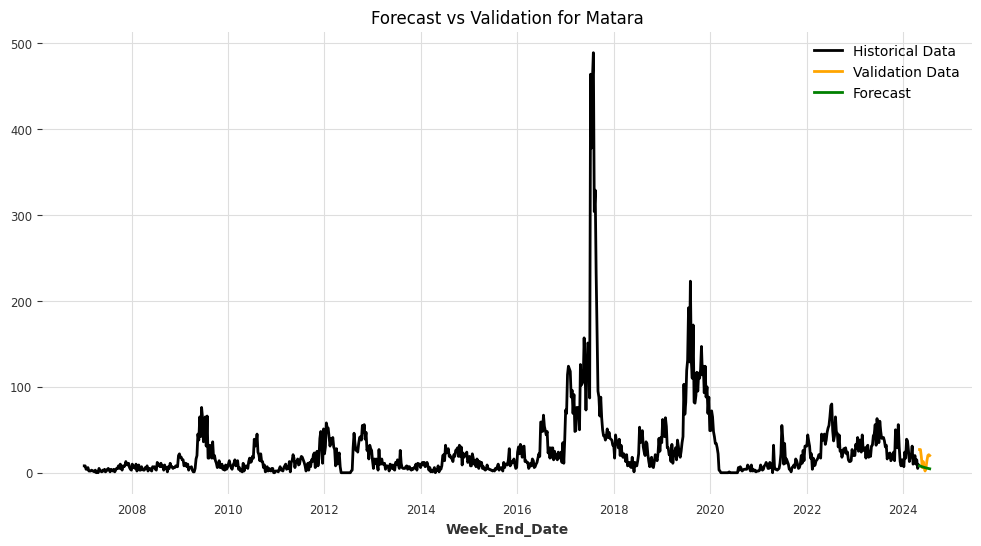

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_ARIMA.pkl


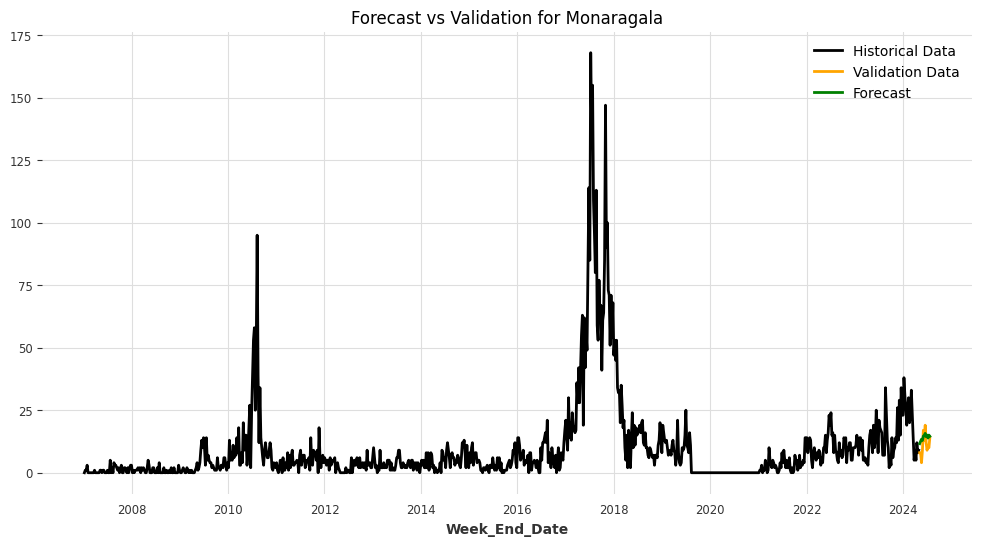

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_AutoARIMA.pkl


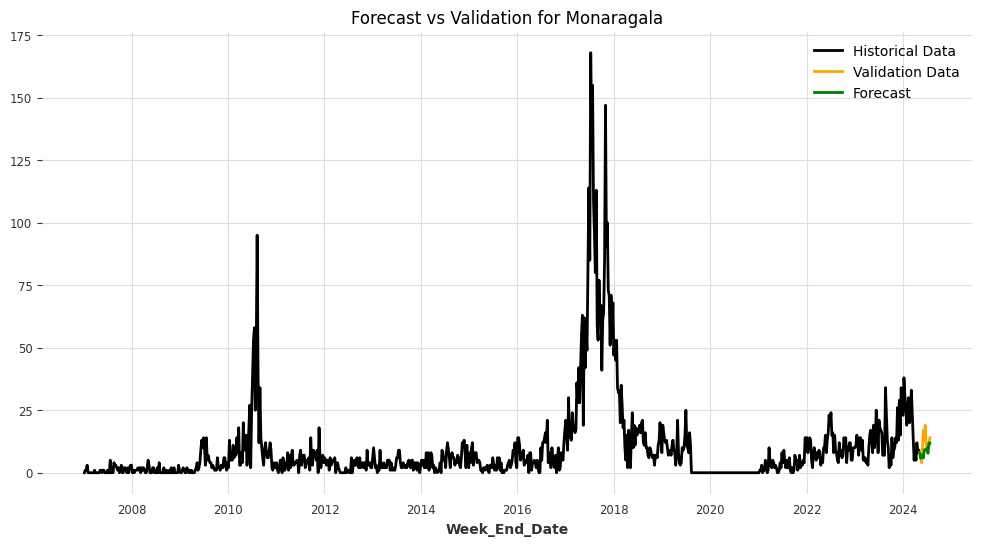

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_ExponentialSmoothing.pkl


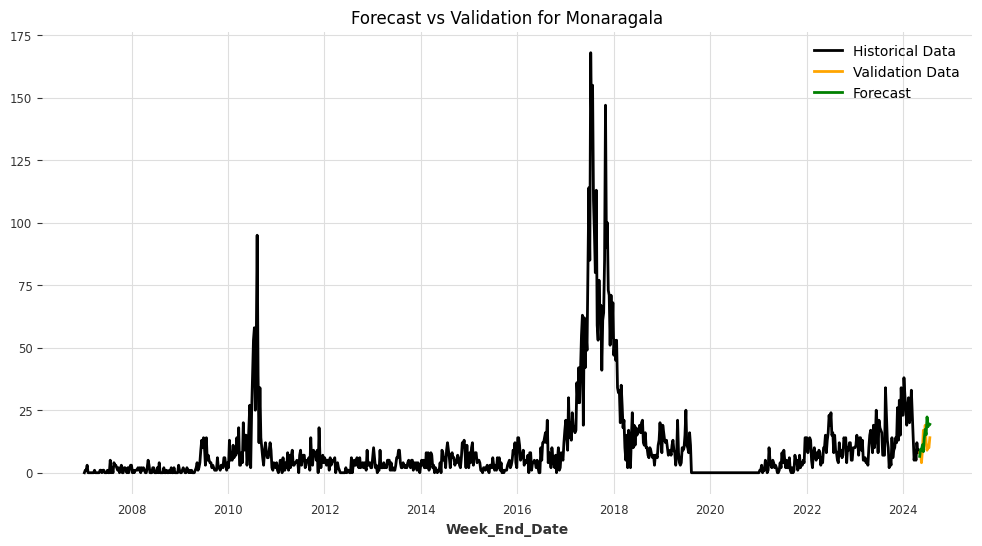

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/ds3nqmzt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/pai_xgod.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90441', 'data', 'file=/tmp/tmpu8y_3fe_/ds3nqmzt.json', 'init=/tmp/tmpu8y_3fe_/pai_xgod.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_model9_esk964/prophet_model-20240910162116.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:21:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:21:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_Prophet.pkl


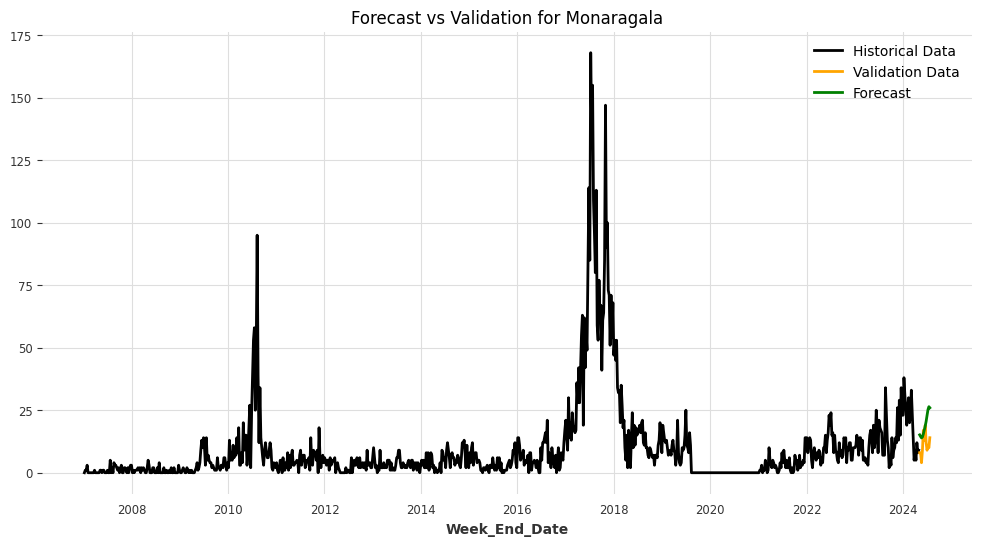

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_FFT.pkl


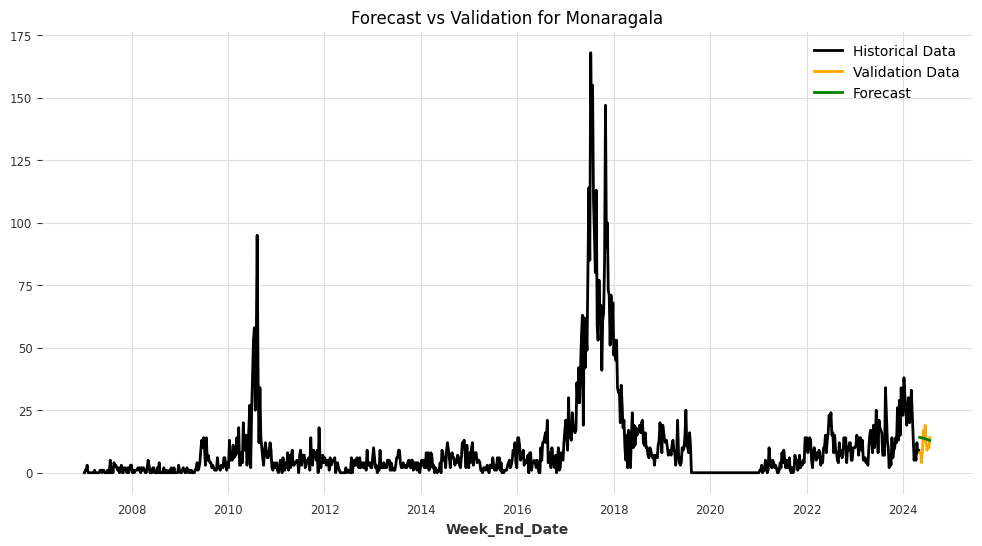

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_KalmanForecaster.pkl


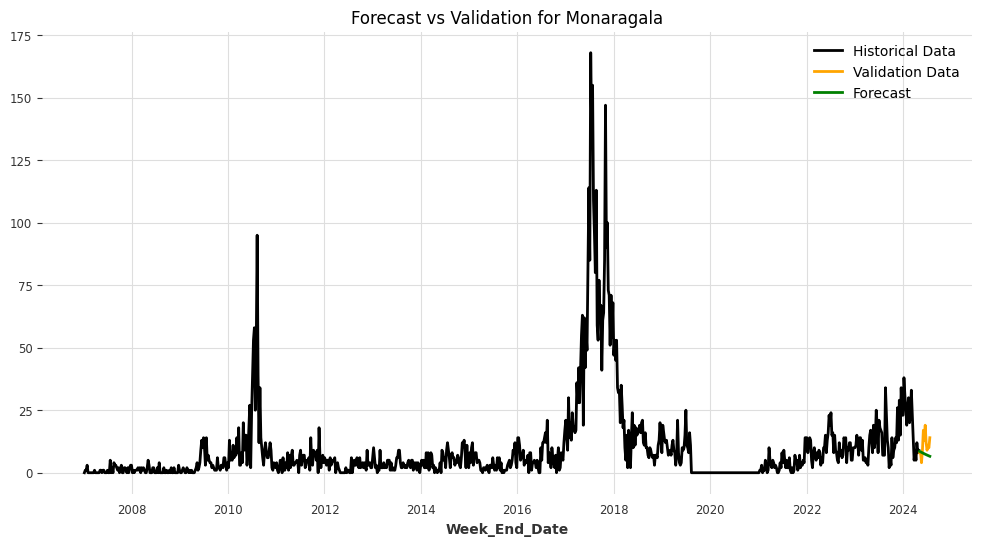

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_ARIMA.pkl


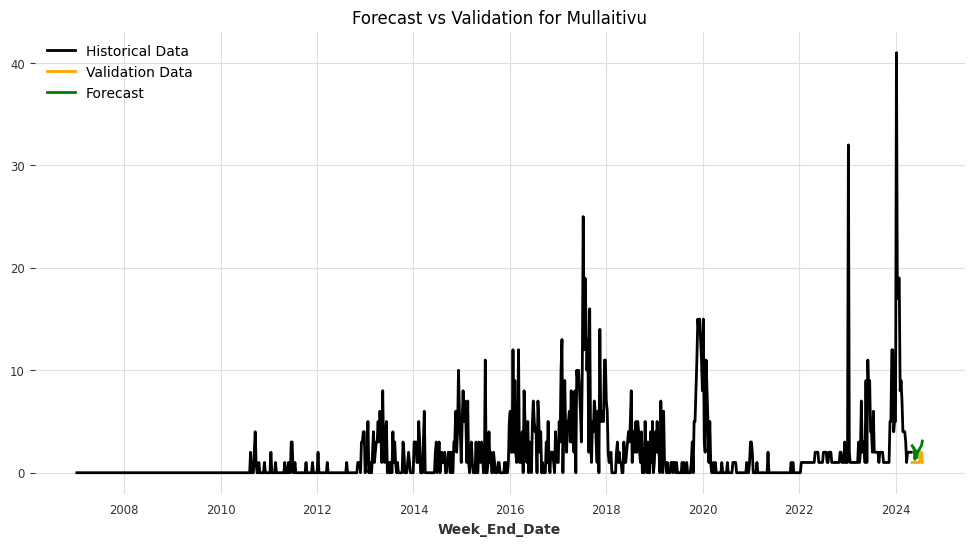

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_AutoARIMA.pkl


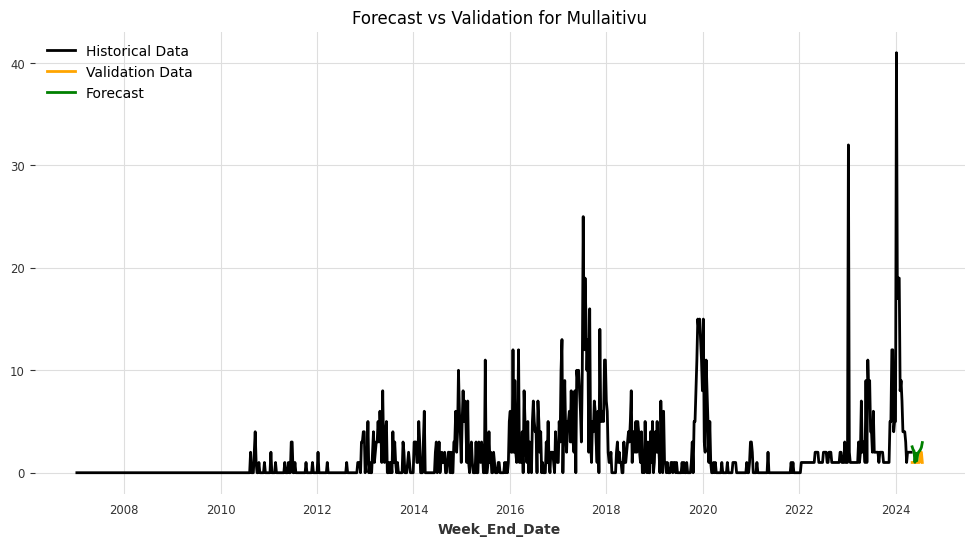

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_ExponentialSmoothing.pkl


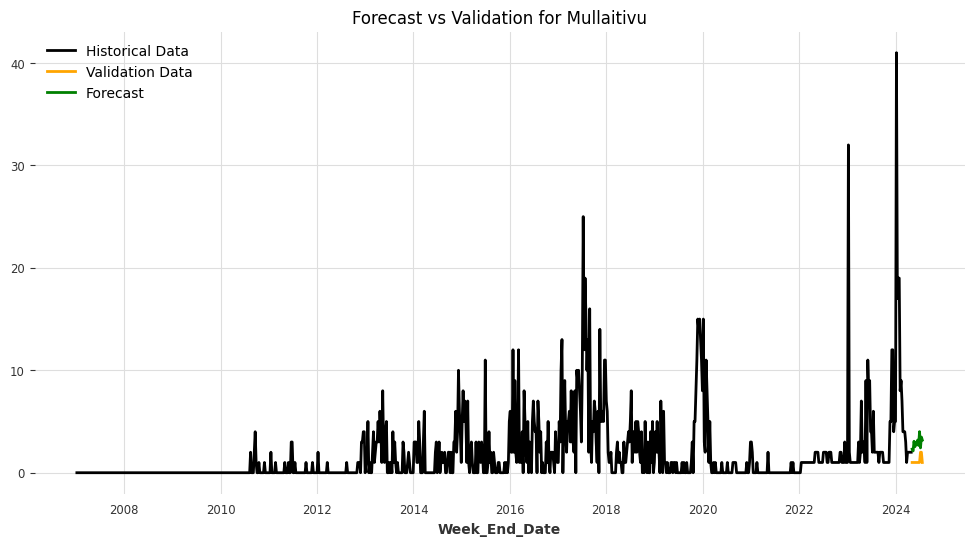

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/e2j8k4t8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/r69kuyfj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4112', 'data', 'file=/tmp/tmpu8y_3fe_/e2j8k4t8.json', 'init=/tmp/tmpu8y_3fe_/r69kuyfj.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_model3vgfmc0v/prophet_model-20240910162237.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:22:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:22:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_Prophet.pkl


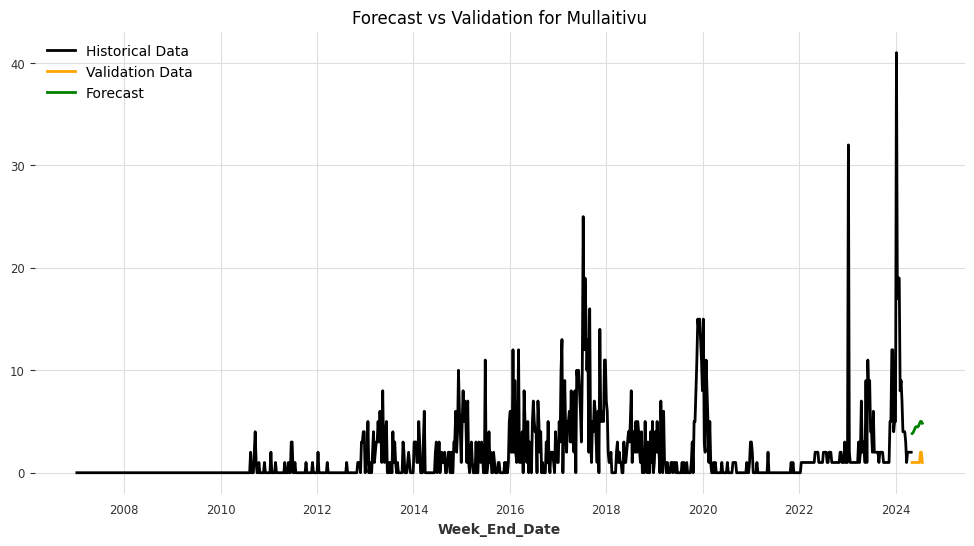

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_FFT.pkl


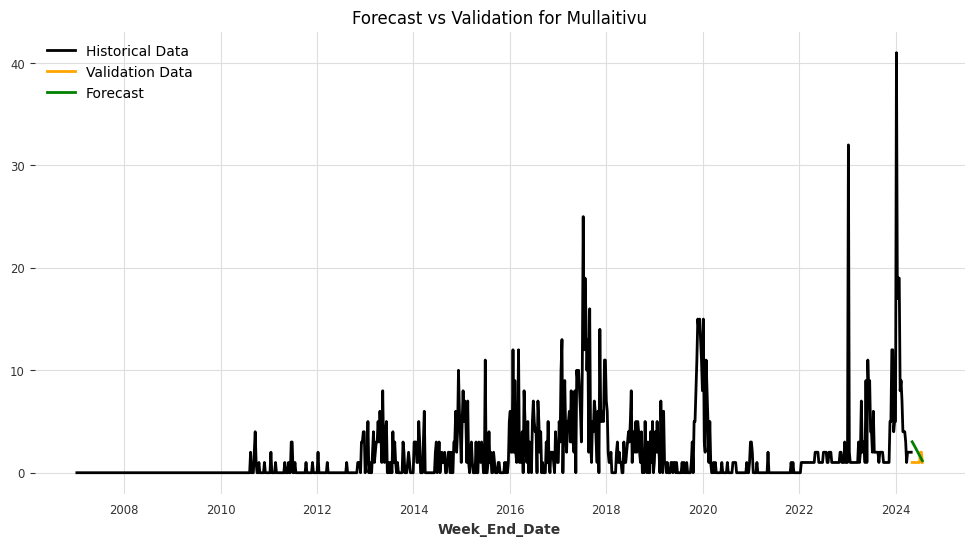

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_KalmanForecaster.pkl


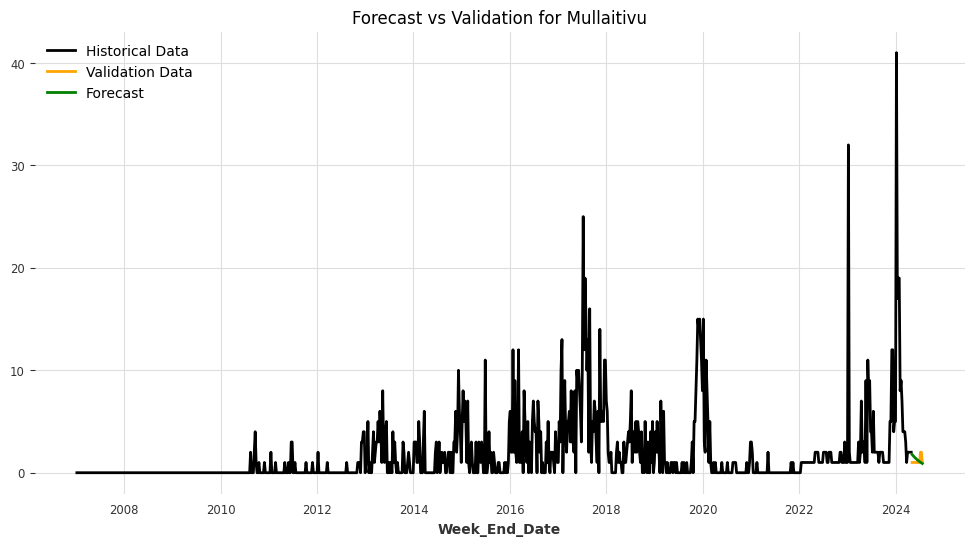

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_ARIMA.pkl


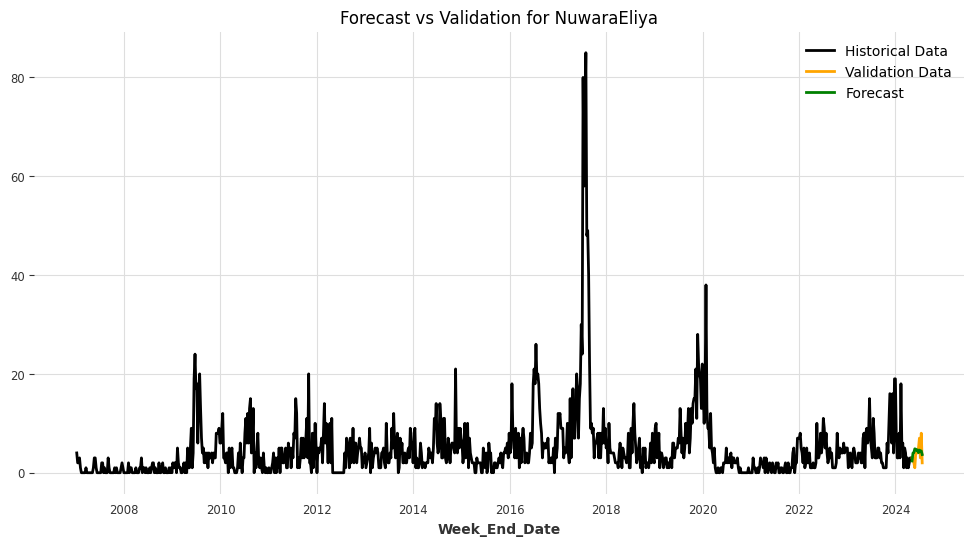

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_AutoARIMA.pkl


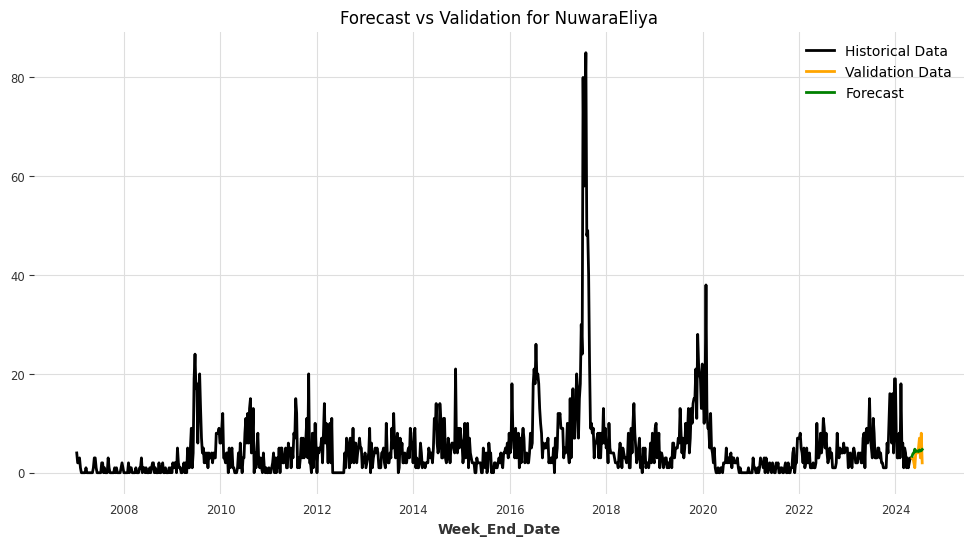

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_ExponentialSmoothing.pkl


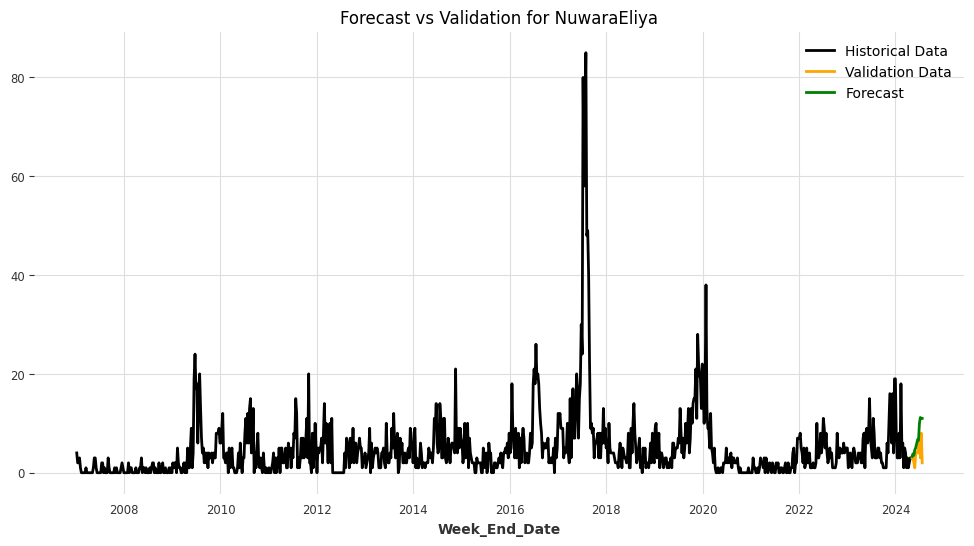

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/9o2xen_v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/mobfvotu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96845', 'data', 'file=/tmp/tmpu8y_3fe_/9o2xen_v.json', 'init=/tmp/tmpu8y_3fe_/mobfvotu.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modelpbllem3d/prophet_model-20240910162536.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:25:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:25:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_Prophet.pkl


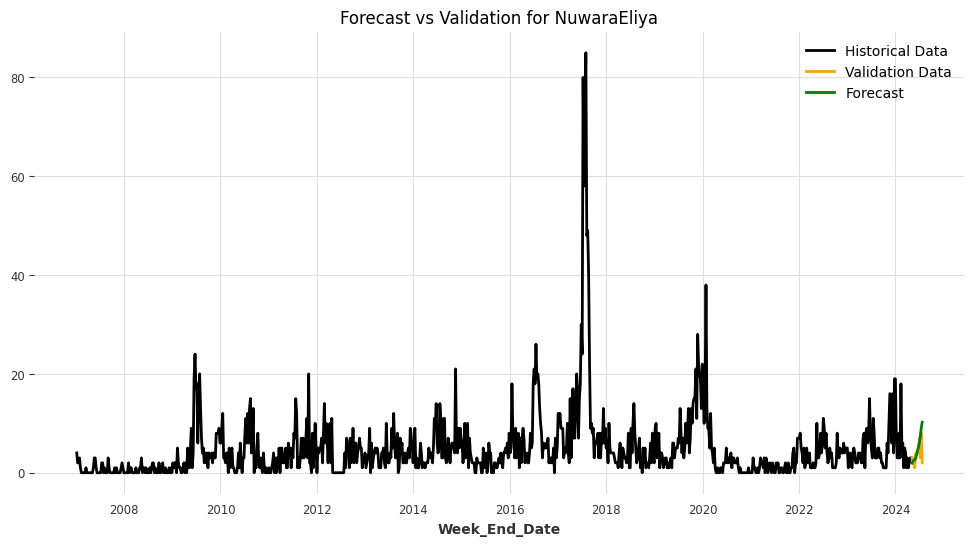

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_FFT.pkl


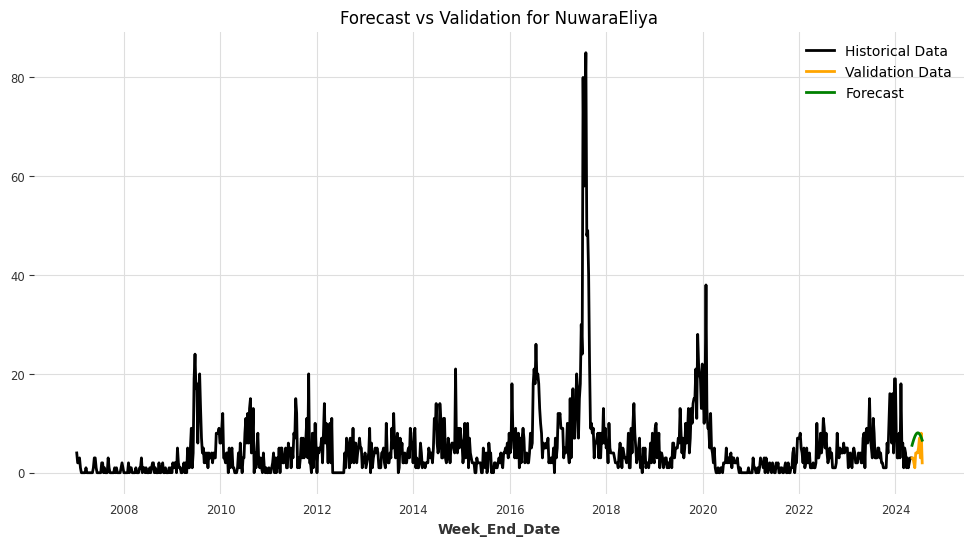

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_KalmanForecaster.pkl


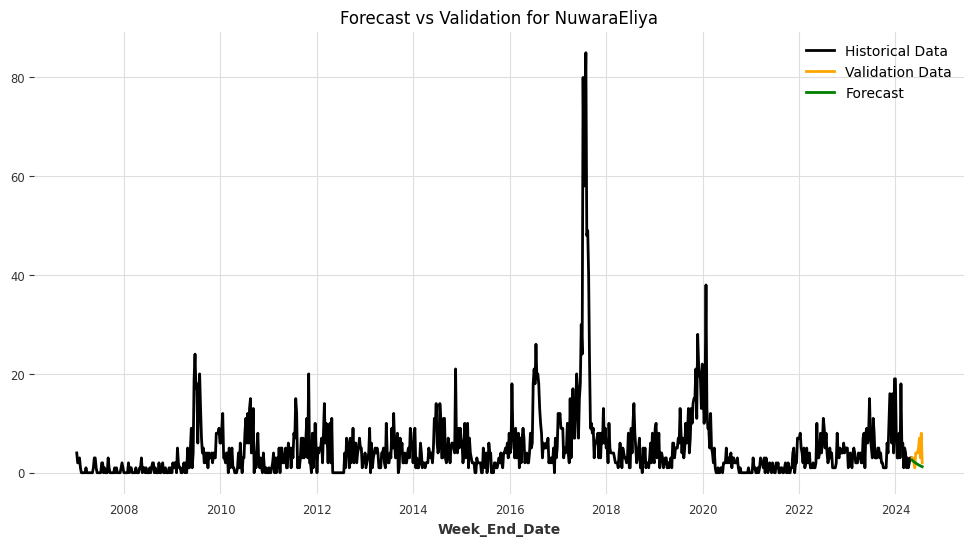

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_ARIMA.pkl


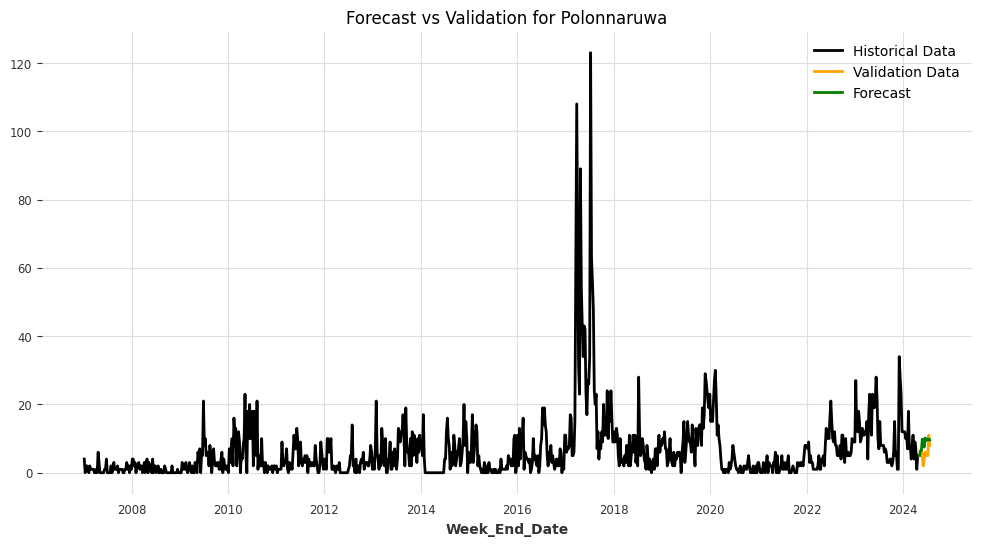

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_AutoARIMA.pkl


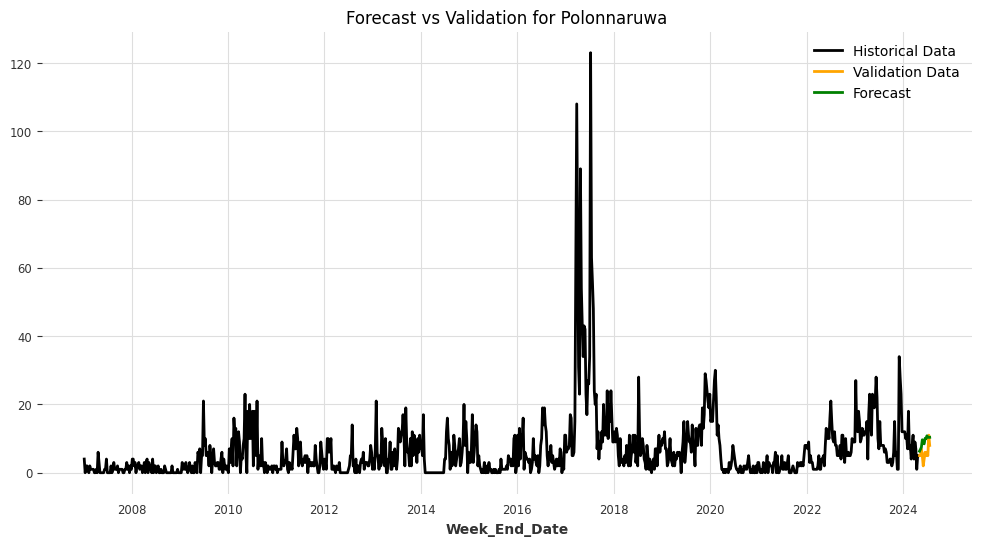

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_ExponentialSmoothing.pkl


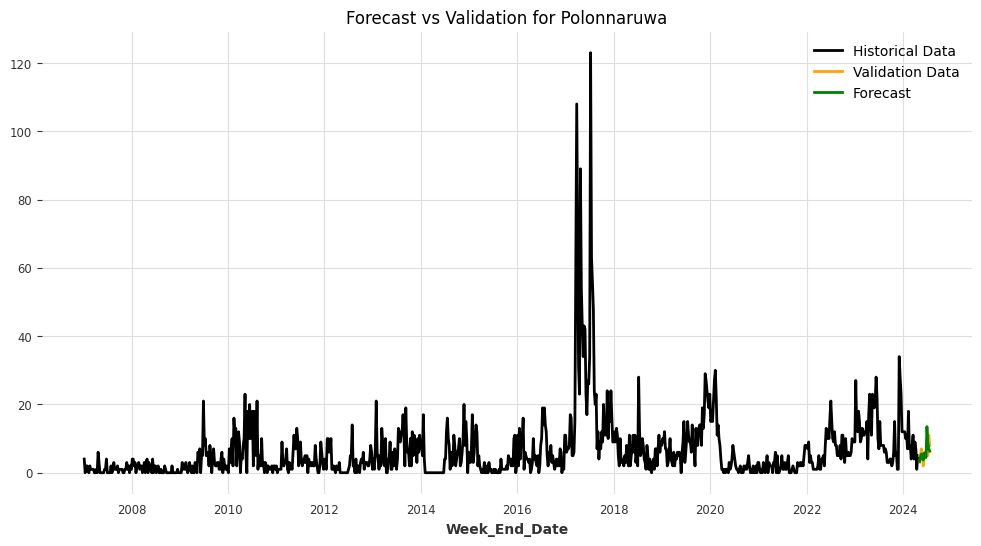

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/8m6ygn46.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/nv0od5co.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57098', 'data', 'file=/tmp/tmpu8y_3fe_/8m6ygn46.json', 'init=/tmp/tmpu8y_3fe_/nv0od5co.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modellnlu14zq/prophet_model-20240910162727.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:27:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:27:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_Prophet.pkl


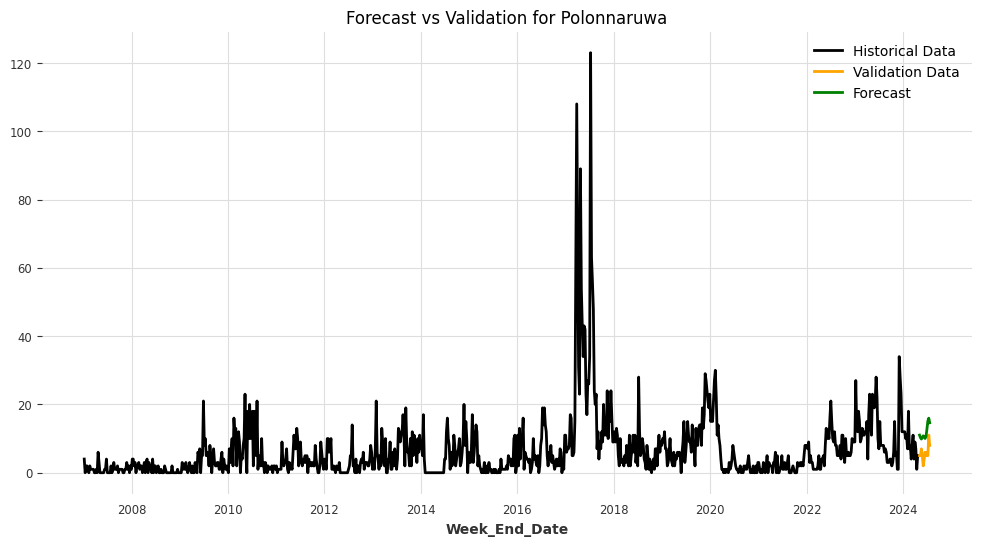

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_FFT.pkl


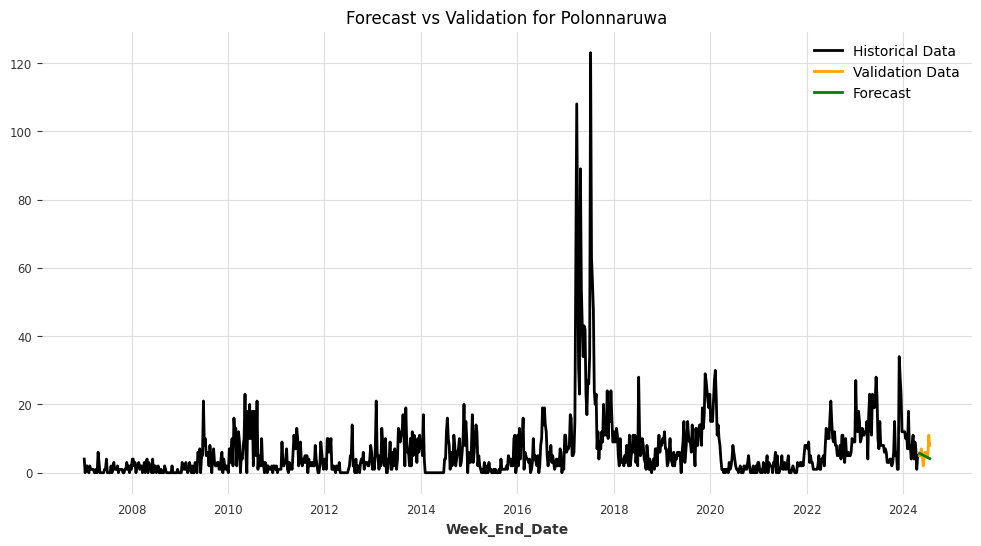

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_KalmanForecaster.pkl


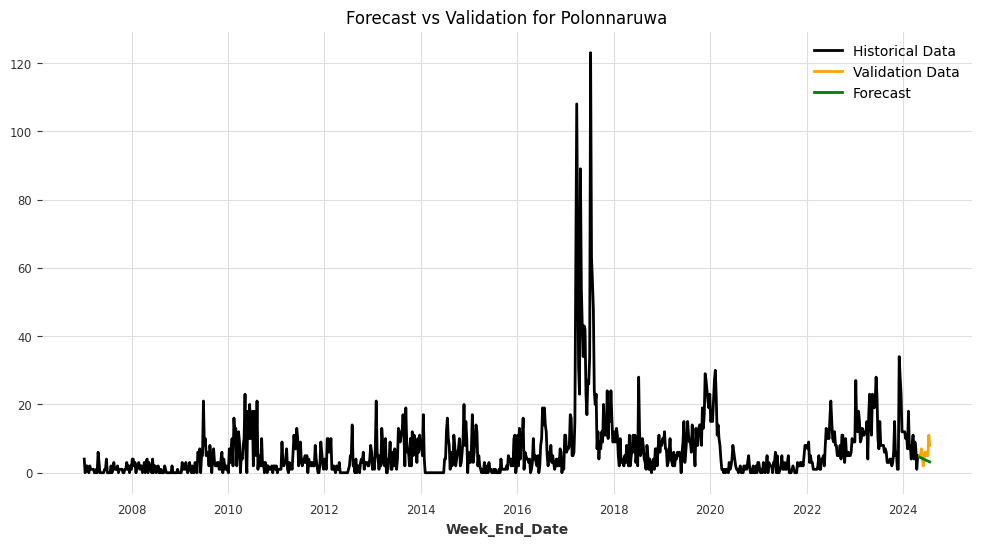

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_ARIMA.pkl


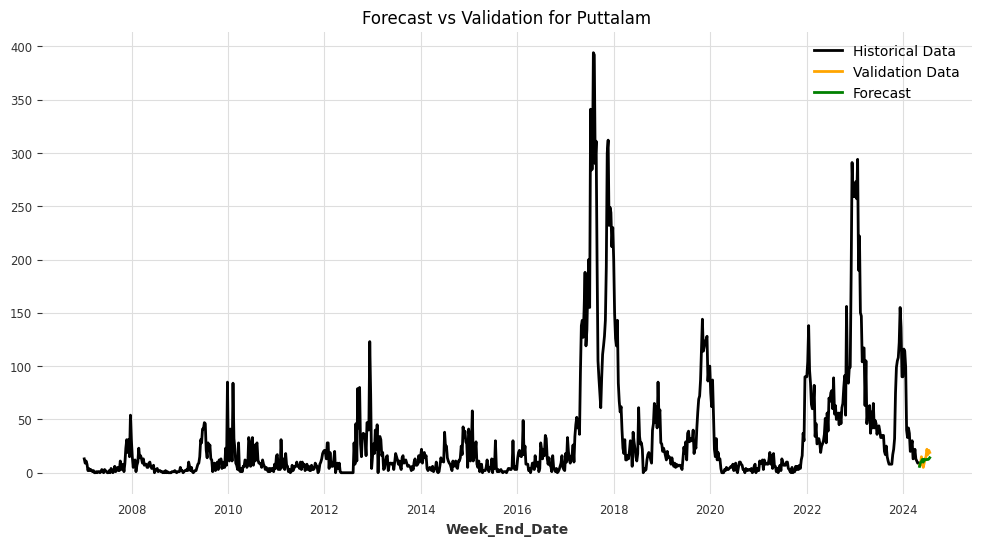

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_AutoARIMA.pkl


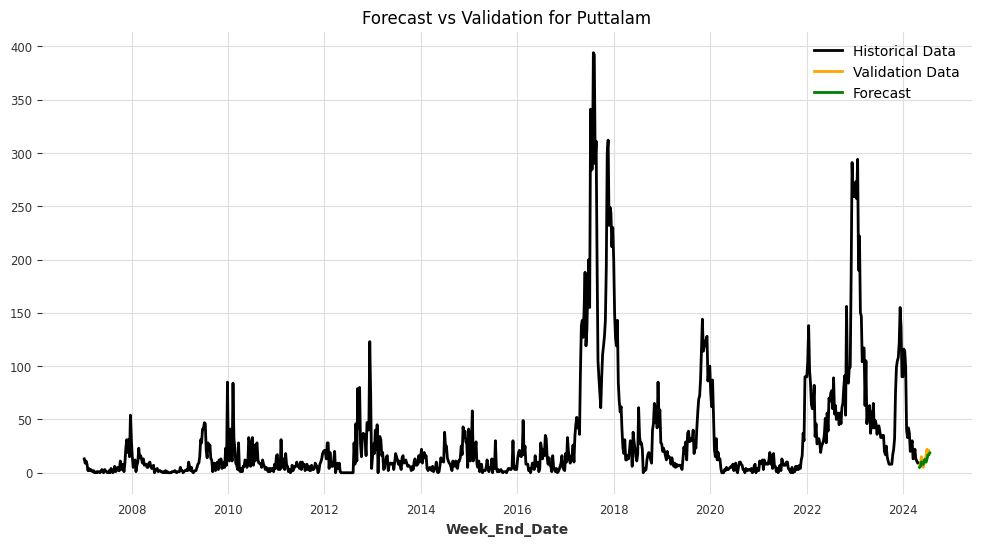

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_ExponentialSmoothing.pkl


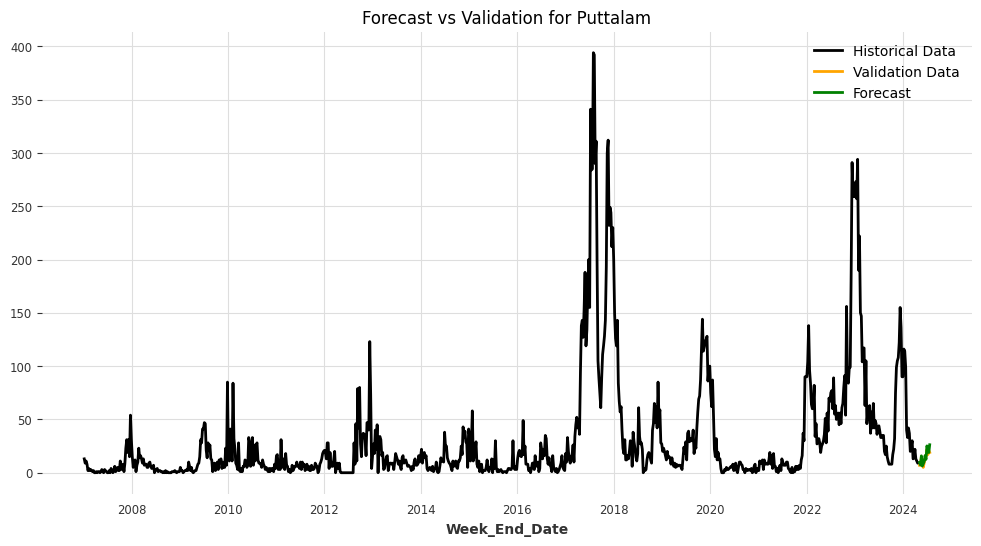

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/dieudaq3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/7wcusjmt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69592', 'data', 'file=/tmp/tmpu8y_3fe_/dieudaq3.json', 'init=/tmp/tmpu8y_3fe_/7wcusjmt.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_model6bmy_qzp/prophet_model-20240910162828.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:28:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:28:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_Prophet.pkl


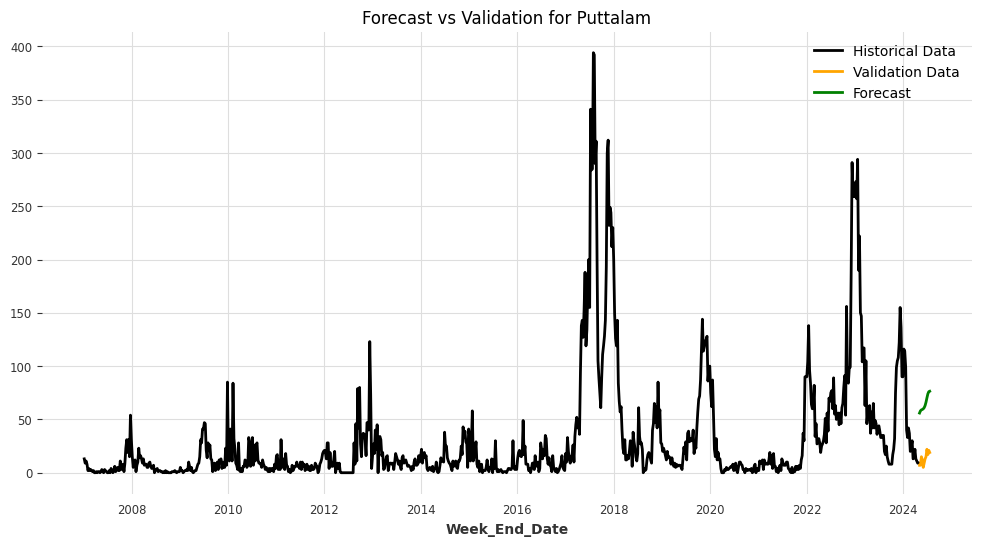

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_FFT.pkl


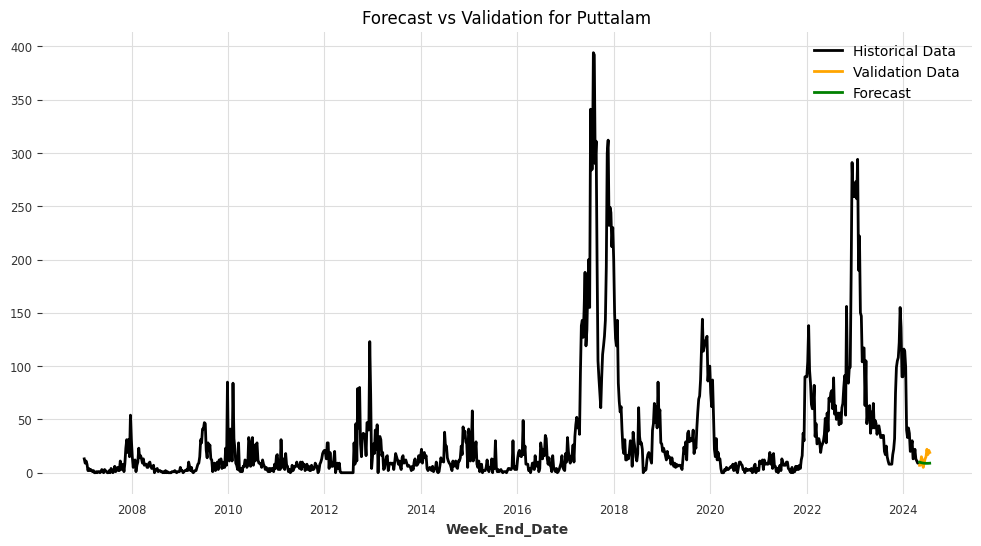

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_KalmanForecaster.pkl


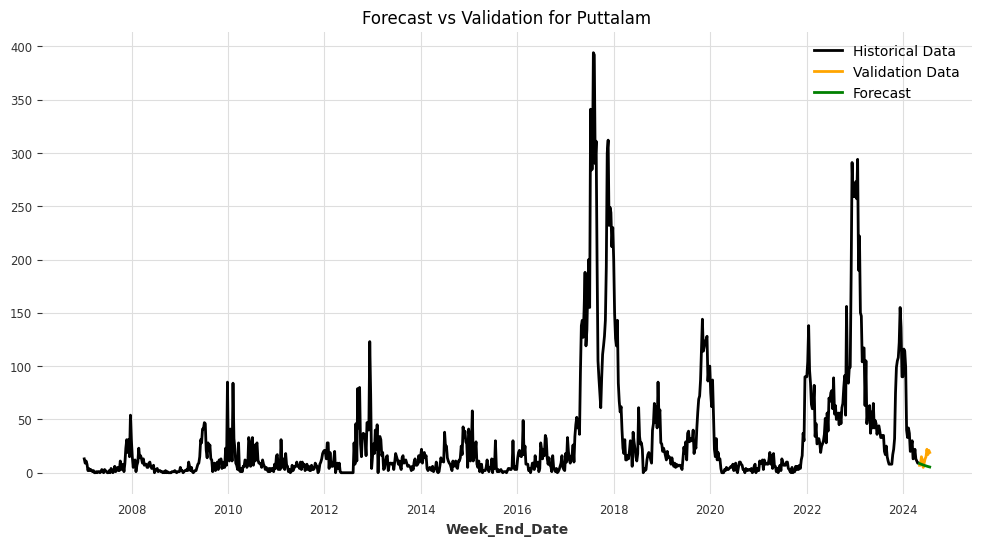

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_ARIMA.pkl


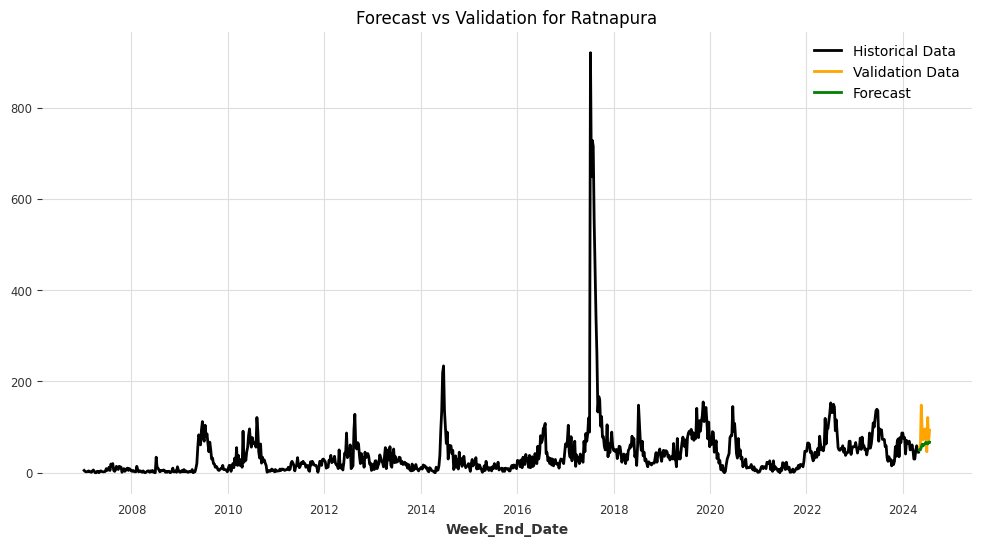

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_AutoARIMA.pkl


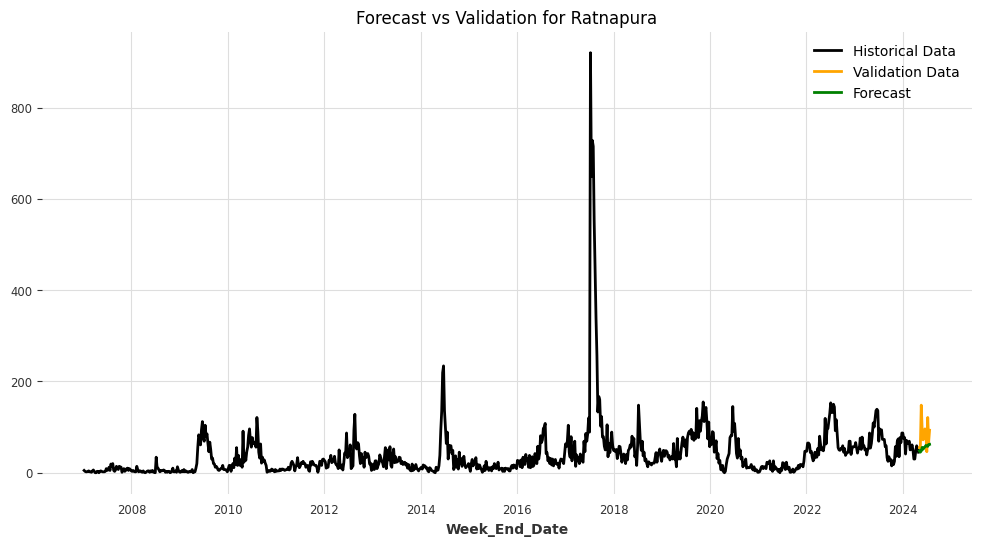

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_ExponentialSmoothing.pkl


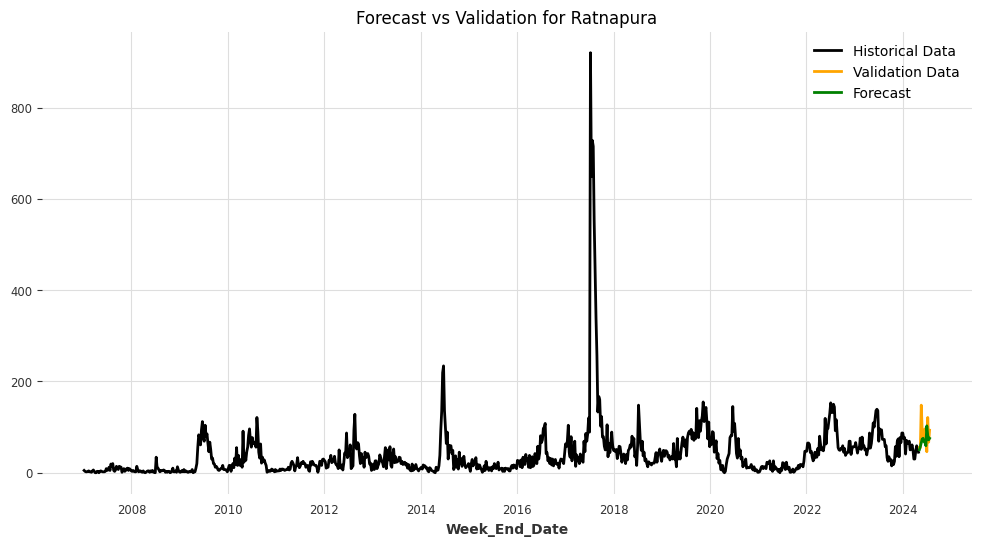

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/cabo34ww.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/hykvetqe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38222', 'data', 'file=/tmp/tmpu8y_3fe_/cabo34ww.json', 'init=/tmp/tmpu8y_3fe_/hykvetqe.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modelvnt3lxed/prophet_model-20240910163050.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:30:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:30:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_Prophet.pkl


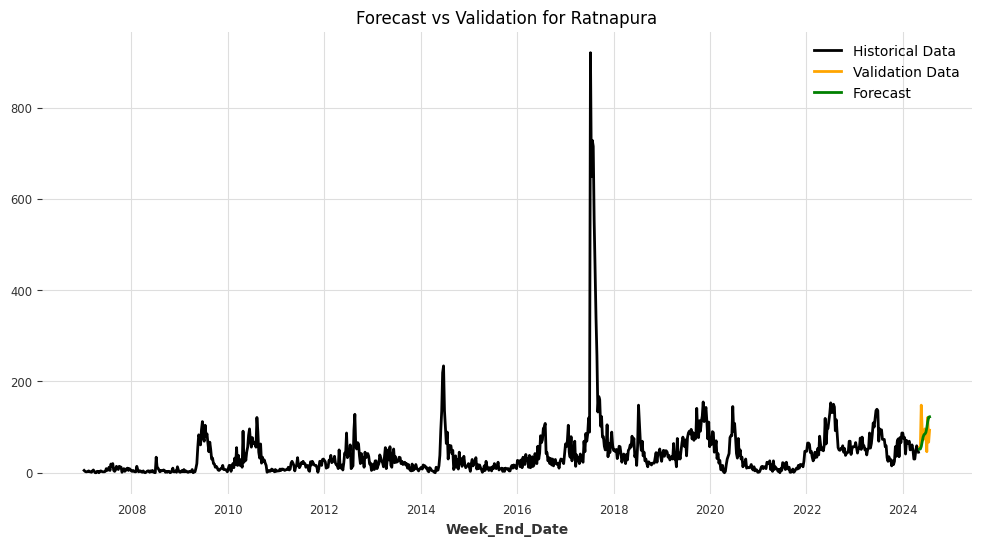

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_FFT.pkl


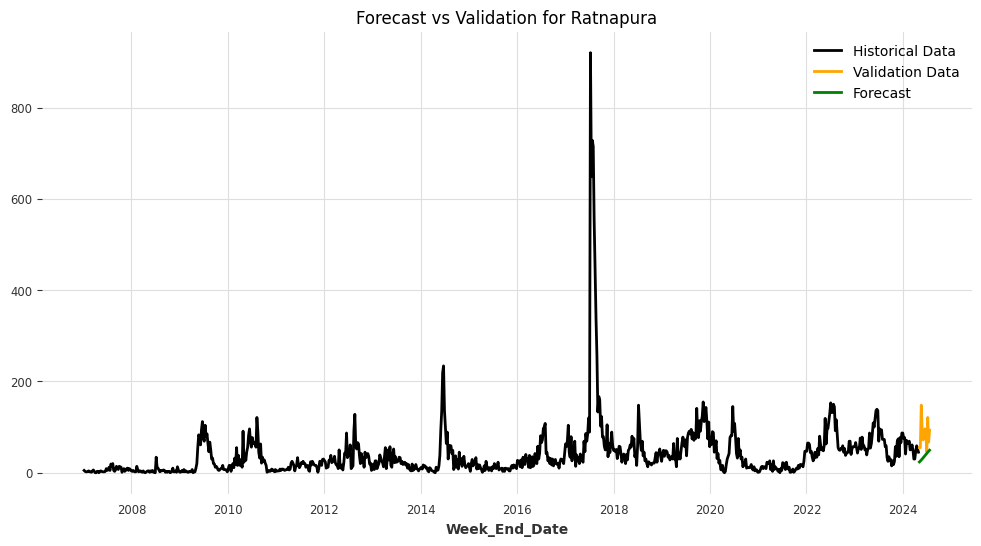

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_KalmanForecaster.pkl


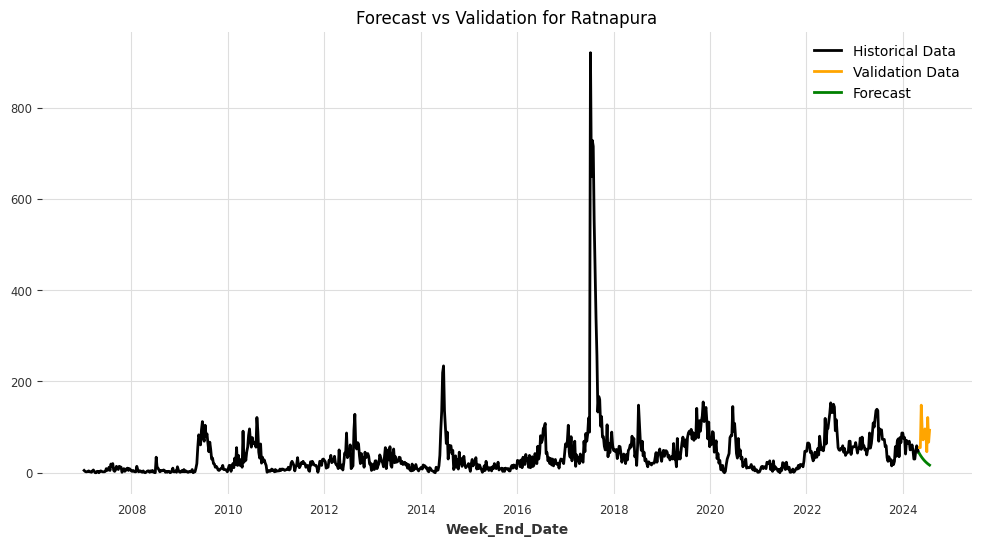

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_ARIMA.pkl


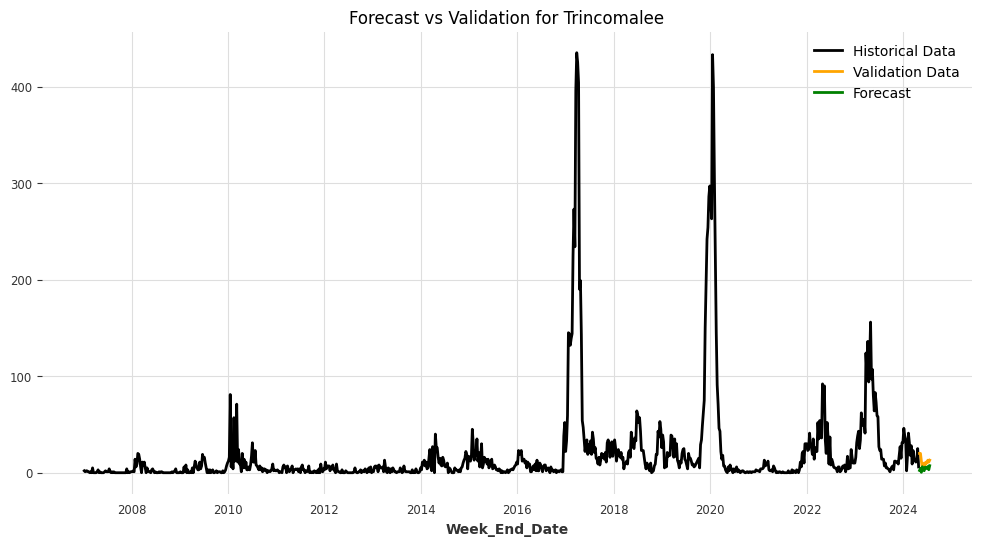

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_AutoARIMA.pkl


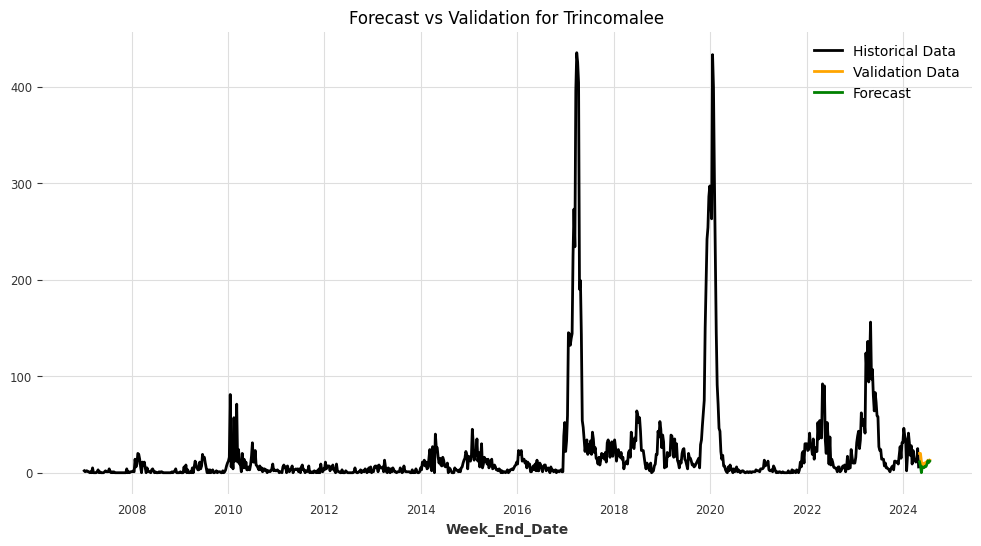

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_ExponentialSmoothing.pkl


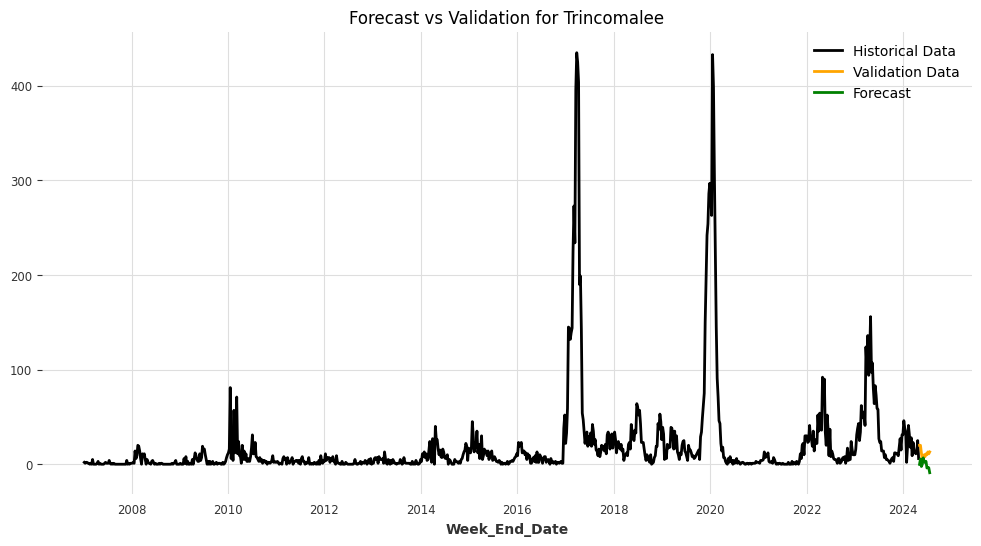

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/s11otk_p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/9k8hkc4f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87678', 'data', 'file=/tmp/tmpu8y_3fe_/s11otk_p.json', 'init=/tmp/tmpu8y_3fe_/9k8hkc4f.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modelgxdmdliq/prophet_model-20240910163422.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:34:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:34:22 - cmds

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_Prophet.pkl


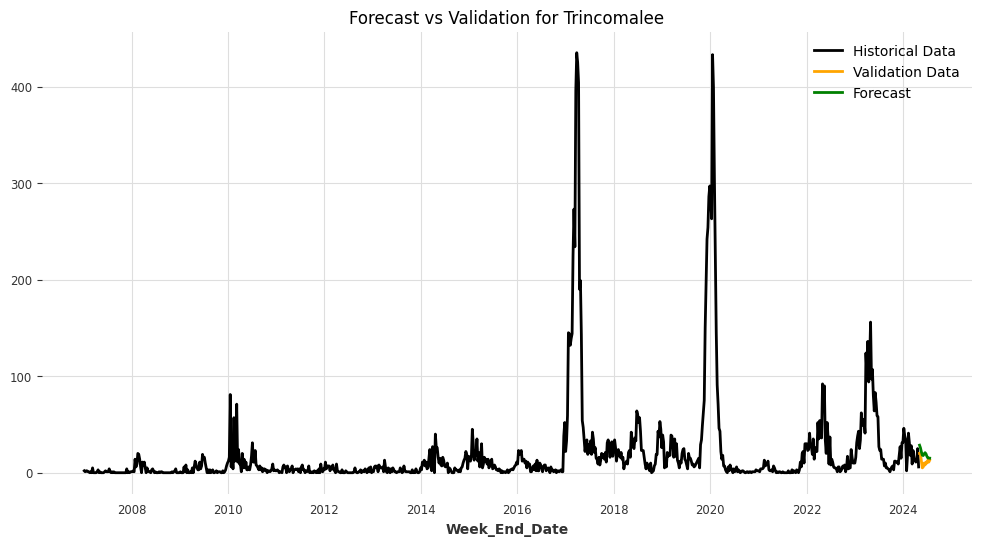

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_FFT.pkl


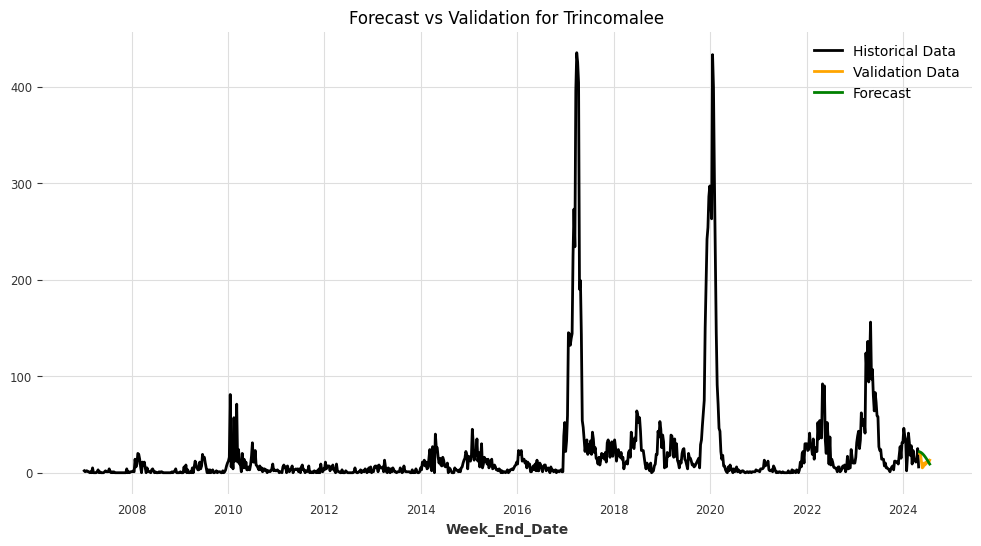

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_KalmanForecaster.pkl


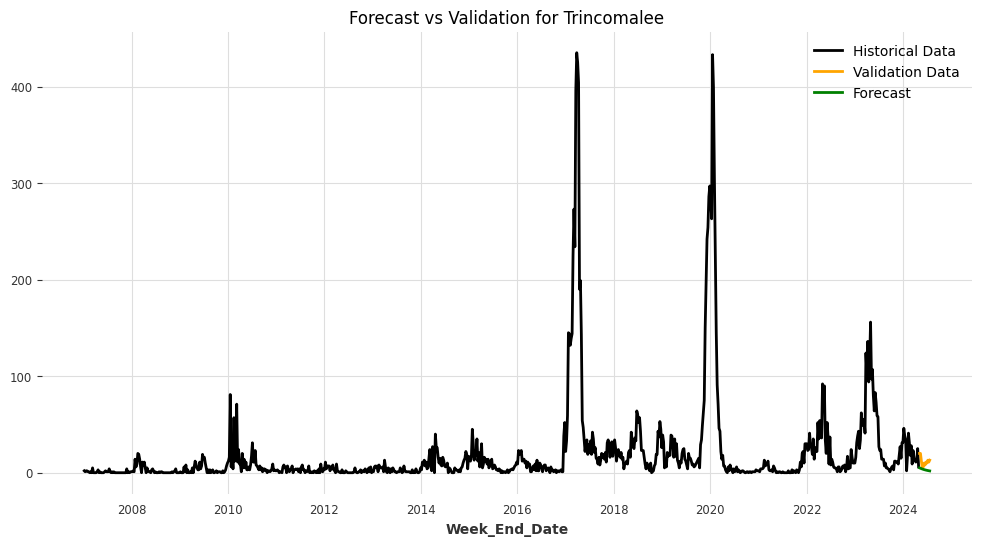

<ipython-input-23-0c9e2d8913de>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_ARIMA.pkl


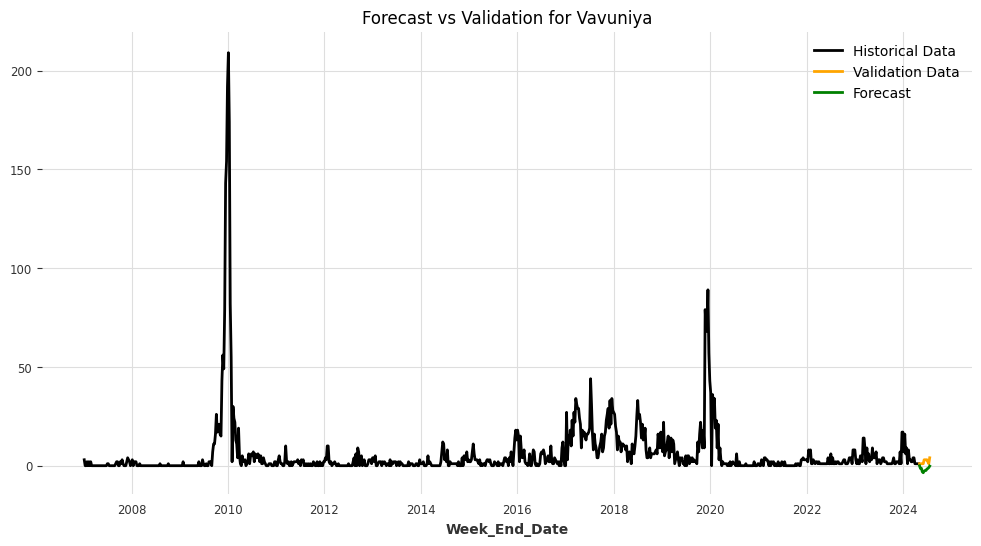

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_AutoARIMA.pkl


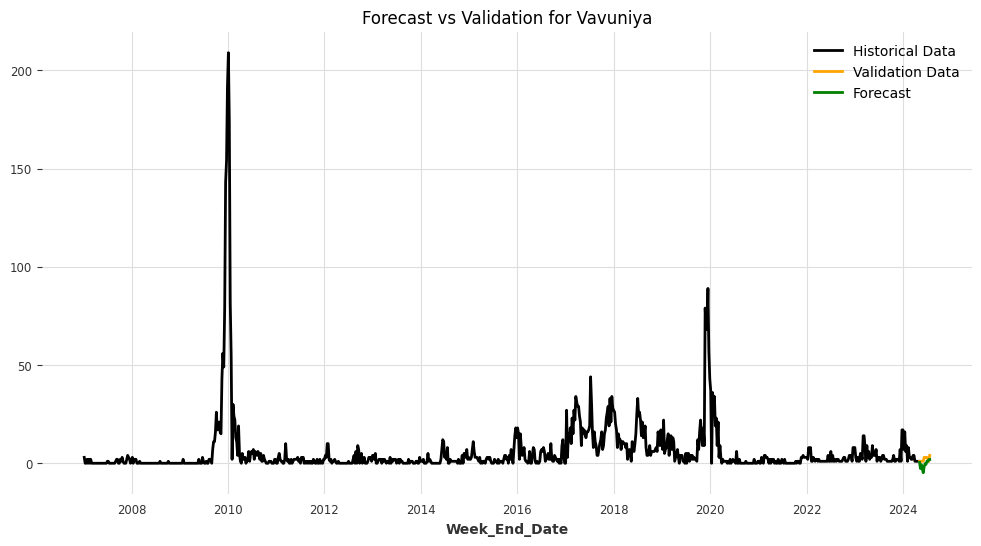

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_ExponentialSmoothing.pkl


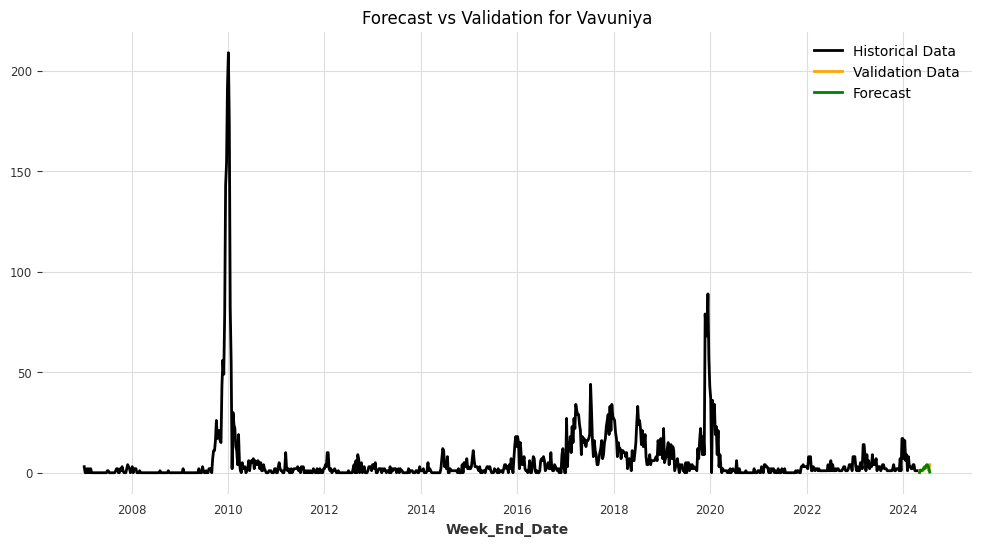

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/9eok51f6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpu8y_3fe_/dl32adb3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7525', 'data', 'file=/tmp/tmpu8y_3fe_/9eok51f6.json', 'init=/tmp/tmpu8y_3fe_/dl32adb3.json', 'output', 'file=/tmp/tmpu8y_3fe_/prophet_modelvh9j7hch/prophet_model-20240910163653.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:36:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:36:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_Prophet.pkl


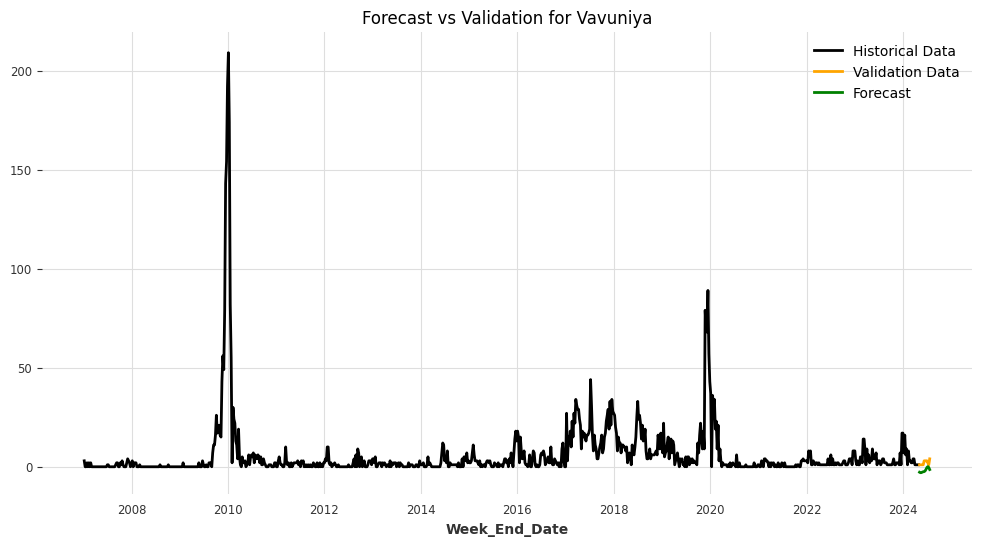

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_FFT.pkl


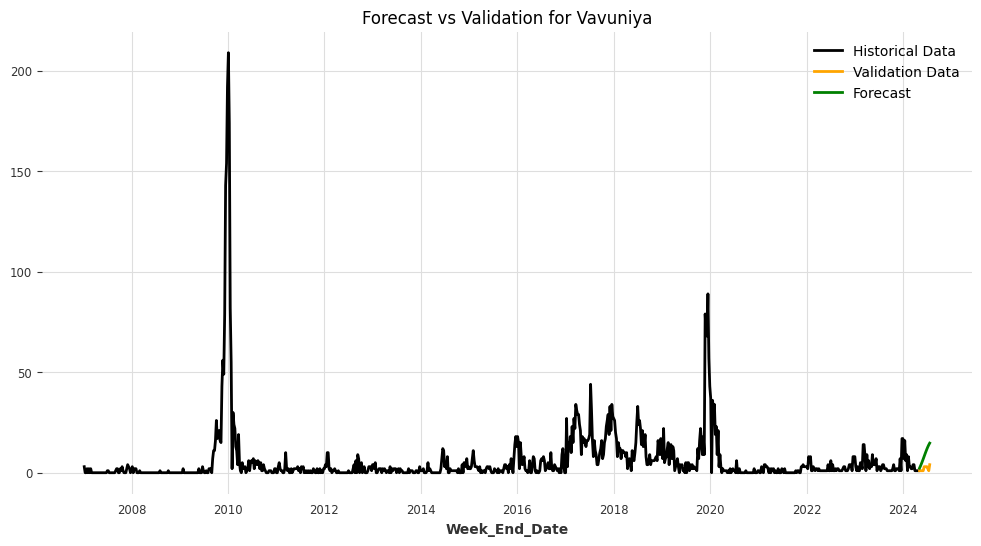

Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_KalmanForecaster.pkl


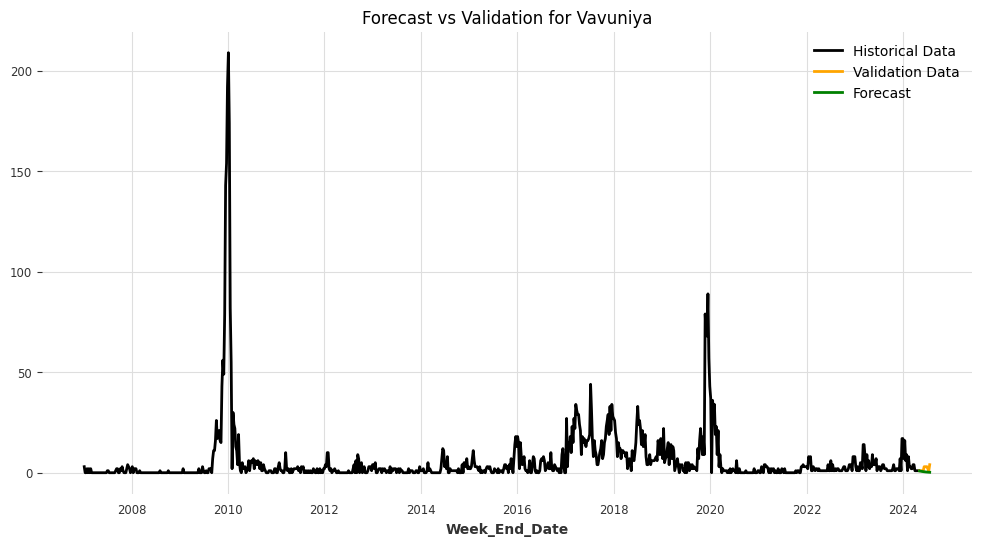

In [24]:
results = main(df, models)

## 6. Result

In [25]:
# Initialize a list to store metrics
metrics_list = []
districts = df['District'].unique()

# Iterate over results and extract metrics
for district_index, district_results in enumerate(results):
    for model_index, (forecast, metrics) in enumerate(district_results):
        metrics_list.append({
            'District': f'{districts[district_index]}',
            'Model': models[model_index],
            'RMSE': metrics['RMSE'],
            'MAE': metrics['MAE'],
            'SMAPE': metrics['SMAPE'],
            'R2': metrics['R2'],
            'RMSLE': metrics['RMSLE']
        })

# Create a DataFrame from the metrics list
df_metrics = pd.DataFrame(metrics_list)
df_metrics.set_index(['District', 'Model'], inplace=True)

In [26]:
from IPython.display import display
from IPython.display import HTML

def display_district_metrics(df_metrics):
    districts = df_metrics.index.get_level_values('District').unique()

    for district in districts:
        print(f"Metrics for {district}:")
        district_df = df_metrics.loc[district]
        styled_df = district_df.style \
         .highlight_min(color="lightgreen", axis=0)

        display(styled_df)

# Example usage
display_district_metrics(df_metrics)


Metrics for Ampara:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),6.528338,5.399917,46.057934,-0.519100,0.568907
AutoARIMA(),10.864677,10.195416,68.117765,-3.207409,0.738600
ExponentialSmoothing(),10.010950,8.062137,60.379927,-2.572167,0.727783
Prophet(),28.179742,26.063120,107.433479,-27.304479,1.318792
FFT(),11.293416,9.888162,144.454394,-3.546024,1.613368
KalmanForecaster(),7.778200,6.352604,61.733843,-1.156450,0.694465


Metrics for Anuradhapura:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),5.078963,3.944345,61.007851,-0.656088,0.788817
AutoARIMA(),3.847579,2.460695,41.623449,0.049596,0.653803
ExponentialSmoothing(),6.476156,4.944970,67.307524,-1.692575,0.875291
Prophet(),6.774671,5.869424,76.601794,-1.946521,0.930576
FFT(),12.609781,11.859464,107.707303,-9.208180,1.327548
KalmanForecaster(),5.151337,3.831822,72.459727,-0.703622,0.777628


Metrics for Badulla:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),6.985734,6.001913,60.969567,-1.145731,0.723986
AutoARIMA(),15.550279,15.060877,98.306847,-9.632308,1.118055
ExponentialSmoothing(),14.055732,12.328238,85.307886,-7.686765,0.933202
Prophet(),24.221977,22.289986,113.685959,-24.797068,1.333063
FFT(),7.244970,5.959899,59.365984,-1.307940,0.746749
KalmanForecaster(),6.288192,5.577776,64.539835,-0.738612,0.668284


Metrics for Batticaloa:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),8.420606,6.701707,43.788935,-2.195790,0.550116
AutoARIMA(),11.351410,10.078288,85.340786,-4.807527,0.937317
ExponentialSmoothing(),21.468996,21.276366,188.331725,-19.773760,2.624128
Prophet(),22.786437,21.197698,78.105252,-22.401542,0.838501
FFT(),17.044307,14.240121,124.920041,-12.093337,0.706244
KalmanForecaster(),9.873655,9.074224,74.128954,-3.393874,0.752429


Metrics for Colombo:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),77.741637,62.656976,30.673351,0.178603,0.353459
AutoARIMA(),99.988181,83.292928,42.536581,-0.358760,0.476426
ExponentialSmoothing(),102.278484,71.707573,34.880828,-0.421720,0.494520
Prophet(),203.686826,202.698216,70.201507,-4.638602,0.791050
FFT(),106.291988,79.268365,39.817549,-0.535489,0.524544
KalmanForecaster(),155.206493,127.980855,74.874925,-2.273899,0.948234


Metrics for Galle:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),8.045012,6.754399,23.065567,0.291363,0.266400
AutoARIMA(),8.056896,6.489394,21.713156,0.289267,0.244370
ExponentialSmoothing(),14.713802,12.209765,36.464389,-1.370394,0.447512
Prophet(),47.095463,46.412908,89.517833,-23.284481,0.986364
FFT(),12.305968,10.697040,34.464099,-0.658068,0.408025
KalmanForecaster(),14.051772,11.343677,40.846709,-1.161886,0.476080


Metrics for Gampaha:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),36.007811,27.478660,27.267125,0.079632,0.319510
AutoARIMA(),56.698357,49.242421,59.453157,-1.281966,0.643446
ExponentialSmoothing(),55.738478,42.447071,46.376093,-1.205355,0.598400
Prophet(),226.279778,223.716518,107.699932,-35.346258,1.233487
FFT(),58.810442,46.841812,52.182593,-1.455145,0.642927
KalmanForecaster(),81.892343,69.633865,95.020689,-3.760525,1.220241


Metrics for Hambantota:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),11.935360,10.683450,107.498489,-3.122428,1.487340
AutoARIMA(),10.495980,9.414121,103.896153,-2.188072,1.404278
ExponentialSmoothing(),12.210693,11.074969,106.986441,-3.314821,1.451764
Prophet(),18.089990,17.579497,128.796127,-8.470192,1.721917
FFT(),7.461502,6.924853,94.714487,-0.611145,1.184888
KalmanForecaster(),7.842491,7.217840,96.363181,-0.779878,1.208503


Metrics for Jaffna:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),64.481414,62.985427,134.819551,-99.138954,1.730873
AutoARIMA(),22.062906,20.991660,85.920242,-10.723556,1.017562
ExponentialSmoothing(),13.846834,10.801630,52.499388,-3.617798,0.754964
Prophet(),56.379367,55.986346,131.324913,-75.555135,1.639898
FFT(),22.988890,21.782631,140.466234,-11.728287,1.242634
KalmanForecaster(),9.840412,7.258099,41.509510,-1.332171,0.618191


Metrics for Kalutara:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),14.088311,10.964050,21.874179,0.257612,0.263822
AutoARIMA(),20.670087,16.924378,31.294193,-0.598077,0.373957
ExponentialSmoothing(),20.029640,15.420809,32.791749,-0.500581,0.400479
Prophet(),61.823380,59.250340,79.306422,-13.296131,0.874402
FFT(),16.836252,14.318595,29.827686,-0.060239,0.334952
KalmanForecaster(),27.270541,20.059950,47.502190,-1.781638,0.634736


Metrics for Kandy:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),21.102611,16.785672,20.267401,-0.389846,0.242875
AutoARIMA(),20.192121,15.363674,18.468864,-0.272501,0.228250
ExponentialSmoothing(),22.660069,15.974139,19.321581,-0.602569,0.265282
Prophet(),103.052320,100.115350,75.717102,-32.144377,0.802914
FFT(),38.063252,34.560456,51.183031,-3.521745,0.544716
KalmanForecaster(),39.082394,30.195280,42.978139,-3.767126,0.561185


Metrics for Kegalle:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),20.517576,18.925481,47.347975,-2.082311,0.523495
AutoARIMA(),26.431175,24.387144,55.712158,-4.115138,0.628400
ExponentialSmoothing(),22.157353,19.386159,46.432441,-2.594679,0.548086
Prophet(),62.355635,57.268346,88.889176,-27.469234,1.074273
FFT(),19.742009,16.481072,54.546018,-1.853692,0.618969
KalmanForecaster(),15.267404,13.019876,40.634568,-0.706690,0.439852


Metrics for Kilinochchi:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),1.102351,0.763956,18.089253,-0.767530,0.235336
AutoARIMA(),1.350147,1.050855,26.237176,-1.651488,0.286019
ExponentialSmoothing(),1.223511,0.777713,16.841836,-1.177426,0.246990
Prophet(),1.955057,1.907807,49.266802,-4.559633,0.411919
FFT(),1.506780,1.240656,30.980557,-2.302382,0.310022
KalmanForecaster(),1.841629,1.668232,42.377057,-3.933230,0.385184


Metrics for Kurunegala:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),11.152245,8.181433,23.450599,-0.338639,0.292664
AutoARIMA(),13.233880,9.661965,30.607538,-0.885008,0.382883
ExponentialSmoothing(),17.573468,14.340953,36.956514,-2.323945,0.445123
Prophet(),49.026086,45.464926,79.176608,-24.869812,0.887527
FFT(),10.073092,7.859451,22.478460,-0.092105,0.255707
KalmanForecaster(),22.712339,20.406095,80.647027,-4.552168,0.886129


Metrics for Mannar:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),3.151994,2.970197,59.812424,0.103041,0.555861
AutoARIMA(),3.669051,2.780320,56.685248,-0.215372,0.611785
ExponentialSmoothing(),4.688219,4.002236,65.659170,-0.984347,0.769453
Prophet(),3.974464,3.643735,70.937746,-0.426129,0.634379
FFT(),5.255072,4.211048,99.119008,-1.493212,0.722078
KalmanForecaster(),3.377857,2.904221,58.081356,-0.030111,0.559294


Metrics for Matale:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),8.948315,6.980110,71.264808,-1.113346,0.791561
AutoARIMA(),10.962653,9.146586,122.060429,-2.171900,1.392386
ExponentialSmoothing(),10.420039,8.935982,60.789006,-1.865674,0.749643
Prophet(),15.504436,14.422199,80.709067,-5.344539,0.922426
FFT(),9.192572,7.876091,59.862694,-1.230294,0.748298
KalmanForecaster(),10.206669,7.625291,78.856916,-1.749516,1.031027


Metrics for Matara:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),10.430564,8.422962,60.744027,-0.631950,0.832800
AutoARIMA(),13.403613,11.240847,64.934524,-1.694853,0.960505
ExponentialSmoothing(),14.294901,12.748954,76.437071,-2.065163,0.873338
Prophet(),18.077020,16.120125,81.751500,-3.901680,0.962424
FFT(),17.455801,15.388046,76.775605,-3.570575,1.088236
KalmanForecaster(),11.919219,9.674019,79.406730,-1.131017,0.923837


Metrics for Monaragala:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),4.411259,3.822812,33.972678,-0.231162,0.410129
AutoARIMA(),4.823655,3.584180,34.776322,-0.472118,0.411016
ExponentialSmoothing(),6.284627,4.992014,39.431642,-1.498902,0.456042
Prophet(),9.661050,8.317629,56.824806,-4.905258,0.638341
FFT(),4.783064,4.044125,35.540461,-0.447447,0.435404
KalmanForecaster(),5.602787,4.484851,44.758544,-0.986088,0.492433


Metrics for Mullaitivu:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),1.216157,1.101951,64.166456,-9.649070,0.451242
AutoARIMA(),1.043282,0.886446,53.705164,-6.836744,0.395609
ExponentialSmoothing(),1.833911,1.726767,85.475962,-23.215251,0.621165
Prophet(),3.336599,3.320252,118.811379,-79.156813,0.947285
FFT(),1.258002,1.128668,66.069374,-10.394496,0.464784
KalmanForecaster(),0.573896,0.478502,36.205992,-1.371368,0.242439


Metrics for NuwaraEliya:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),1.950909,1.606205,42.368910,-0.000129,0.431456
AutoARIMA(),1.987522,1.562917,40.829980,-0.038020,0.440996
ExponentialSmoothing(),4.047285,3.053695,56.430034,-3.304370,0.646106
Prophet(),2.816865,1.715450,40.003868,-1.085039,0.490962
FFT(),3.850498,3.542543,70.841995,-2.895970,0.716123
KalmanForecaster(),2.971211,2.240297,70.196144,-1.319791,0.676319


Metrics for Polonnaruwa:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),3.717657,3.120111,45.279784,-2.057174,0.518642
AutoARIMA(),4.010288,3.486895,49.871656,-2.557400,0.545265
ExponentialSmoothing(),2.915919,2.174846,34.296250,-0.880756,0.351831
Prophet(),6.362061,6.078008,72.098054,-7.953178,0.733378
FFT(),2.547394,1.770834,31.855670,-0.435403,0.375722
KalmanForecaster(),3.031225,2.232294,43.041310,-1.032441,0.465545


Metrics for Puttalam:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),4.819418,4.036994,31.830000,0.214869,0.339641
AutoARIMA(),3.972322,3.084119,26.547063,0.466614,0.288137
ExponentialSmoothing(),3.636934,3.074485,23.795570,0.552880,0.268740
Prophet(),51.557435,51.408991,133.581860,-88.853604,1.626079
FFT(),7.171868,6.001554,49.128726,-0.738671,0.523215
KalmanForecaster(),9.108043,7.470714,65.771985,-1.804161,0.749097


Metrics for Ratnapura:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),36.624670,27.102392,33.143745,-0.724691,0.419682
AutoARIMA(),41.274605,32.075740,41.275947,-1.190432,0.502978
ExponentialSmoothing(),34.457554,25.469487,29.849858,-0.526626,0.394159
Prophet(),36.231887,24.239201,27.031843,-0.687896,0.408126
FFT(),56.413845,48.611594,75.803479,-3.091997,0.887822
KalmanForecaster(),64.594853,57.375203,97.465799,-4.364876,1.178197


Metrics for Trincomalee:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),8.998717,7.520579,91.050304,-3.067204,1.115115
AutoARIMA(),5.979293,4.081692,44.960313,-0.795703,0.818228
ExponentialSmoothing(),13.405895,11.897586,155.752556,-8.026646,1.635324
Prophet(),8.722660,7.934762,54.510664,-2.821490,0.621536
FFT(),7.351400,5.736220,43.860427,-1.714406,0.572948
KalmanForecaster(),9.325674,8.346775,106.779907,-3.368127,1.123638


Metrics for Vavuniya:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),4.042894,3.768376,200.000000,-13.009996,2.471151
AutoARIMA(),3.192784,2.776032,148.790652,-7.737604,1.252301
ExponentialSmoothing(),1.363053,1.002037,58.376101,-0.592497,0.495413
Prophet(),4.002453,3.819662,198.541393,-12.731113,1.373234
FFT(),7.513526,6.667630,121.824438,-47.388350,1.187739
KalmanForecaster(),1.943776,1.509136,103.227985,-2.238512,0.790627


## 7. Conclusion
To assess each models we need to see the error metrics of each model and then we have to decide which model outperformed.

Note: `We also need to do backtesting to make sure model is performing as intended`